Core RQ:

1. Are there measurable differences in the structural organization of developer–repository networks between failed and healthy DeFi projects?
2. What associations between network structure and project outcomes can be inferred from these differences, and what do they reveal about the organizational characteristics of project success and failure?
3. Can these results be compiled into an index that can be used to forecast failed projects?

In [ ]:
import os

os.environ["GCS_ACCESS_KEY_ID"] = "GOOG1EKDHWOCKMQB55ZK7K6GADUZSZVOTNQHEJ24HGXMBAA7C4SQPNDUKH2AJ"
os.environ["GCS_SECRET_ACCESS_KEY"] = "LSW+M+ZG7CbNZ1AxIDbFVisjR1E/Gm1cK6D920SO"


In [ ]:
import os, gzip, json, duckdb, pandas as pd

# --- setup credentials ---
os.environ["GCS_ACCESS_KEY_ID"] = "GOOG1EKDHWOCKMQB55ZK7K6GADUZSZVOTNQHEJ24HGXMBAA7C4SQPNDUKH2AJ"
os.environ["GCS_SECRET_ACCESS_KEY"] = "LSW+M+ZG7CbNZ1AxIDbFVisjR1E/Gm1cK6D920SO"

# --- connect to DuckDB and GCS ---
con = duckdb.connect(config={"allow_unsigned_extensions": "true"})
con.execute("INSTALL httpfs; LOAD httpfs; INSTALL iceberg; LOAD iceberg;")
con.execute("SET s3_endpoint='https://storage.googleapis.com';")
con.execute("SET s3_url_style='path';")
con.execute("SET s3_access_key_id=?;", [os.getenv("GCS_ACCESS_KEY_ID")])
con.execute("SET s3_secret_access_key=?;", [os.getenv("GCS_SECRET_ACCESS_KEY")])

# --- query all time periods (INCLUDING project_title now) ---
df = con.execute("""
SELECT project_title, repo, data_timestamp, contributor_list
FROM iceberg_scan('gs://bl-dataproc-resources/warehouse/public_research/contributor_repo_commits_v4')
WHERE data_timestamp != '2024-09-20'
""").fetchdf()

# --- decompress contributors (1 row → many contributors) ---
def decompress(blob):
    try:
        return json.loads(gzip.decompress(blob).decode('utf-8'))
    except Exception:
        return []

records = []
for _, row in df.iterrows():
    project_title = row["project_title"]  # ✅ now defined correctly
    repo = row["repo"]
    ts = row["data_timestamp"]
    for c in decompress(row["contributor_list"]):
        records.append({
            "project_title": project_title,
            "repo": repo,
            "data_timestamp": ts,
            "login": c.get("login"),
            "id": c.get("id"),
            "type": c.get("type"),
            "contributions": c.get("contributions")
        })

contributors_df = pd.DataFrame(records)
print(contributors_df.head())
print(len(contributors_df))


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  project_title                                               repo  \
0           EOS  https://github.com/wharfkit/wallet-plugin-toke...   
1           EOS  https://github.com/wharfkit/wallet-plugin-toke...   
2           EOS  https://github.com/wharfkit/wallet-plugin-toke...   
3      Ethereum     https://github.com/krisograbek/web3-playground   
4      Ethereum     https://github.com/nsure-tech/claim-management   

                    data_timestamp        login        id  type  contributions  
0 2025-04-07 04:18:36.823830+00:00     aaroncox    677686  User           23.0  
1 2025-04-07 04:18:36.823830+00:00       apporc   1829024  User            5.0  
2 2025-04-07 04:18:36.823830+00:00       dafuga  16295163  User            2.0  
3 2025-04-07 04:18:36.823830+00:00  krisograbek  48050596  User           14.0  
4 2025-04-07 04:18:36.823830+00:00    FangYu199  29371052  User           23.0  
3945219


In [ ]:
# ===============================================================
# BLOCK A — DATA PREPARATION (REVISED)
# ===============================================================
# Changes from original:
# 1. Added explicit project_norm tracking (already in your code)
# 2. Verification of panel structure
# 3. Documentation for professor
# ===============================================================

import os, gc, time, itertools, random
from math import ceil
import numpy as np
import pandas as pd
import networkx as nx
from datetime import datetime
from networkx.algorithms import bipartite

# -----------------------------
# 0) Config & curated projects
# -----------------------------
DROP_SEPTEMBER = False   # keep 9/20 via carry-forward (Trevor spec)
PAIR_CAP = 3000          # max repo-pair checks for knowledge redundancy
RANDOM_SEED = 42         # reproducible sampling for redundancy

SNAPSHOT_DATES = pd.to_datetime([
   "2025-01-13 00:06:13.501155+00:00",
   "2025-04-07 04:18:36.823830+00:00",
   "2025-04-30 19:56:01.133459+00:00",
   "2025-05-20 04:00:19.776788+00:00",
   "2025-06-20 04:00:14.727978+00:00",
   "2025-07-23 17:38:13.011985+00:00",
   "2025-08-20 04:12:03.435866+00:00",
   "2025-09-20 04:03:23.657570+00:00",  # partial
   "2025-10-20 05:48:43.351519+00:00",
], utc=True)

TS_SEPT = pd.Timestamp("2025-09-20 04:03:23.657570+00:00", tz="UTC")
TS_AUG  = pd.Timestamp("2025-08-20 04:12:03.435866+00:00", tz="UTC")

CATEGORIES = {

    "Failures": [
        "Rari Capital", "Abracadabra", "Panoptic", "SuperRare", "1inch", "UniLend", "Cream Finance", "Crema Finance",
        "Bancor", "Beanstalk"
    ],
    "Stagnated": [
        "Opium Network","EOS","yearn.finance","Venus","Horizon Protocol",
        "Ronin","Opyn","Akropolis","Acala","Index Coop"
    ],
    "Grew": [
        "Maple","Euler Finance","Summer.fi","Ethena","Ondo Finance",
        "Tornado Cash","M0 Labs","ether.fi","Element Finance","Revert Finance"
    ],
    "Healthy": [
        "Pendle","Frax","Uniswap","Renzo","Origin Protocol","Silo Finance",
        "Aura Finance","Symbiotic","Across Protocol","Curve"
    ]
}

# --- normalization helper ---
def norm(s): return (s or "").strip().casefold()

cat_map = {norm(p): cat
          for cat, plist in CATEGORIES.items() for p in plist}

keep_projects_norm = set(cat_map.keys())

# -----------------------------
# 1) Prep contributors_df
# -----------------------------
df = contributors_df.copy()
df["data_timestamp"] = pd.to_datetime(df["data_timestamp"], utc=True)
df = df[df["data_timestamp"].isin(SNAPSHOT_DATES)].copy()
df = df[df["type"] != "Bot"].copy()

df["project_norm"] = df["project_title"].map(norm)
df = df[df["project_norm"].isin(keep_projects_norm)].copy()
df["status"] = df["project_norm"].map(cat_map)

needed_cols = ["project_title","project_norm","status","repo","data_timestamp","login","contributions"]
df = df[needed_cols].copy()

print(f"✅ Subset ready: {df['project_title'].nunique()} projects, {df.shape[0]:,} rows, "
      f"{df['data_timestamp'].nunique()} snapshots.")

# ---------------------------------------------------------
# 2) Handle the partial SEPT snapshot (carry-forward logic)
# ---------------------------------------------------------
if DROP_SEPTEMBER:
    df = df[df["data_timestamp"] != TS_SEPT].copy()
else:
    # carry forward previous (AUG) state for projects missing in SEPT, keep SEPT updates
    df_other = df[~df["data_timestamp"].isin([TS_AUG, TS_SEPT])].copy()
    df_aug   = df[df["data_timestamp"] == TS_AUG].copy()
    df_sept  = df[df["data_timestamp"] == TS_SEPT].copy()

    # copy AUG as baseline for SEPT (for projects NOT updated in Sept)
    baseline = df_aug.copy()
    baseline["data_timestamp"] = TS_SEPT

    # only drop AUG rows that actually have SEPT updates for the same (project,login,repo)
    key_cols = ["project_title","login","repo"]
    if not df_sept.empty:
        sept_keys = df_sept[key_cols].copy()
        sept_keys["_in_sept"] = True
        baseline = baseline.merge(sept_keys, on=key_cols, how="left")
        baseline = baseline[baseline["_in_sept"].isna()].drop(columns=["_in_sept"])

    # FIXED: Keep August as its own snapshot + Sept (updates + carry-forward)
    df = pd.concat([df_other, df_aug, df_sept, baseline], ignore_index=True)

# recompute contiguous indices
sorted_ts = sorted(df["data_timestamp"].unique())
snap_map_clean = {ts:i for i, ts in enumerate(sorted_ts)}
df["snap_idx"] = df["data_timestamp"].map(snap_map_clean)

print(f"🧽 After Sept handling: {df['data_timestamp'].nunique()} snapshots "
      f"({', '.join(str(ts.date()) for ts in sorted_ts)})")

# ---------------------------------------------------------
# 3) Graph helpers + structural metrics
# ---------------------------------------------------------
DEV_PREFIX, REPO_PREFIX = "dev::", "repo::"

def gini(x):
    """Stable O(N log N) Gini implementation."""
    x = np.asarray(x, dtype=float)
    if x.size == 0: return np.nan
    x = np.sort(x)
    S = x.sum()
    if S == 0: return np.nan
    n = x.size
    index = np.arange(1, n + 1)
    return ((2.0 * index - n - 1) * x).sum() / (n * S)

def bus_factor_normalized(contrib_array):
    vals = np.asarray(contrib_array, dtype=float)
    if vals.size == 0: return np.nan
    total = vals.sum()
    if total <= 0: return np.nan
    vals = np.sort(vals)[::-1]
    cumulative = np.cumsum(vals) / total
    k = int(np.searchsorted(cumulative, 0.5, side="left")) + 1
    n_devs = len(vals)
    return k / n_devs if n_devs > 0 else np.nan

def knowledge_redundancy_snapshot(sub, max_sample_fraction=0.5, seed=RANDOM_SEED):
    """Compute knowledge redundancy with consistent sampling fraction."""
    repos = sub["repo"].dropna().unique()
    if repos.size < 2:
        return 0.0

    repo_to_devs = {r: set(sub.loc[sub["repo"] == r, "login"]) for r in repos}
    all_pairs = list(itertools.combinations(sorted(repos), 2))
    n_pairs = len(all_pairs)

    max_pairs = max(100, int(n_pairs * max_sample_fraction))

    if n_pairs > max_pairs:
        rng = random.Random(seed)
        pairs = rng.sample(all_pairs, max_pairs)
    else:
        pairs = all_pairs

    overlaps = []
    for r1, r2 in pairs:
        a, b = repo_to_devs[r1], repo_to_devs[r2]
        if a and b:
            overlaps.append(len(a & b) / len(a | b))

    return float(np.mean(overlaps)) if overlaps else 0.0

def build_bipartite_graph(sub):
    G = nx.Graph()
    for _, r in sub.iterrows():
        dev = f"{DEV_PREFIX}{r['login']}"
        repo = f"{REPO_PREFIX}{r['repo']}"
        w = float(r.get("contributions", 1.0))
        G.add_edge(dev, repo, weight=w)
    return G

def get_bip_sets(G):
    U = {n for n in G if n.startswith(DEV_PREFIX)}
    V = {n for n in G if n.startswith(REPO_PREFIX)}
    return U, V

def topo_metrics(G):
    n, e = G.number_of_nodes(), G.number_of_edges()
    U, V = get_bip_sets(G)
    u, v = len(U), len(V)
    comps = list(nx.connected_components(G)) if n else []
    giant_ratio = (len(max(comps, key=len)) / n) if comps else 0.0
    density_simple = nx.density(G) if n > 1 else 0.0
    density_bip = (e / (u * v)) if (u > 0 and v > 0) else 0.0
    avg_degree = (2 * e / n) if n > 0 else 0.0
    return dict(
        dev_count=u, repo_count=v, edges=e, nodes=n,
        components=len(comps), giant_ratio=giant_ratio,
        density=density_simple, bipartite_density=density_bip, avg_degree=avg_degree
    )

def attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, mode="absolute"):
    """Targeted attack fragmentation - removes highest degree nodes until GCC drops."""
    n0 = G.number_of_nodes()
    if n0 == 0:
        return np.nan

    batch = max(1, ceil(step * n0))
    Gsub = G.copy()
    removed = 0

    while True:
        n_sub = Gsub.number_of_nodes()
        if n_sub == 0:
            S = 0.0
        else:
            comps = [len(c) for c in nx.connected_components(Gsub)]
            gcc = max(comps) if comps else 0

            if mode == "absolute":
                denom = n0
            else:
                denom = n_sub

            S = gcc / denom if denom > 0 else 0

        if S < crit_S or n_sub == 0:
            break

        k = min(batch, n_sub)
        deg_now = sorted(Gsub.degree(), key=lambda x: x[1], reverse=True)
        to_remove = [node for node, _ in deg_now[:k]]
        Gsub.remove_nodes_from(to_remove)
        removed += k

        if removed >= n0:
            break

    return removed / n0 if n0 > 0 else np.nan

def structural_metrics_snapshot(sub):
    login_sums = (sub.groupby("login")["contributions"]
                    .sum(min_count=1).fillna(0).astype(float))

    knowledge_redundancy = knowledge_redundancy_snapshot(
        sub, max_sample_fraction=0.5, seed=RANDOM_SEED
    )

    bus_factor_norm = bus_factor_normalized(login_sums.values)
    repo_counts = sub.groupby("login")["repo"].nunique().values
    mean_repo_load = float(np.mean(repo_counts)) if repo_counts.size else np.nan
    gini_repo_load = gini(repo_counts) if repo_counts.size else np.nan

    return dict(
        knowledge_redundancy=knowledge_redundancy,
        bus_factor_norm=bus_factor_norm,
        mean_repo_load=mean_repo_load,
        gini_repo_load=gini_repo_load,
    )

# ---------------------------------------------------------
# 4) Build graphs per project×snapshot and compute metrics
# ---------------------------------------------------------
results = []
projects = sorted(df["project_title"].unique())
nP = len(projects); t0 = time.time()

for i, project in enumerate(projects, 1):
    df_proj = df[df["project_title"]==project]
    if df_proj.empty:
        print(f"[skip] {project}: no rows")
        continue
    status = df_proj["status"].iloc[0]
    project_norm = df_proj["project_norm"].iloc[0]

    print(f"\n[{i}/{nP}] 🔹 {project} ({status}) — {len(df_proj):,} rows", flush=True)
    t_proj = time.time()

    for snap, sub in df_proj.groupby("snap_idx", sort=True):
        if sub.empty: continue
        G = build_bipartite_graph(sub)
        topo = topo_metrics(G)

        fc = attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, mode="absolute")

        struct = structural_metrics_snapshot(sub)
        results.append(dict(
            project_title=project,
            project_norm=project_norm,
            status=status,
            snap_idx=int(snap),
            data_timestamp=sub["data_timestamp"].iloc[0],
            **topo, **struct, fc_attack_adaptive=fc
        ))
        del G; gc.collect()

    dt = time.time()-t_proj
    done = i; left = nP - i
    eta_min = (time.time()-t0)/max(1,done) * left / 60
    print(f"   ✅ Done in {dt:.1f}s — est. {eta_min:.1f} min remaining", flush=True)

graph_df = pd.DataFrame(results).sort_values(["status","project_title","snap_idx"]).reset_index(drop=True)
print(f"\n✅ graph_df ready: {len(graph_df):,} rows, {graph_df['project_title'].nunique()} projects, "
      f"{graph_df['snap_idx'].nunique()} snapshots")

# ---------------------------------------------------------
# 5) NORMALIZE METRICS BY FIRST SNAPSHOT (% of baseline)
# ---------------------------------------------------------

print("\n" + "=" * 80)
print("NORMALIZING METRICS TO FIRST SNAPSHOT (Percentage of Baseline)")
print("=" * 80)

normalize_cols = [
    "dev_count", "repo_count", "edges", "nodes",
    "mean_repo_load", "knowledge_redundancy", "avg_degree"
]

for project in graph_df["project_title"].unique():
    mask = graph_df["project_title"] == project
    project_data = graph_df[mask].sort_values("snap_idx")

    if len(project_data) == 0:
        continue

    first_row = project_data.iloc[0]

    for col in normalize_cols:
        baseline = first_row[col]

        if pd.notna(baseline) and baseline != 0:
            graph_df.loc[mask, f"{col}_pct"] = (graph_df.loc[mask, col] / baseline) * 100
        else:
            graph_df.loc[mask, f"{col}_pct"] = np.nan

print(f"✅ Added {len(normalize_cols)} normalized metrics (suffix: _pct)")
print(f"   Example: dev_count → dev_count_pct (100% = baseline)")

example_project = graph_df["project_title"].iloc[0]
example_data = graph_df[graph_df["project_title"]==example_project][
    ["project_title", "snap_idx", "dev_count", "dev_count_pct"]
].head(5)
print(f"\nExample normalization for {example_project}:")
print(example_data.to_string(index=False))

# ---------------------------------------------------------
# 6) VERIFY PANEL STRUCTURE (NEW - For professor)
# ---------------------------------------------------------

print("\n" + "=" * 80)
print("PANEL DATA STRUCTURE VERIFICATION")
print("=" * 80)

n_projects = graph_df["project_title"].nunique()
n_time_periods = graph_df["snap_idx"].nunique()
n_obs = len(graph_df)

print(f"\n📊 Panel Dimensions:")
print(f"   Number of projects (N): {n_projects}")
print(f"   Number of time periods (T): {n_time_periods}")
print(f"   Total observations: {n_obs}")
print(f"   Expected if balanced: {n_projects * n_time_periods}")

obs_per_project = graph_df.groupby("project_title").size()
print(f"\n📈 Observations per project:")
print(f"   Mean: {obs_per_project.mean():.1f}")
print(f"   Min: {obs_per_project.min()}")
print(f"   Max: {obs_per_project.max()}")
print(f"   Std Dev: {obs_per_project.std():.2f}")

if obs_per_project.std() < 0.01:
    print(f"   ✅ BALANCED PANEL (all projects have same # observations)")
    panel_type = "BALANCED"
else:
    print(f"   ⚠️  UNBALANCED PANEL (varying observations per project)")
    panel_type = "UNBALANCED"

print(f"\n⏰ Time periods: {sorted(graph_df['snap_idx'].unique())}")

# Check for missing project-time combinations (if unbalanced)
if panel_type == "UNBALANCED":
    print("\n⚠️  Projects with missing snapshots:")
    for project in graph_df["project_title"].unique():
        proj_snaps = set(graph_df[graph_df["project_title"]==project]["snap_idx"].unique())
        all_snaps = set(range(n_time_periods))
        missing = all_snaps - proj_snaps
        if missing:
            print(f"   {project}: missing snapshots {sorted(missing)}")

# Observations by category
print(f"\n📊 Observations by category:")
for cat in ["Grew", "Healthy", "Stagnated"]:
    cat_data = graph_df[graph_df["status"] == cat]
    n_proj_cat = cat_data["project_title"].nunique()
    n_obs_cat = len(cat_data)
    print(f"   {cat:12s}: {n_proj_cat:2d} projects, {n_obs_cat:3d} observations")

print(f"\n✅ Panel structure verified: {panel_type} panel with {n_projects}×{n_time_periods} structure")

# ---------------------------------------------------------
# 7) Save updated graph_df with normalized metrics
# ---------------------------------------------------------

os.makedirs("results_cache", exist_ok=True)
stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
graph_df.to_csv(f"results_cache/graph_df_timeseries_{stamp}.csv", index=False)
print(f"\n💾 Saved to: results_cache/graph_df_timeseries_{stamp}.csv")
print(f"   Total columns: {len(graph_df.columns)}")
print(f"   Normalized columns: {[c for c in graph_df.columns if c.endswith('_pct')]}")

print("\n" + "=" * 80)
print("✅ BLOCK A COMPLETE - Data ready for panel analysis")
print("=" * 80)
print("\nKey features for panel regression:")
print("  ✓ project_title: unique project identifier")
print("  ✓ snap_idx: time dimension (0 to", n_time_periods-1, ")")
print("  ✓ Repeated measurements: each project observed multiple times")
print("  ✓ Normalized metrics: _pct suffix for size-adjusted comparisons")
print("  ✓ Panel type:", panel_type)

✅ Subset ready: 40 projects, 241,089 rows, 9 snapshots.
🧽 After Sept handling: 9 snapshots (2025-01-13, 2025-04-07, 2025-04-30, 2025-05-20, 2025-06-20, 2025-07-23, 2025-08-20, 2025-09-20, 2025-10-20)

[1/40] 🔹 1inch (Failures) — 3,781 rows
   ✅ Done in 13.2s — est. 8.6 min remaining

[2/40] 🔹 Abracadabra (Failures) — 485 rows
   ✅ Done in 12.9s — est. 8.3 min remaining

[3/40] 🔹 Acala (Stagnated) — 21,873 rows
   ✅ Done in 17.1s — est. 8.9 min remaining

[4/40] 🔹 Across Protocol (Healthy) — 1,566 rows
   ✅ Done in 22.0s — est. 9.8 min remaining

[5/40] 🔹 Akropolis (Stagnated) — 1,398 rows
   ✅ Done in 21.4s — est. 10.1 min remaining

[6/40] 🔹 Aura Finance (Healthy) — 342 rows
   ✅ Done in 13.9s — est. 9.5 min remaining

[7/40] 🔹 Bancor (Failures) — 2,511 rows
   ✅ Done in 13.0s — est. 8.9 min remaining

[8/40] 🔹 Beanstalk (Failures) — 1,586 rows
   ✅ Done in 12.8s — est. 8.4 min remaining

[9/40] 🔹 Cream Finance (Failures) — 396 rows
   ✅ Done in 13.3s — est. 8.0 min remaining

[10/40]

TEAM SIZE EVOLUTION ANALYSIS

✅ Loaded 360 observations
   Projects: 40
   Categories: ['Failures' 'Grew' 'Healthy' 'Stagnated']
   Time periods: 9

VIZ 1: AVERAGE TEAM SIZE BY CATEGORY

Category evolution summary:
     status  snap_idx  dev_count_mean  dev_count_std  dev_count_min  \
0  Failures         0            43.4      39.254724              4   
1  Failures         1            43.4      39.744182              4   
2  Failures         2            43.2      39.279059              4   
3  Failures         3            43.5      39.505977              4   
4  Failures         4            43.9      40.443239              4   
5  Failures         5            44.2      40.873246              4   
6  Failures         6            44.2      40.873246              4   
7  Failures         7            44.8      41.752711              4   
8  Failures         8            44.8      42.173715              4   
9      Grew         0            27.7      25.560603              4   

   

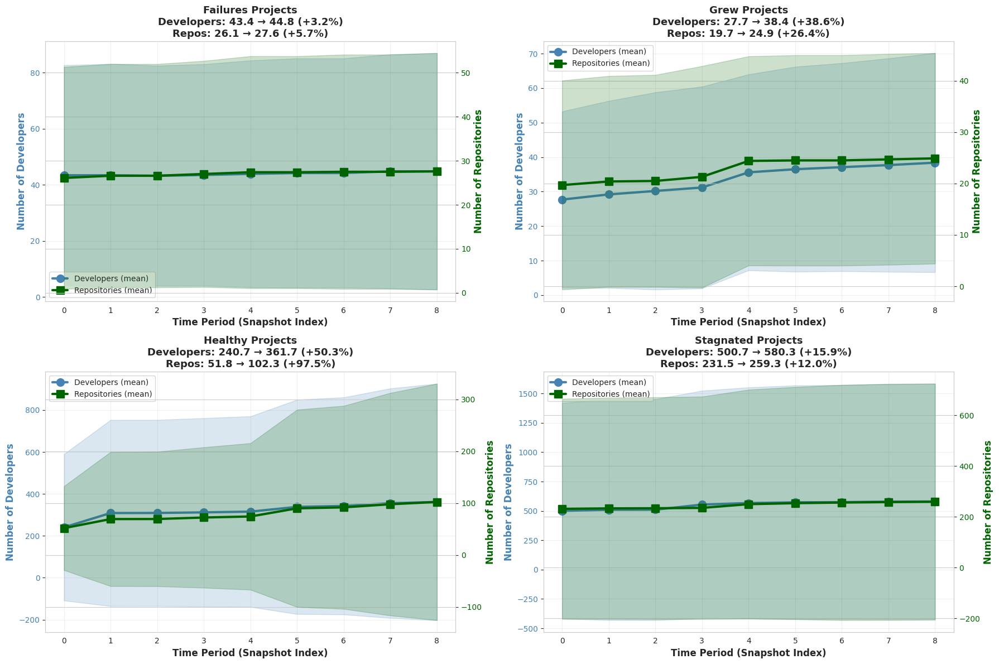


VIZ 2: COMPARATIVE TEAM SIZE TRAJECTORIES

💾 Saved: results_cache/team_size_comparative.png


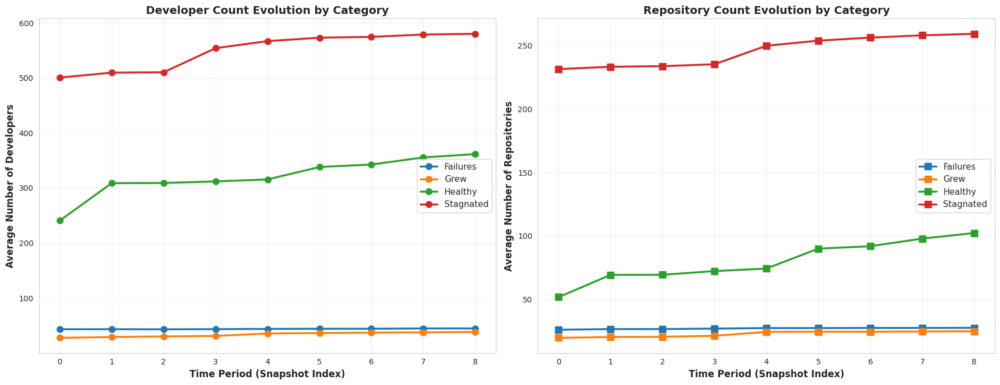


VIZ 3: INDIVIDUAL PROJECT TRAJECTORIES

💾 Saved: results_cache/team_size_individual_Grew.png


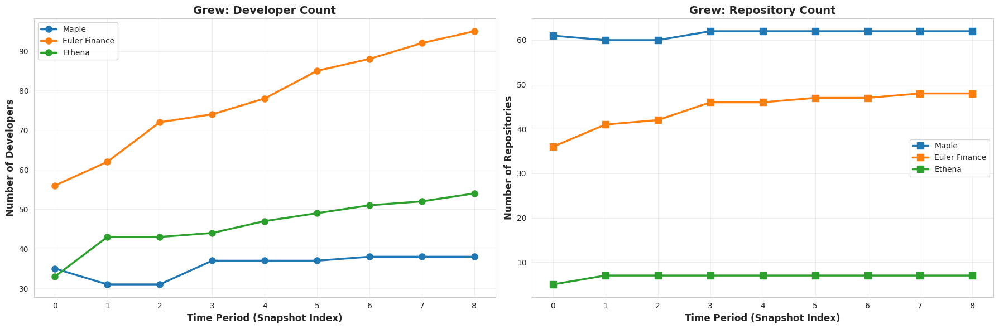


💾 Saved: results_cache/team_size_individual_Healthy.png


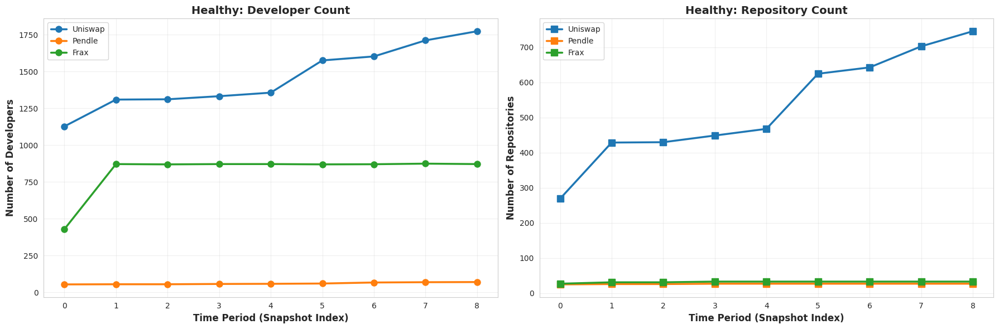


💾 Saved: results_cache/team_size_individual_Failures.png


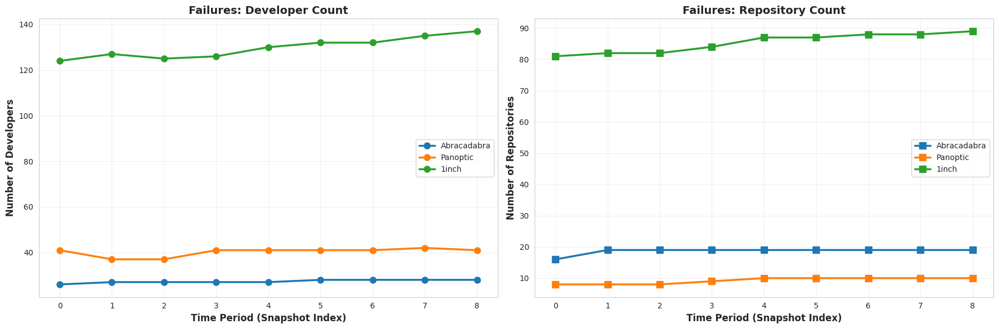


💾 Saved: results_cache/team_size_individual_Stagnated.png


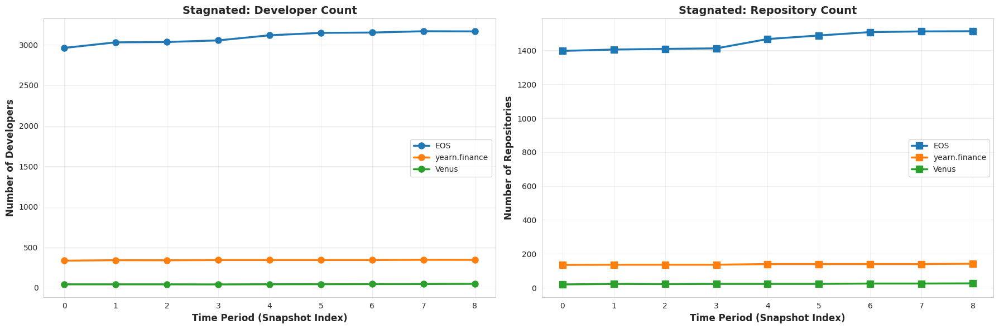


VIZ 4: DEVELOPER & REPO DEPARTURES/ARRIVALS

💾 Saved: results_cache/team_departures_arrivals.png


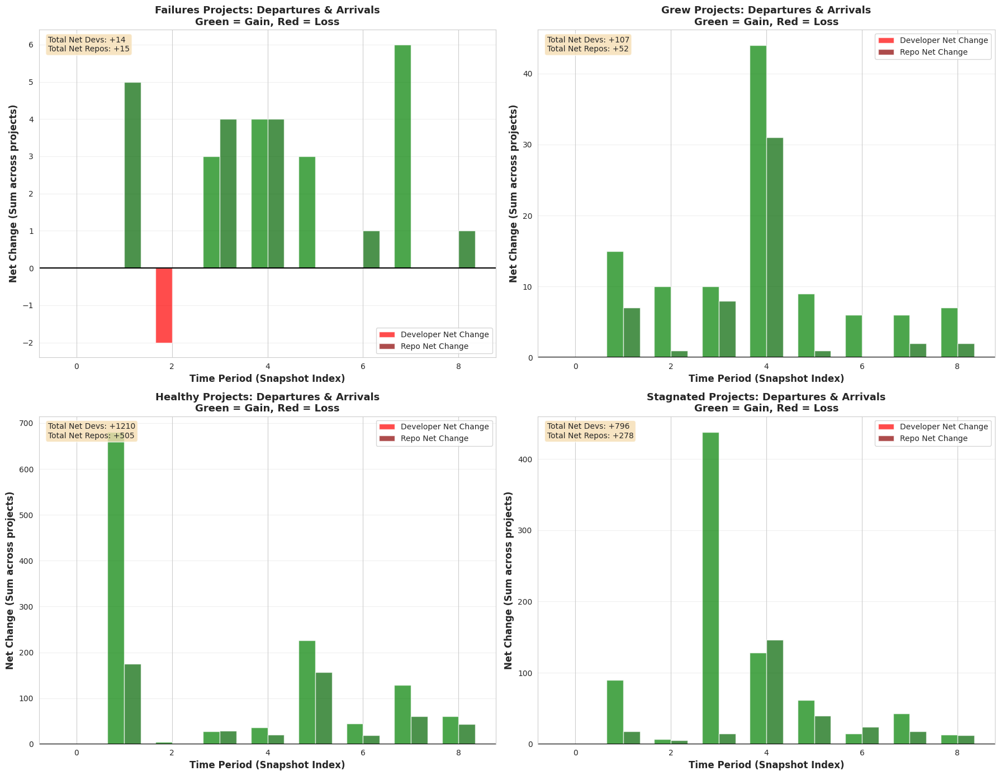


VIZ 5: PROJECT-LEVEL DEPARTURE PATTERNS

💾 Saved: results_cache/departures_by_project_Failures.png


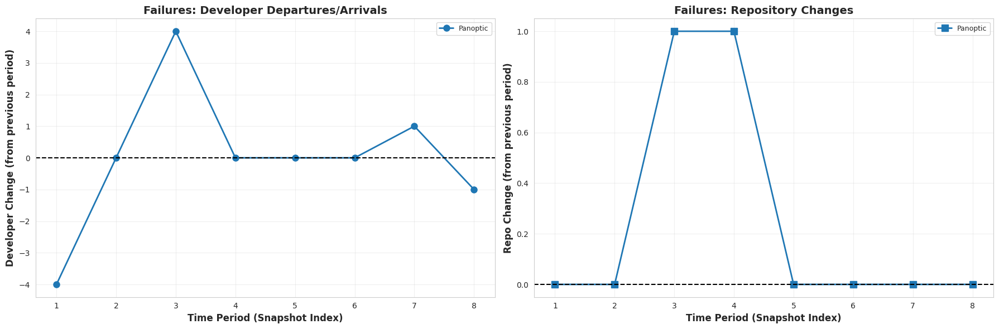


💾 Saved: results_cache/departures_by_project_Grew.png


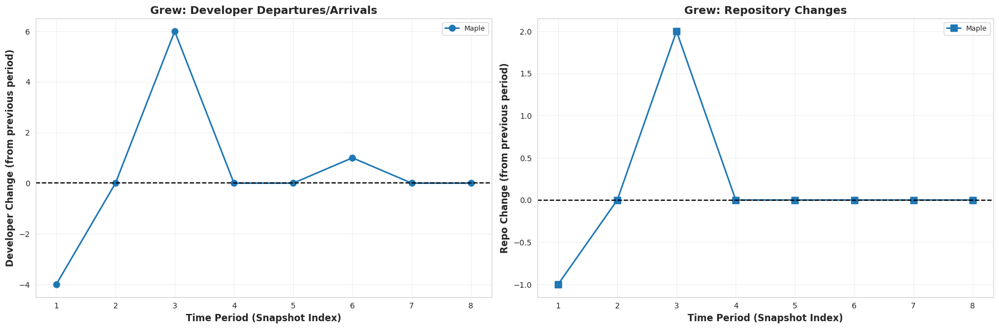


Healthy: No significant departures detected

Stagnated: No significant departures detected

VIZ 6: DEPARTURE/ARRIVAL HEATMAP

💾 Saved: results_cache/departure_arrival_heatmap.png


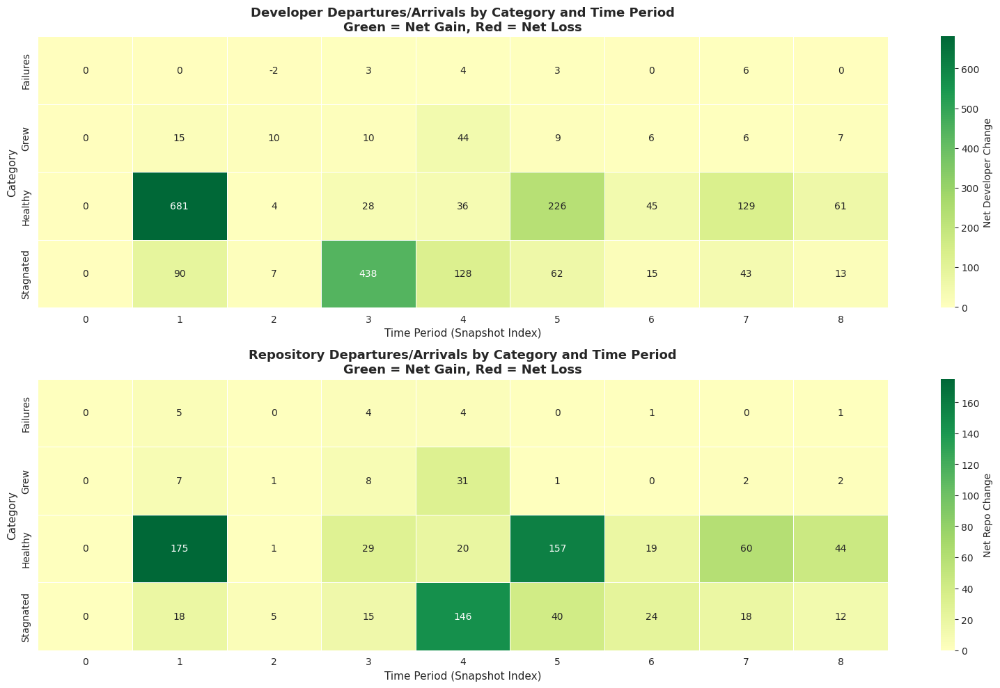


VIZ 7: DEVELOPER-TO-REPOSITORY RATIO

💾 Saved: results_cache/dev_per_repo_ratio.png


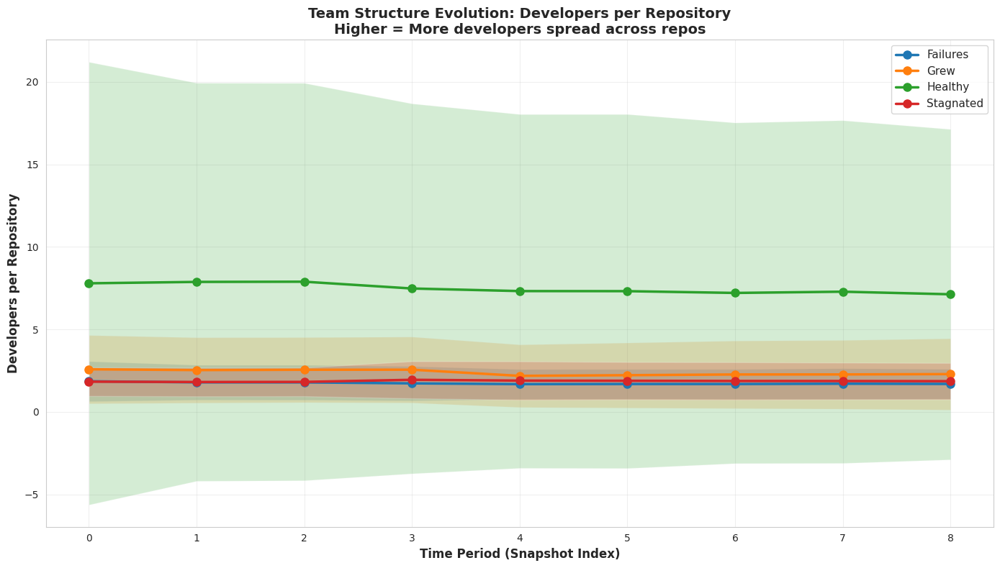


SUMMARY: TEAM SIZE CHANGES & DEPARTURES

Team Size Evolution Summary (with Departures):
 Category  Initial_Devs  Final_Devs  Dev_Change_%  Dev_Departures  Dev_Arrivals  Periods_Dev_Loss  Initial_Repos  Final_Repos  Repo_Change_%  Repo_Departures  Repo_Arrivals  Periods_Repo_Loss  Initial_Ratio  Final_Ratio  Ratio_Change_%
 Failures          43.4        44.8      3.225806           -11.0          25.0                 1           26.1         27.6       5.747126              0.0           15.0                  0       1.662835     1.623188       -2.384292
     Grew          27.7        38.4     38.628159            -5.0         112.0                 0           19.7         24.9      26.395939             -1.0           53.0                  0       1.406091     1.542169        9.677700
  Healthy         240.7       361.7     50.270046           -14.0        1224.0                 0           51.8        102.3      97.490347              0.0          505.0                  0       4.646

In [ ]:
# ===============================================================
# TEAM SIZE EVOLUTION: REPOS & DEVELOPERS OVER TIME
# ===============================================================
# Show how the number of repositories and developers changes
# over time for each category
# ===============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

sns.set_style("whitegrid")
os.makedirs("results_cache", exist_ok=True)

print("=" * 80)
print("TEAM SIZE EVOLUTION ANALYSIS")
print("=" * 80)

# -------------------------------------------------------------------
# LOAD DATA
# -------------------------------------------------------------------

df = graph_df.copy()

# Make sure we have the needed columns
required_cols = ['project_title', 'status', 'snap_idx', 'data_timestamp',
                 'dev_count', 'repo_count']

for col in required_cols:
    if col not in df.columns:
        print(f"⚠️ Missing column: {col}")

print(f"\n✅ Loaded {len(df)} observations")
print(f"   Projects: {df['project_title'].nunique()}")
print(f"   Categories: {df['status'].unique()}")
print(f"   Time periods: {df['snap_idx'].nunique()}")

# -------------------------------------------------------------------
# VISUALIZATION 1: AVERAGE TEAM SIZE BY CATEGORY OVER TIME
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 1: AVERAGE TEAM SIZE BY CATEGORY")
print("=" * 80)

# Compute category averages over time
category_evolution = df.groupby(['status', 'snap_idx']).agg({
    'dev_count': ['mean', 'std', 'min', 'max'],
    'repo_count': ['mean', 'std', 'min', 'max'],
    'project_title': 'count'  # number of projects
}).reset_index()

# Flatten column names
category_evolution.columns = ['_'.join(col).strip('_') if col[1] else col[0]
                              for col in category_evolution.columns.values]

# Rename for clarity
category_evolution.rename(columns={
    'project_title_count': 'n_projects'
}, inplace=True)

print("\nCategory evolution summary:")
print(category_evolution.head(10))

# Create dual-axis plots (developers and repos)
categories = sorted(df['status'].unique())

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

for idx, category in enumerate(categories):
    if idx >= len(axes):
        break

    ax = axes[idx]
    cat_data = category_evolution[category_evolution['status'] == category]

    if cat_data.empty:
        ax.text(0.5, 0.5, f'No data for {category}',
               ha='center', va='center', transform=ax.transAxes)
        continue

    # Plot developers on primary axis
    color_dev = 'steelblue'
    ax.plot(cat_data['snap_idx'], cat_data['dev_count_mean'],
           marker='o', linewidth=3, markersize=10,
           color=color_dev, label='Developers (mean)')

    # Add error bands (±1 std)
    ax.fill_between(cat_data['snap_idx'],
                    cat_data['dev_count_mean'] - cat_data['dev_count_std'],
                    cat_data['dev_count_mean'] + cat_data['dev_count_std'],
                    alpha=0.2, color=color_dev)

    ax.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Developers', fontsize=12, fontweight='bold', color=color_dev)
    ax.tick_params(axis='y', labelcolor=color_dev)

    # Create secondary axis for repos
    ax2 = ax.twinx()
    color_repo = 'darkgreen'
    ax2.plot(cat_data['snap_idx'], cat_data['repo_count_mean'],
            marker='s', linewidth=3, markersize=10,
            color=color_repo, label='Repositories (mean)')

    # Add error bands (±1 std)
    ax2.fill_between(cat_data['snap_idx'],
                     cat_data['repo_count_mean'] - cat_data['repo_count_std'],
                     cat_data['repo_count_mean'] + cat_data['repo_count_std'],
                     alpha=0.2, color=color_repo)

    ax2.set_ylabel('Number of Repositories', fontsize=12, fontweight='bold', color=color_repo)
    ax2.tick_params(axis='y', labelcolor=color_repo)

    # Title with initial vs final values
    initial_devs = cat_data['dev_count_mean'].iloc[0]
    final_devs = cat_data['dev_count_mean'].iloc[-1]
    dev_change = ((final_devs - initial_devs) / initial_devs) * 100 if initial_devs > 0 else 0

    initial_repos = cat_data['repo_count_mean'].iloc[0]
    final_repos = cat_data['repo_count_mean'].iloc[-1]
    repo_change = ((final_repos - initial_repos) / initial_repos) * 100 if initial_repos > 0 else 0

    ax.set_title(f'{category} Projects\n'
                f'Developers: {initial_devs:.1f} → {final_devs:.1f} ({dev_change:+.1f}%)\n'
                f'Repos: {initial_repos:.1f} → {final_repos:.1f} ({repo_change:+.1f}%)',
                fontsize=13, fontweight='bold')

    # Combined legend
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='best', fontsize=10)

    ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('results_cache/team_size_evolution_by_category.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/team_size_evolution_by_category.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 2: SIDE-BY-SIDE COMPARISON
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 2: COMPARATIVE TEAM SIZE TRAJECTORIES")
print("=" * 80)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Panel 1: Developers
ax1 = axes[0]
for category in categories:
    cat_data = category_evolution[category_evolution['status'] == category]
    if not cat_data.empty:
        ax1.plot(cat_data['snap_idx'], cat_data['dev_count_mean'],
                marker='o', linewidth=2.5, markersize=8, label=category)

ax1.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Average Number of Developers', fontsize=12, fontweight='bold')
ax1.set_title('Developer Count Evolution by Category', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

# Panel 2: Repositories
ax2 = axes[1]
for category in categories:
    cat_data = category_evolution[category_evolution['status'] == category]
    if not cat_data.empty:
        ax2.plot(cat_data['snap_idx'], cat_data['repo_count_mean'],
                marker='s', linewidth=2.5, markersize=8, label=category)

ax2.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Average Number of Repositories', fontsize=12, fontweight='bold')
ax2.set_title('Repository Count Evolution by Category', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('results_cache/team_size_comparative.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/team_size_comparative.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 3: INDIVIDUAL PROJECT TRAJECTORIES (TOP PROJECTS)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 3: INDIVIDUAL PROJECT TRAJECTORIES")
print("=" * 80)

# Select representative projects from each category
representative_projects = {
    "Grew": ["Maple", "Euler Finance", "Ethena"],
    "Healthy": ["Uniswap", "Pendle", "Frax"],
    "Failures": ["Abracadabra", "Panoptic", "1inch"],
    "Stagnated": ["EOS", "yearn.finance", "Venus"]
}

for category, projects in representative_projects.items():
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Panel 1: Developers
    ax1 = axes[0]
    for project in projects:
        proj_data = df[df['project_title'] == project].sort_values('snap_idx')
        if not proj_data.empty:
            ax1.plot(proj_data['snap_idx'], proj_data['dev_count'],
                    marker='o', linewidth=2.5, markersize=8, label=project)

    ax1.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Number of Developers', fontsize=12, fontweight='bold')
    ax1.set_title(f'{category}: Developer Count', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(alpha=0.3)

    # Panel 2: Repositories
    ax2 = axes[1]
    for project in projects:
        proj_data = df[df['project_title'] == project].sort_values('snap_idx')
        if not proj_data.empty:
            ax2.plot(proj_data['snap_idx'], proj_data['repo_count'],
                    marker='s', linewidth=2.5, markersize=8, label=project)

    ax2.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Number of Repositories', fontsize=12, fontweight='bold')
    ax2.set_title(f'{category}: Repository Count', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=10)
    ax2.grid(alpha=0.3)

    plt.tight_layout()
    filename = f'results_cache/team_size_individual_{category}.png'
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: {filename}")
    plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 4: PERIOD-OVER-PERIOD CHANGES (Departures & Arrivals)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 4: DEVELOPER & REPO DEPARTURES/ARRIVALS")
print("=" * 80)

# Calculate period-over-period changes
df_sorted = df.sort_values(['project_title', 'snap_idx'])

# Create change columns
df_sorted['dev_change'] = df_sorted.groupby('project_title')['dev_count'].diff()
df_sorted['repo_change'] = df_sorted.groupby('project_title')['repo_count'].diff()

# Classify changes
df_sorted['dev_flow'] = df_sorted['dev_change'].apply(
    lambda x: 'Gain' if x > 0 else ('Loss' if x < 0 else 'Stable')
)
df_sorted['repo_flow'] = df_sorted['repo_change'].apply(
    lambda x: 'Gain' if x > 0 else ('Loss' if x < 0 else 'Stable')
)

# Aggregate by category and time
flow_by_category = df_sorted.groupby(['status', 'snap_idx']).agg({
    'dev_change': ['mean', 'sum', 'count'],
    'repo_change': ['mean', 'sum', 'count']
}).reset_index()

flow_by_category.columns = ['_'.join(col).strip('_') if col[1] else col[0]
                             for col in flow_by_category.columns.values]

# Create flow visualization (stacked bar showing gains/losses)
categories = sorted(df['status'].unique())

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
axes = axes.flatten()

for idx, category in enumerate(categories):
    if idx >= len(axes):
        break

    ax = axes[idx]
    cat_data = df_sorted[df_sorted['status'] == category]

    if cat_data.empty:
        ax.text(0.5, 0.5, f'No data for {category}',
               ha='center', va='center', transform=ax.transAxes)
        continue

    # Aggregate changes by time period
    period_changes = cat_data.groupby('snap_idx').agg({
        'dev_change': ['sum', 'mean'],
        'repo_change': ['sum', 'mean']
    }).reset_index()

    period_changes.columns = ['_'.join(col).strip('_') if col[1] else col[0]
                              for col in period_changes.columns.values]

    # Create bar positions
    x = period_changes['snap_idx']
    width = 0.35

    # Plot developer changes
    dev_colors = ['green' if v > 0 else 'red' for v in period_changes['dev_change_sum']]
    bars1 = ax.bar(x - width/2, period_changes['dev_change_sum'],
                   width, label='Developer Net Change', color=dev_colors, alpha=0.7)

    # Plot repo changes
    repo_colors = ['darkgreen' if v > 0 else 'darkred' for v in period_changes['repo_change_sum']]
    bars2 = ax.bar(x + width/2, period_changes['repo_change_sum'],
                   width, label='Repo Net Change', color=repo_colors, alpha=0.7)

    # Add zero line
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1.5)

    # Labels
    ax.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Net Change (Sum across projects)', fontsize=12, fontweight='bold')
    ax.set_title(f'{category} Projects: Departures & Arrivals\n'
                f'Green = Gain, Red = Loss',
                fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(alpha=0.3, axis='y')

    # Annotate net totals
    total_dev_change = period_changes['dev_change_sum'].sum()
    total_repo_change = period_changes['repo_change_sum'].sum()
    ax.text(0.02, 0.98, f'Total Net Devs: {total_dev_change:+.0f}\nTotal Net Repos: {total_repo_change:+.0f}',
           transform=ax.transAxes, fontsize=10, verticalalignment='top',
           bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.savefig('results_cache/team_departures_arrivals.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/team_departures_arrivals.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 5: INDIVIDUAL PROJECT CHANGE PATTERNS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 5: PROJECT-LEVEL DEPARTURE PATTERNS")
print("=" * 80)

# Show individual projects with most significant departures
for category in categories:
    cat_data = df_sorted[df_sorted['status'] == category].copy()

    if cat_data.empty:
        continue

    # Get projects with most departures
    departure_summary = cat_data.groupby('project_title').agg({
        'dev_change': ['sum', 'min'],  # min = biggest single-period loss
        'repo_change': ['sum', 'min']
    }).reset_index()

    departure_summary.columns = ['_'.join(col).strip('_') if col[1] else col[0]
                                 for col in departure_summary.columns.values]

    # Select projects with significant losses
    significant_projects = departure_summary[
        (departure_summary['dev_change_sum'] < -5) |
        (departure_summary['dev_change_min'] < -3)
    ]['project_title'].tolist()

    if not significant_projects:
        print(f"\n{category}: No significant departures detected")
        continue

    # Limit to top 5 projects with most departures
    significant_projects = significant_projects[:5]

    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Panel 1: Developer changes
    ax1 = axes[0]
    for project in significant_projects:
        proj_data = cat_data[cat_data['project_title'] == project].sort_values('snap_idx')
        if not proj_data.empty:
            ax1.plot(proj_data['snap_idx'], proj_data['dev_change'],
                    marker='o', linewidth=2, markersize=8, label=project)

    ax1.axhline(y=0, color='black', linestyle='--', linewidth=1.5)
    ax1.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Developer Change (from previous period)', fontsize=12, fontweight='bold')
    ax1.set_title(f'{category}: Developer Departures/Arrivals', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=9)
    ax1.grid(alpha=0.3)

    # Panel 2: Repo changes
    ax2 = axes[1]
    for project in significant_projects:
        proj_data = cat_data[cat_data['project_title'] == project].sort_values('snap_idx')
        if not proj_data.empty:
            ax2.plot(proj_data['snap_idx'], proj_data['repo_change'],
                    marker='s', linewidth=2, markersize=8, label=project)

    ax2.axhline(y=0, color='black', linestyle='--', linewidth=1.5)
    ax2.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Repo Change (from previous period)', fontsize=12, fontweight='bold')
    ax2.set_title(f'{category}: Repository Changes', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=9)
    ax2.grid(alpha=0.3)

    plt.tight_layout()
    filename = f'results_cache/departures_by_project_{category}.png'
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: {filename}")
    plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 6: DEPARTURE/ARRIVAL HEATMAP
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 6: DEPARTURE/ARRIVAL HEATMAP")
print("=" * 80)

# Create heatmap showing which periods had most departures/arrivals per category
fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# Developer changes heatmap
ax1 = axes[0]
dev_pivot = df_sorted.groupby(['status', 'snap_idx'])['dev_change'].sum().reset_index()
dev_matrix = dev_pivot.pivot(index='status', columns='snap_idx', values='dev_change')
dev_matrix = dev_matrix.fillna(0)

sns.heatmap(dev_matrix, annot=True, fmt='.0f', cmap='RdYlGn', center=0,
           cbar_kws={'label': 'Net Developer Change'},
           linewidths=0.5, ax=ax1)
ax1.set_title('Developer Departures/Arrivals by Category and Time Period\n'
             'Green = Net Gain, Red = Net Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Time Period (Snapshot Index)', fontsize=11)
ax1.set_ylabel('Category', fontsize=11)

# Repo changes heatmap
ax2 = axes[1]
repo_pivot = df_sorted.groupby(['status', 'snap_idx'])['repo_change'].sum().reset_index()
repo_matrix = repo_pivot.pivot(index='status', columns='snap_idx', values='repo_change')
repo_matrix = repo_matrix.fillna(0)

sns.heatmap(repo_matrix, annot=True, fmt='.0f', cmap='RdYlGn', center=0,
           cbar_kws={'label': 'Net Repo Change'},
           linewidths=0.5, ax=ax2)
ax2.set_title('Repository Departures/Arrivals by Category and Time Period\n'
             'Green = Net Gain, Red = Net Loss', fontsize=13, fontweight='bold')
ax2.set_xlabel('Time Period (Snapshot Index)', fontsize=11)
ax2.set_ylabel('Category', fontsize=11)

plt.tight_layout()
plt.savefig('results_cache/departure_arrival_heatmap.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/departure_arrival_heatmap.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 7: RATIO ANALYSIS (Devs per Repo)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("VIZ 7: DEVELOPER-TO-REPOSITORY RATIO")
print("=" * 80)

# Calculate ratio
df['dev_per_repo'] = df['dev_count'] / (df['repo_count'] + 1e-10)

ratio_evolution = df.groupby(['status', 'snap_idx']).agg({
    'dev_per_repo': ['mean', 'std']
}).reset_index()

ratio_evolution.columns = ['_'.join(col).strip('_') if col[1] else col[0]
                           for col in ratio_evolution.columns.values]

fig, ax = plt.subplots(figsize=(14, 8))

for category in categories:
    cat_data = ratio_evolution[ratio_evolution['status'] == category]
    if not cat_data.empty:
        ax.plot(cat_data['snap_idx'], cat_data['dev_per_repo_mean'],
               marker='o', linewidth=2.5, markersize=8, label=category)

        # Add confidence bands
        ax.fill_between(cat_data['snap_idx'],
                       cat_data['dev_per_repo_mean'] - cat_data['dev_per_repo_std'],
                       cat_data['dev_per_repo_mean'] + cat_data['dev_per_repo_std'],
                       alpha=0.2)

ax.set_xlabel('Time Period (Snapshot Index)', fontsize=12, fontweight='bold')
ax.set_ylabel('Developers per Repository', fontsize=12, fontweight='bold')
ax.set_title('Team Structure Evolution: Developers per Repository\n'
            'Higher = More developers spread across repos',
            fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('results_cache/dev_per_repo_ratio.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/dev_per_repo_ratio.png")
plt.show()

# -------------------------------------------------------------------
# SUMMARY STATISTICS TABLE
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("SUMMARY: TEAM SIZE CHANGES & DEPARTURES")
print("=" * 80)

summary_data = []

for category in categories:
    cat_df = df[df['status'] == category].copy()

    if cat_df.empty:
        continue

    # Get initial and final values
    initial = cat_df[cat_df['snap_idx'] == cat_df['snap_idx'].min()]
    final = cat_df[cat_df['snap_idx'] == cat_df['snap_idx'].max()]

    initial_devs = initial['dev_count'].mean()
    final_devs = final['dev_count'].mean()
    dev_change_pct = ((final_devs - initial_devs) / initial_devs) * 100 if initial_devs > 0 else 0

    initial_repos = initial['repo_count'].mean()
    final_repos = final['repo_count'].mean()
    repo_change_pct = ((final_repos - initial_repos) / initial_repos) * 100 if initial_repos > 0 else 0

    initial_ratio = initial['dev_count'].sum() / initial['repo_count'].sum()
    final_ratio = final['dev_count'].sum() / final['repo_count'].sum()
    ratio_change_pct = ((final_ratio - initial_ratio) / initial_ratio) * 100 if initial_ratio > 0 else 0

    # Calculate departure statistics
    cat_df_sorted = df_sorted[df_sorted['status'] == category]

    # Count periods with net losses
    periods_with_dev_loss = (cat_df_sorted.groupby('snap_idx')['dev_change'].sum() < 0).sum()
    periods_with_repo_loss = (cat_df_sorted.groupby('snap_idx')['repo_change'].sum() < 0).sum()

    # Total departures (sum of all negative changes)
    total_dev_departures = cat_df_sorted[cat_df_sorted['dev_change'] < 0]['dev_change'].sum()
    total_repo_departures = cat_df_sorted[cat_df_sorted['repo_change'] < 0]['repo_change'].sum()

    # Total arrivals (sum of all positive changes)
    total_dev_arrivals = cat_df_sorted[cat_df_sorted['dev_change'] > 0]['dev_change'].sum()
    total_repo_arrivals = cat_df_sorted[cat_df_sorted['repo_change'] > 0]['repo_change'].sum()

    summary_data.append({
        'Category': category,
        'Initial_Devs': initial_devs,
        'Final_Devs': final_devs,
        'Dev_Change_%': dev_change_pct,
        'Dev_Departures': total_dev_departures,
        'Dev_Arrivals': total_dev_arrivals,
        'Periods_Dev_Loss': periods_with_dev_loss,
        'Initial_Repos': initial_repos,
        'Final_Repos': final_repos,
        'Repo_Change_%': repo_change_pct,
        'Repo_Departures': total_repo_departures,
        'Repo_Arrivals': total_repo_arrivals,
        'Periods_Repo_Loss': periods_with_repo_loss,
        'Initial_Ratio': initial_ratio,
        'Final_Ratio': final_ratio,
        'Ratio_Change_%': ratio_change_pct
    })

summary_df = pd.DataFrame(summary_data)

print("\nTeam Size Evolution Summary (with Departures):")
print("="*140)
print(summary_df.to_string(index=False))

summary_df.to_csv('results_cache/team_size_summary.csv', index=False)
print("\n💾 Saved: results_cache/team_size_summary.csv")

# -------------------------------------------------------------------
# DETAILED STATS BY PROJECT (INCLUDING DEPARTURES)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("PROJECT-LEVEL DETAILS (WITH DEPARTURES)")
print("=" * 80)

project_details = []

for project in df['project_title'].unique():
    proj_df = df[df['project_title'] == project].sort_values('snap_idx')
    proj_df_sorted = df_sorted[df_sorted['project_title'] == project].sort_values('snap_idx')

    if len(proj_df) < 2:
        continue

    category = proj_df['status'].iloc[0]

    initial_devs = proj_df['dev_count'].iloc[0]
    final_devs = proj_df['dev_count'].iloc[-1]
    dev_change_pct = ((final_devs - initial_devs) / initial_devs) * 100 if initial_devs > 0 else 0

    initial_repos = proj_df['repo_count'].iloc[0]
    final_repos = proj_df['repo_count'].iloc[-1]
    repo_change_pct = ((final_repos - initial_repos) / initial_repos) * 100 if initial_repos > 0 else 0

    # Calculate departure metrics
    total_dev_departures = proj_df_sorted[proj_df_sorted['dev_change'] < 0]['dev_change'].sum()
    total_dev_arrivals = proj_df_sorted[proj_df_sorted['dev_change'] > 0]['dev_change'].sum()
    max_single_dev_loss = proj_df_sorted['dev_change'].min() if not proj_df_sorted.empty else 0

    total_repo_departures = proj_df_sorted[proj_df_sorted['repo_change'] < 0]['repo_change'].sum()
    total_repo_arrivals = proj_df_sorted[proj_df_sorted['repo_change'] > 0]['repo_change'].sum()
    max_single_repo_loss = proj_df_sorted['repo_change'].min() if not proj_df_sorted.empty else 0

    # Count periods with losses
    periods_with_dev_loss = (proj_df_sorted['dev_change'] < 0).sum()
    periods_with_repo_loss = (proj_df_sorted['repo_change'] < 0).sum()

    project_details.append({
        'Project': project,
        'Category': category,
        'Initial_Devs': initial_devs,
        'Final_Devs': final_devs,
        'Dev_Change_%': dev_change_pct,
        'Total_Dev_Departures': total_dev_departures,
        'Total_Dev_Arrivals': total_dev_arrivals,
        'Max_Dev_Loss_Single_Period': max_single_dev_loss,
        'Periods_Dev_Loss': periods_with_dev_loss,
        'Initial_Repos': initial_repos,
        'Final_Repos': final_repos,
        'Repo_Change_%': repo_change_pct,
        'Total_Repo_Departures': total_repo_departures,
        'Total_Repo_Arrivals': total_repo_arrivals,
        'Max_Repo_Loss_Single_Period': max_single_repo_loss,
        'Periods_Repo_Loss': periods_with_repo_loss
    })

project_details_df = pd.DataFrame(project_details)
project_details_df = project_details_df.sort_values(['Category', 'Total_Dev_Departures'], ascending=[True, True])

print("\nProject-Level Team Size Changes (with Departures):")
print("="*160)
print(project_details_df.to_string(index=False))

project_details_df.to_csv('results_cache/team_size_by_project.csv', index=False)
print("\n💾 Saved: results_cache/team_size_by_project.csv")

print("\n✅ TEAM SIZE EVOLUTION ANALYSIS COMPLETE")
print("=" * 80)
print("\nGenerated files:")
print("  - team_size_evolution_by_category.png")
print("  - team_size_comparative.png")
print("  - team_size_individual_{category}.png (4 files)")
print("  - team_departures_arrivals.png (NEW)")
print("  - departures_by_project_{category}.png (4 files, NEW)")
print("  - departure_arrival_heatmap.png (NEW)")
print("  - dev_per_repo_ratio.png")
print("  - team_size_summary.csv (with departure metrics)")
print("  - team_size_by_project.csv (with departure metrics)")

In [ ]:
# -------------------------------------------------------------------
# STEP 5: STATISTICAL TESTS FOR VOLATILITY DIFFERENCES
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("STEP 5: STATISTICAL TESTS FOR VOLATILITY DIFFERENCES")
print("=" * 80)

from scipy import stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Frobenius norm data
frob_df = pd.read_csv("results_cache/project_level_frobenius_diffs.csv")

print(f"\nLoaded {len(frob_df)} Frobenius norm observations")
print(f"Projects: {frob_df['project'].nunique()}")

# Add category labels
failures = ['Abracadabra', 'Panoptic', 'SuperRare', '1inch', 'UniLend']
stagnated = ['Opium Network', 'EOS', 'yearn.finance', 'Venus', 'Horizon Protocol']

frob_df['category'] = frob_df['project'].apply(
    lambda x: 'Failures' if x in failures else 'Stagnated' if x in stagnated else 'Unknown'
)

# -------------------------------------------------------------------
# 1. DESCRIPTIVE STATISTICS BY CATEGORY
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("1. DESCRIPTIVE STATISTICS BY CATEGORY")
print("=" * 80)

desc_stats = frob_df.groupby('category')['frob_norm_diff'].describe()
print("\n", desc_stats)

# Additional statistics
print("\nAdditional Statistics:")
print("-" * 80)
for cat in ['Failures', 'Stagnated']:
    cat_data = frob_df[frob_df['category'] == cat]['frob_norm_diff']
    print(f"\n{cat}:")
    print(f"  Mean:     {cat_data.mean():.6f}")
    print(f"  Median:   {cat_data.median():.6f}")
    print(f"  Std:      {cat_data.std():.6f}")
    print(f"  Min:      {cat_data.min():.6f}")
    print(f"  Max:      {cat_data.max():.6f}")
    print(f"  Q1:       {cat_data.quantile(0.25):.6f}")
    print(f"  Q3:       {cat_data.quantile(0.75):.6f}")
    print(f"  IQR:      {cat_data.quantile(0.75) - cat_data.quantile(0.25):.6f}")
    print(f"  N:        {len(cat_data)}")

# -------------------------------------------------------------------
# 2. KRUSKAL-WALLIS TEST (Non-parametric ANOVA)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("2. KRUSKAL-WALLIS TEST")
print("=" * 80)

print("\nNull Hypothesis: The distributions of Frobenius norms are the same across categories")
print("Alternative: At least one category has a different distribution")

# Prepare data for test
failures_data = frob_df[frob_df['category'] == 'Failures']['frob_norm_diff']
stagnated_data = frob_df[frob_df['category'] == 'Stagnated']['frob_norm_diff']

# Kruskal-Wallis test
h_stat, p_value = stats.kruskal(failures_data, stagnated_data)

print(f"\nKruskal-Wallis H-statistic: {h_stat:.4f}")
print(f"p-value: {p_value:.6f}")

if p_value < 0.001:
    print(f"Result: *** HIGHLY SIGNIFICANT (p < 0.001)")
    print("Strong evidence that volatility distributions differ between categories")
elif p_value < 0.01:
    print(f"Result: ** SIGNIFICANT (p < 0.01)")
    print("Evidence that volatility distributions differ between categories")
elif p_value < 0.05:
    print(f"Result: * SIGNIFICANT (p < 0.05)")
    print("Some evidence that volatility distributions differ between categories")
else:
    print(f"Result: NOT SIGNIFICANT (p >= 0.05)")
    print("Insufficient evidence that volatility distributions differ")

# -------------------------------------------------------------------
# 3. MANN-WHITNEY U TEST (Pairwise comparison)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("3. MANN-WHITNEY U TEST (Failures vs Stagnated)")
print("=" * 80)

print("\nNull Hypothesis: The two distributions are the same")
print("Alternative: Stagnated has higher volatility than Failures")

u_stat, p_value_mw = stats.mannwhitneyu(
    stagnated_data,
    failures_data,
    alternative='greater'  # Test if stagnated > failures
)

print(f"\nMann-Whitney U-statistic: {u_stat:.4f}")
print(f"p-value (one-tailed): {p_value_mw:.6f}")

if p_value_mw < 0.001:
    print(f"Result: *** HIGHLY SIGNIFICANT (p < 0.001)")
    print("Strong evidence that Stagnated has higher volatility than Failures")
elif p_value_mw < 0.01:
    print(f"Result: ** SIGNIFICANT (p < 0.01)")
    print("Evidence that Stagnated has higher volatility than Failures")
elif p_value_mw < 0.05:
    print(f"Result: * SIGNIFICANT (p < 0.05)")
    print("Some evidence that Stagnated has higher volatility than Failures")
else:
    print(f"Result: NOT SIGNIFICANT (p >= 0.05)")
    print("Insufficient evidence that Stagnated differs from Failures")

# Effect size (rank-biserial correlation)
n1 = len(failures_data)
n2 = len(stagnated_data)
rank_biserial = 1 - (2*u_stat) / (n1 * n2)

print(f"\nEffect size (rank-biserial correlation): {rank_biserial:.4f}")
if abs(rank_biserial) < 0.1:
    effect_interp = "negligible"
elif abs(rank_biserial) < 0.3:
    effect_interp = "small"
elif abs(rank_biserial) < 0.5:
    effect_interp = "medium"
else:
    effect_interp = "large"
print(f"Interpretation: {effect_interp} effect")

# -------------------------------------------------------------------
# 4. LEVENE'S TEST (Test for equal variances)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("4. LEVENE'S TEST FOR EQUAL VARIANCES")
print("=" * 80)

print("\nNull Hypothesis: The variances are equal across categories")

levene_stat, p_value_levene = stats.levene(failures_data, stagnated_data)

print(f"\nLevene's statistic: {levene_stat:.4f}")
print(f"p-value: {p_value_levene:.6f}")

if p_value_levene < 0.05:
    print("Result: SIGNIFICANT - variances are significantly different")
    print("Heteroscedasticity present (different spread in volatility)")
else:
    print("Result: NOT SIGNIFICANT - variances are similar")
    print("Homoscedasticity assumed (similar spread in volatility)")

# -------------------------------------------------------------------
# 5. VISUALIZATION: DISTRIBUTIONS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("5. CREATING VISUALIZATION")
print("=" * 80)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Box plot
ax1 = axes[0, 0]
sns.boxplot(data=frob_df, x='category', y='frob_norm_diff', ax=ax1, palette='Set2')
ax1.set_title('Frobenius Norm Distribution by Category', fontsize=12, fontweight='bold')
ax1.set_xlabel('Category', fontsize=11)
ax1.set_ylabel('Frobenius Norm of ΔA', fontsize=11)
ax1.grid(alpha=0.3, axis='y')

# Add sample sizes
for i, cat in enumerate(['Failures', 'Stagnated']):
    n = len(frob_df[frob_df['category'] == cat])
    ax1.text(i, ax1.get_ylim()[1] * 0.95, f'n={n}',
             ha='center', va='top', fontsize=10, fontweight='bold')

# Plot 2: Violin plot
ax2 = axes[0, 1]
sns.violinplot(data=frob_df, x='category', y='frob_norm_diff', ax=ax2, palette='Set2')
ax2.set_title('Frobenius Norm Distribution (Violin)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Category', fontsize=11)
ax2.set_ylabel('Frobenius Norm of ΔA', fontsize=11)
ax2.grid(alpha=0.3, axis='y')

# Plot 3: Histogram with KDE
ax3 = axes[1, 0]
for cat, color in zip(['Failures', 'Stagnated'], ['#66c2a5', '#fc8d62']):
    cat_data = frob_df[frob_df['category'] == cat]['frob_norm_diff']
    ax3.hist(cat_data, bins=15, alpha=0.5, label=cat, color=color, edgecolor='black')

    # Add KDE
    from scipy.stats import gaussian_kde
    if len(cat_data) > 1:
        kde = gaussian_kde(cat_data)
        x_range = np.linspace(cat_data.min(), cat_data.max(), 100)
        kde_values = kde(x_range) * len(cat_data) * (cat_data.max() - cat_data.min()) / 15
        ax3.plot(x_range, kde_values, color=color, linewidth=2, label=f'{cat} KDE')

ax3.set_title('Histogram with Kernel Density Estimate', fontsize=12, fontweight='bold')
ax3.set_xlabel('Frobenius Norm of ΔA', fontsize=11)
ax3.set_ylabel('Frequency', fontsize=11)
ax3.legend()
ax3.grid(alpha=0.3, axis='y')

# Plot 4: Cumulative distribution
ax4 = axes[1, 1]
for cat, color in zip(['Failures', 'Stagnated'], ['#66c2a5', '#fc8d62']):
    cat_data = sorted(frob_df[frob_df['category'] == cat]['frob_norm_diff'])
    cumulative = np.arange(1, len(cat_data) + 1) / len(cat_data)
    ax4.plot(cat_data, cumulative, label=cat, linewidth=2, marker='o',
             markersize=4, color=color)

ax4.set_title('Cumulative Distribution Function', fontsize=12, fontweight='bold')
ax4.set_xlabel('Frobenius Norm of ΔA', fontsize=11)
ax4.set_ylabel('Cumulative Probability', fontsize=11)
ax4.legend()
ax4.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('results_cache/project_volatility_statistical_tests.png', dpi=200, bbox_inches='tight')
print("💾 Saved: results_cache/project_volatility_statistical_tests.png")
plt.show()

# -------------------------------------------------------------------
# 6. PROJECT-LEVEL COMPARISON
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("6. PROJECT-LEVEL VOLATILITY RANKING")
print("=" * 80)

project_volatility = frob_df.groupby('project').agg({
    'frob_norm_diff': ['mean', 'median', 'std', 'min', 'max', 'count']
}).round(6)

project_volatility.columns = ['Mean', 'Median', 'Std', 'Min', 'Max', 'N']
project_volatility = project_volatility.sort_values('Mean', ascending=False)

# Add category
project_volatility['Category'] = project_volatility.index.map(
    lambda x: 'Failures' if x in failures else 'Stagnated'
)

print("\nProject Volatility Summary (sorted by mean):")
print("=" * 100)
print(project_volatility.to_string())

# -------------------------------------------------------------------
# 7. SUMMARY REPORT
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("7. SUMMARY REPORT")
print("=" * 80)

print(f"""
STATISTICAL TEST RESULTS:
========================

1. Kruskal-Wallis Test (Overall difference):
   H-statistic: {h_stat:.4f}
   p-value: {p_value:.6f}
   Conclusion: {'SIGNIFICANT' if p_value < 0.05 else 'NOT SIGNIFICANT'}

2. Mann-Whitney U Test (Stagnated > Failures):
   U-statistic: {u_stat:.4f}
   p-value: {p_value_mw:.6f}
   Effect size: {rank_biserial:.4f} ({effect_interp})
   Conclusion: {'SIGNIFICANT' if p_value_mw < 0.05 else 'NOT SIGNIFICANT'}

3. Levene's Test (Equal variances):
   Statistic: {levene_stat:.4f}
   p-value: {p_value_levene:.6f}
   Conclusion: {'Variances differ' if p_value_levene < 0.05 else 'Variances similar'}

DESCRIPTIVE STATISTICS:
======================

Failures:
  Mean: {failures_data.mean():.6f}
  Median: {failures_data.median():.6f}
  Std: {failures_data.std():.6f}

Stagnated:
  Mean: {stagnated_data.mean():.6f}
  Median: {stagnated_data.median():.6f}
  Std: {stagnated_data.std():.6f}

Ratio (Stagnated / Failures):
  Mean ratio: {stagnated_data.mean() / failures_data.mean():.2f}x
  Median ratio: {stagnated_data.median() / failures_data.median():.2f}x

INTERPRETATION:
==============

The Kruskal-Wallis test indicates {'significant' if p_value < 0.05 else 'no significant'}
differences in volatility distributions between Failures and Stagnated categories.

Stagnated projects show {'higher' if stagnated_data.mean() > failures_data.mean() else 'lower'}
mean volatility ({stagnated_data.mean():.6f} vs {failures_data.mean():.6f}).

This {'supports' if p_value_mw < 0.05 else 'does not support'} the hypothesis that
Stagnated projects exhibit different volatility patterns than Failed projects.
""")

# Save summary statistics
summary_stats = pd.DataFrame({
    'Category': ['Failures', 'Stagnated'],
    'Mean': [failures_data.mean(), stagnated_data.mean()],
    'Median': [failures_data.median(), stagnated_data.median()],
    'Std': [failures_data.std(), stagnated_data.std()],
    'Min': [failures_data.min(), stagnated_data.min()],
    'Max': [failures_data.max(), stagnated_data.max()],
    'N': [len(failures_data), len(stagnated_data)]
})

summary_stats.to_csv('results_cache/project_volatility_summary_stats.csv', index=False)
print("\n💾 Saved: results_cache/project_volatility_summary_stats.csv")

# Save test results
test_results = pd.DataFrame({
    'Test': ['Kruskal-Wallis', 'Mann-Whitney U', 'Levene'],
    'Statistic': [h_stat, u_stat, levene_stat],
    'p_value': [p_value, p_value_mw, p_value_levene],
    'Significant': [p_value < 0.05, p_value_mw < 0.05, p_value_levene < 0.05]
})

test_results.to_csv('results_cache/project_volatility_test_results.csv', index=False)
print("💾 Saved: results_cache/project_volatility_test_results.csv")

print("\n✅ STATISTICAL ANALYSIS COMPLETE")
print("=" * 80)


STEP 5: STATISTICAL TESTS FOR VOLATILITY DIFFERENCES


FileNotFoundError: [Errno 2] No such file or directory: 'results_cache/project_level_frobenius_diffs.csv'

In [ ]:
import shutil
from google.colab import files

# Create a zip file of the results_cache folder
shutil.make_archive('results_cache', 'zip', 'results_cache')

# Download the zip file
files.download('results_cache.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# -------------------------------------------------------------------
# CATEGORY-LEVEL FROBENIUS NORM STATISTICS
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("CATEGORY-LEVEL FROBENIUS NORM STATISTICS")
print("=" * 80)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the category-level Frobenius data
# This should be from your original rolling VAR analysis at category level
category_frob_df = pd.read_csv("results_cache/rolling_var_matrix_frobenius_diffs.csv")

print(f"\nLoaded {len(category_frob_df)} category-level Frobenius observations")
print(f"Categories: {category_frob_df['category'].unique()}")

# -------------------------------------------------------------------
# 1. OVERALL STATISTICS BY CATEGORY
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("1. OVERALL STATISTICS (MEAN, VARIANCE, PEAK)")
print("=" * 80)

stats_by_category = []

for cat in category_frob_df['category'].unique():
    cat_data = category_frob_df[category_frob_df['category'] == cat].copy()

    # Calculate statistics
    mean_frob = cat_data['frob_norm_diff'].mean()
    variance = cat_data['frob_norm_diff'].var()
    std = cat_data['frob_norm_diff'].std()
    median = cat_data['frob_norm_diff'].median()

    # Find peak period (maximum Frobenius norm)
    peak_idx = cat_data['frob_norm_diff'].idxmax()
    peak_row = cat_data.loc[peak_idx]
    peak_value = peak_row['frob_norm_diff']
    peak_snap = peak_row['center_snap_curr']

    # Also get the time period
    peak_snap_prev = peak_row['center_snap_prev']

    stats_by_category.append({
        'Category': cat,
        'Mean_Frobenius': mean_frob,
        'Variance': variance,
        'Std_Dev': std,
        'Median': median,
        'Peak_Value': peak_value,
        'Peak_Snapshot': peak_snap,
        'Peak_Period': f"{peak_snap_prev:.0f}→{peak_snap:.0f}",
        'N_Observations': len(cat_data)
    })

stats_df = pd.DataFrame(stats_by_category)
stats_df = stats_df.sort_values('Mean_Frobenius', ascending=False)

print("\nCategory Statistics Summary:")
print("=" * 120)
print(stats_df.to_string(index=False))

# Save to CSV
stats_df.to_csv('results_cache/category_frobenius_statistics.csv', index=False)
print("\n💾 Saved: results_cache/category_frobenius_statistics.csv")

# -------------------------------------------------------------------
# 2. DETAILED BREAKDOWN WITH FORMATTING
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("2. DETAILED BREAKDOWN BY CATEGORY")
print("=" * 80)

for _, row in stats_df.iterrows():
    print(f"\n{row['Category'].upper()}")
    print("-" * 80)
    print(f"  Mean Frobenius Norm:     {row['Mean_Frobenius']:8.4f}")
    print(f"  Variance:                {row['Variance']:8.4f}")
    print(f"  Standard Deviation:      {row['Std_Dev']:8.4f}")
    print(f"  Median:                  {row['Median']:8.4f}")
    print(f"  Peak Value:              {row['Peak_Value']:8.4f}")
    print(f"  Peak Period:             {row['Peak_Period']}")
    print(f"  Peak Snapshot:           {row['Peak_Snapshot']:.0f}")
    print(f"  N Observations:          {row['N_Observations']:.0f}")

    # Calculate coefficient of variation
    cv = row['Std_Dev'] / row['Mean_Frobenius'] if row['Mean_Frobenius'] != 0 else np.nan
    print(f"  Coefficient of Variation: {cv:8.4f} ({cv*100:.1f}%)")

# -------------------------------------------------------------------
# 3. TRAJECTORY ANALYSIS (How does volatility change over time?)
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("3. VOLATILITY TRAJECTORY OVER TIME")
print("=" * 80)

print("\nFrobenius Norm by Snapshot Period (All Categories):")
print("=" * 120)
print(f"{'Snapshot':>10} {'Grew':>12} {'Healthy':>12} {'Stagnated':>12} {'Failures':>12}")
print("-" * 120)

# Get all unique snapshots
all_snaps = sorted(category_frob_df['center_snap_curr'].unique())

for snap in all_snaps:
    snap_data = category_frob_df[category_frob_df['center_snap_curr'] == snap]

    row_str = f"{snap:>10.0f}"
    for cat in ['Grew', 'Healthy', 'Stagnated', 'Failures']:
        cat_snap = snap_data[snap_data['category'] == cat]
        if not cat_snap.empty:
            val = cat_snap['frob_norm_diff'].iloc[0]
            row_str += f" {val:>12.4f}"
        else:
            row_str += f" {'-':>12}"
    print(row_str)

# -------------------------------------------------------------------
# 4. COMPARATIVE RATIOS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("4. COMPARATIVE RATIOS (Relative to Failures)")
print("=" * 80)

failures_mean = stats_df[stats_df['Category'] == 'Failures']['Mean_Frobenius'].iloc[0]
failures_var = stats_df[stats_df['Category'] == 'Failures']['Variance'].iloc[0]

print(f"\nBaseline (Failures): Mean = {failures_mean:.4f}, Variance = {failures_var:.4f}")
print("\nRatios:")
print("-" * 80)
print(f"{'Category':<15} {'Mean Ratio':>15} {'Variance Ratio':>20} {'Interpretation':<30}")
print("-" * 80)

for _, row in stats_df.iterrows():
    if row['Category'] == 'Failures':
        continue

    mean_ratio = row['Mean_Frobenius'] / failures_mean if failures_mean != 0 else np.nan
    var_ratio = row['Variance'] / failures_var if failures_var != 0 else np.nan

    if mean_ratio > 5:
        interp = "Much higher volatility"
    elif mean_ratio > 2:
        interp = "Higher volatility"
    elif mean_ratio > 1.2:
        interp = "Moderately higher"
    else:
        interp = "Similar volatility"

    print(f"{row['Category']:<15} {mean_ratio:>14.2f}x {var_ratio:>19.2f}x {interp:<30}")

# -------------------------------------------------------------------
# 5. VISUALIZATION: SUMMARY STATISTICS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("5. CREATING VISUALIZATIONS")
print("=" * 80)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Mean Frobenius by Category (Bar chart)
ax1 = axes[0, 0]
colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12']  # Red, Blue, Green, Orange
bars = ax1.bar(stats_df['Category'], stats_df['Mean_Frobenius'], color=colors, alpha=0.7, edgecolor='black')
ax1.set_title('Mean Frobenius Norm by Category', fontsize=13, fontweight='bold')
ax1.set_xlabel('Category', fontsize=11)
ax1.set_ylabel('Mean Frobenius Norm', fontsize=11)
ax1.grid(alpha=0.3, axis='y')
# Add values on bars
for bar, val in zip(bars, stats_df['Mean_Frobenius']):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{val:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Plot 2: Variance by Category (Bar chart)
ax2 = axes[0, 1]
bars2 = ax2.bar(stats_df['Category'], stats_df['Variance'], color=colors, alpha=0.7, edgecolor='black')
ax2.set_title('Variance in Frobenius Norm by Category', fontsize=13, fontweight='bold')
ax2.set_xlabel('Category', fontsize=11)
ax2.set_ylabel('Variance', fontsize=11)
ax2.grid(alpha=0.3, axis='y')
# Add values on bars
for bar, val in zip(bars2, stats_df['Variance']):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
             f'{val:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Plot 3: Trajectory over time (Line plot)
ax3 = axes[1, 0]
for cat in ['Grew', 'Healthy', 'Stagnated', 'Failures']:
    cat_data = category_frob_df[category_frob_df['category'] == cat].sort_values('center_snap_curr')
    ax3.plot(cat_data['center_snap_curr'], cat_data['frob_norm_diff'],
             marker='o', linewidth=2, label=cat, markersize=8)

ax3.set_title('Frobenius Norm Trajectory Over Time', fontsize=13, fontweight='bold')
ax3.set_xlabel('Center Snapshot', fontsize=11)
ax3.set_ylabel('Frobenius Norm', fontsize=11)
ax3.legend(loc='best', fontsize=10)
ax3.grid(alpha=0.3)

# Plot 4: Peak values comparison (Bar chart)
ax4 = axes[1, 1]
bars4 = ax4.bar(stats_df['Category'], stats_df['Peak_Value'], color=colors, alpha=0.7, edgecolor='black')
ax4.set_title('Peak Frobenius Norm by Category', fontsize=13, fontweight='bold')
ax4.set_xlabel('Category', fontsize=11)
ax4.set_ylabel('Peak Value', fontsize=11)
ax4.grid(alpha=0.3, axis='y')
# Add peak snapshots as text
for i, (bar, peak_snap, peak_val) in enumerate(zip(bars4, stats_df['Peak_Snapshot'], stats_df['Peak_Value'])):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height,
             f'{peak_val:.2f}\n(t={peak_snap:.0f})',
             ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('results_cache/category_frobenius_summary_statistics.png', dpi=200, bbox_inches='tight')
print("💾 Saved: results_cache/category_frobenius_summary_statistics.png")
plt.show()

# -------------------------------------------------------------------
# 6. SINGLE-ROW SUMMARY TABLE FOR THESIS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("6. THESIS-READY SUMMARY TABLE")
print("=" * 80)

thesis_table = stats_df[['Category', 'Mean_Frobenius', 'Variance', 'Peak_Value', 'Peak_Snapshot']].copy()
thesis_table.columns = ['Category', 'Mean ||ΔA||_F', 'Variance', 'Peak Value', 'Peak Time (t)']

print("\nTable: System-Level Volatility Statistics by Category")
print("=" * 100)
print(thesis_table.to_string(index=False))

# Also create a transposed version for easy copying
print("\n\nAlternative Format (Transposed for easy thesis inclusion):")
print("=" * 100)

thesis_transposed = thesis_table.set_index('Category').T
print(thesis_transposed.to_string())

thesis_transposed.to_csv('results_cache/category_frobenius_thesis_table.csv')
print("\n💾 Saved: results_cache/category_frobenius_thesis_table.csv")

# -------------------------------------------------------------------
# 7. VOLATILITY CONSISTENCY ANALYSIS
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("7. VOLATILITY CONSISTENCY ANALYSIS")
print("=" * 80)

print("\nCoefficient of Variation (CV = Std/Mean):")
print("Lower CV = More consistent volatility")
print("Higher CV = More variable/erratic volatility")
print("-" * 80)

for _, row in stats_df.iterrows():
    cv = row['Std_Dev'] / row['Mean_Frobenius'] if row['Mean_Frobenius'] != 0 else np.nan

    if cv < 0.3:
        consistency = "Very consistent"
    elif cv < 0.5:
        consistency = "Moderately consistent"
    elif cv < 0.8:
        consistency = "Variable"
    else:
        consistency = "Highly erratic"

    print(f"{row['Category']:<15} CV = {cv:6.3f} ({cv*100:5.1f}%)  →  {consistency}")

print("\n✅ CATEGORY-LEVEL FROBENIUS STATISTICS COMPLETE")
print("=" * 80)


CATEGORY-LEVEL FROBENIUS NORM STATISTICS


FileNotFoundError: [Errno 2] No such file or directory: 'results_cache/rolling_var_matrix_frobenius_diffs.csv'

DEEP DIVE: 4 PROJECT ANALYSIS

Analyzing projects:
  - Maple (Grew)
  - UniLend (Failure)
  - EOS (Stagnated)
  - Uniswap (Healthy)

✅ Loaded 36 observations across 4 projects

PART 1: METRIC TRAJECTORIES

PROJECT: Maple (Grew)

Bus Factor:
  Trend: stable
  Volatility: low
  Overall Change: -8.1%
  R²: 0.000
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 1

Density:
  Trend: stable
  Volatility: low
  Overall Change: -5.2%
  R²: 0.492
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 1

Gini (Inequality):
  Trend: stable
  Volatility: low
  Overall Change: -0.6%
  R²: 0.452
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 1

Redundancy:
  Trend: stable
  Volatility: low
  Overall Change: -5.2%
  R²: 0.735
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Vulnerability (Critical Fraction):
  Trend: stable
  Volatility: low
  Overall Change: -4.0%
  R²: 0.539
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Dec

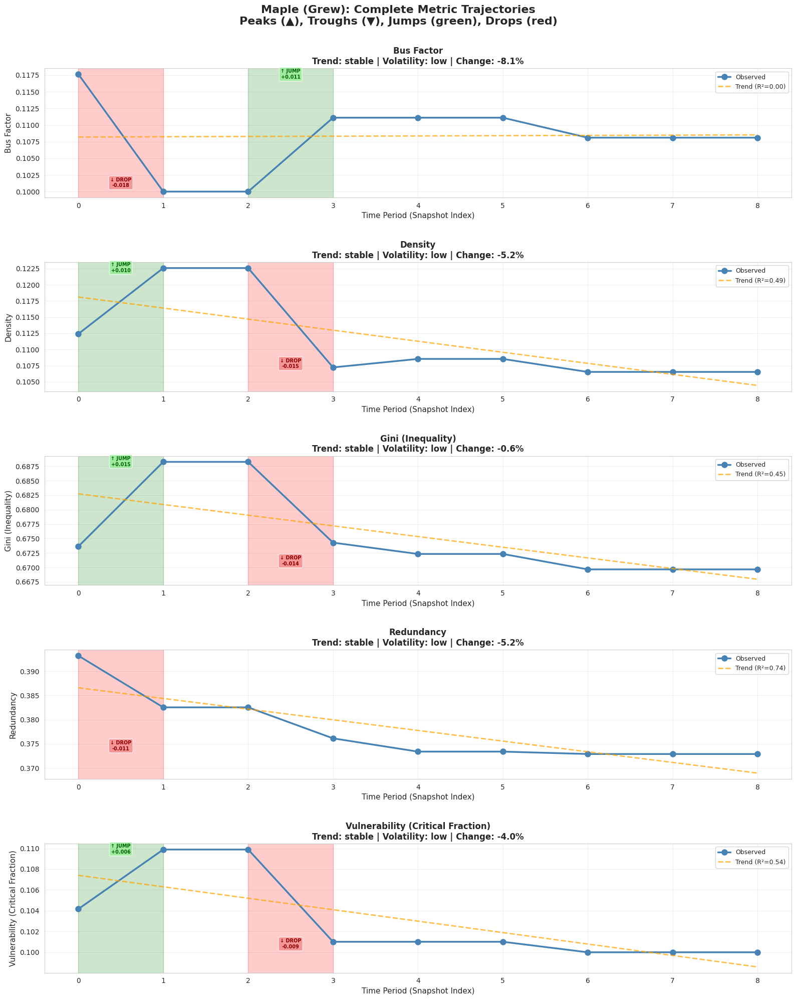


PROJECT: UniLend (Failure)

Bus Factor:
  Trend: stable
  Volatility: low
  Overall Change: -14.3%
  R²: 0.300
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Density:
  Trend: stable
  Volatility: low
  Overall Change: -7.0%
  R²: 0.300
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Gini (Inequality):
  Trend: stable
  Volatility: low
  Overall Change: +2.3%
  R²: 0.300
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 0

Redundancy:
  Trend: stable
  Volatility: low
  Overall Change: -1.3%
  R²: 0.300
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Vulnerability (Critical Fraction):
  Trend: stable
  Volatility: low
  Overall Change: -5.6%
  R²: 0.300
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

💾 Saved: results_cache/trajectories_UniLend.png


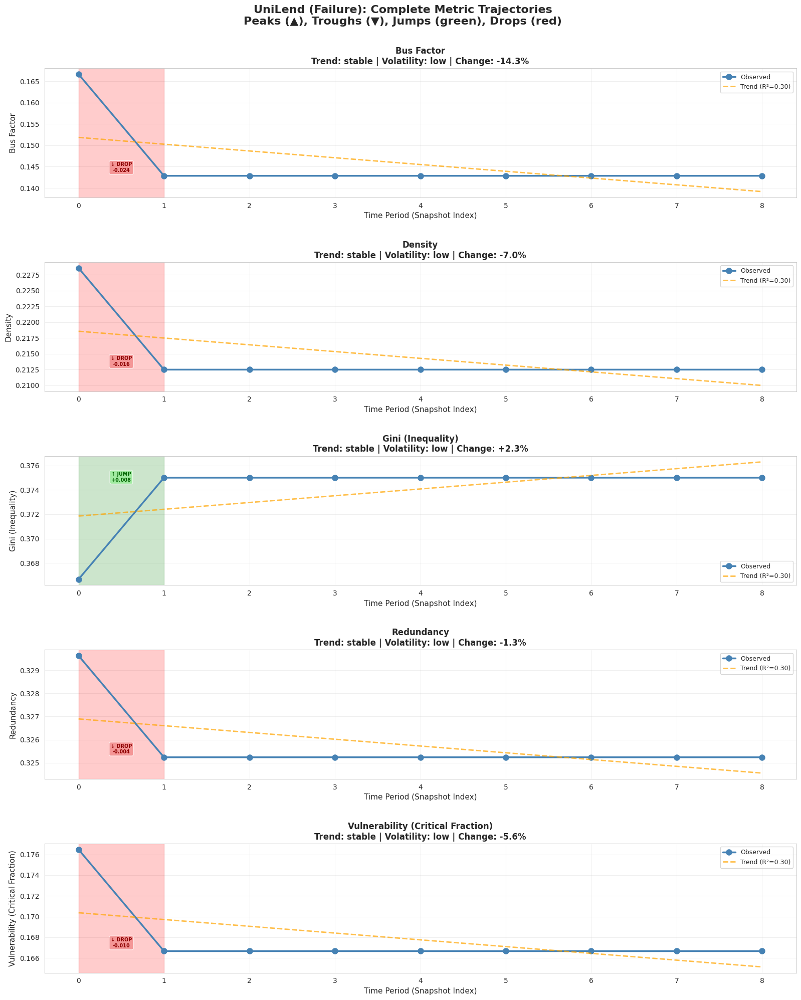


PROJECT: EOS (Stagnated)

Bus Factor:
  Trend: stable
  Volatility: low
  Overall Change: -6.4%
  R²: 0.845
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Density:
  Trend: stable
  Volatility: low
  Overall Change: -4.5%
  R²: 0.924
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Gini (Inequality):
  Trend: stable
  Volatility: low
  Overall Change: +2.2%
  R²: 0.789
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 0

Redundancy:
  Trend: stable
  Volatility: low
  Overall Change: +10.4%
  R²: 0.886
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 0

Vulnerability (Critical Fraction):
  Trend: stable
  Volatility: low
  Overall Change: -0.0%
  R²: 0.138
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 1

💾 Saved: results_cache/trajectories_EOS.png


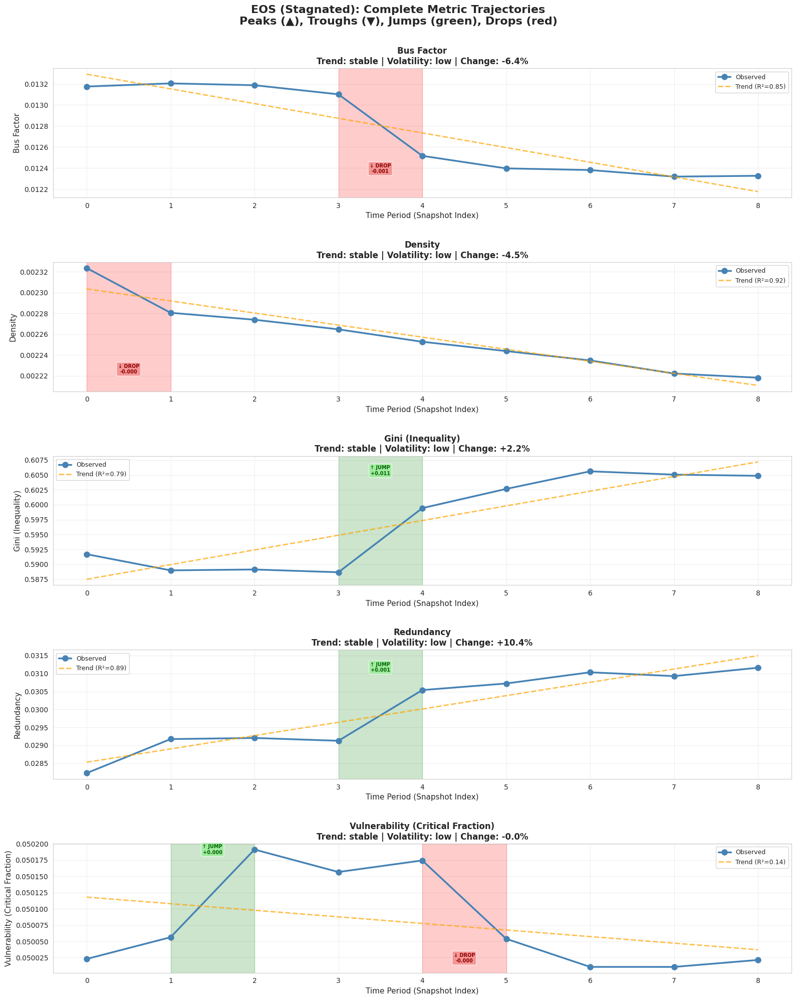


PROJECT: Uniswap (Healthy)

Bus Factor:
  Trend: stable
  Volatility: low
  Overall Change: +22.5%
  R²: 0.816
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 0

Density:
  Trend: stable
  Volatility: high
  Overall Change: -67.3%
  R²: 0.813
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Gini (Inequality):
  Trend: stable
  Volatility: low
  Overall Change: -6.8%
  R²: 0.922
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Redundancy:
  Trend: stable
  Volatility: moderate
  Overall Change: -54.6%
  R²: 0.794
  Peaks: 0
  Troughs: 0
  Sudden Increases: 0
  Sudden Decreases: 1

Vulnerability (Critical Fraction):
  Trend: stable
  Volatility: low
  Overall Change: -0.2%
  R²: 0.067
  Peaks: 0
  Troughs: 0
  Sudden Increases: 1
  Sudden Decreases: 1

💾 Saved: results_cache/trajectories_Uniswap.png


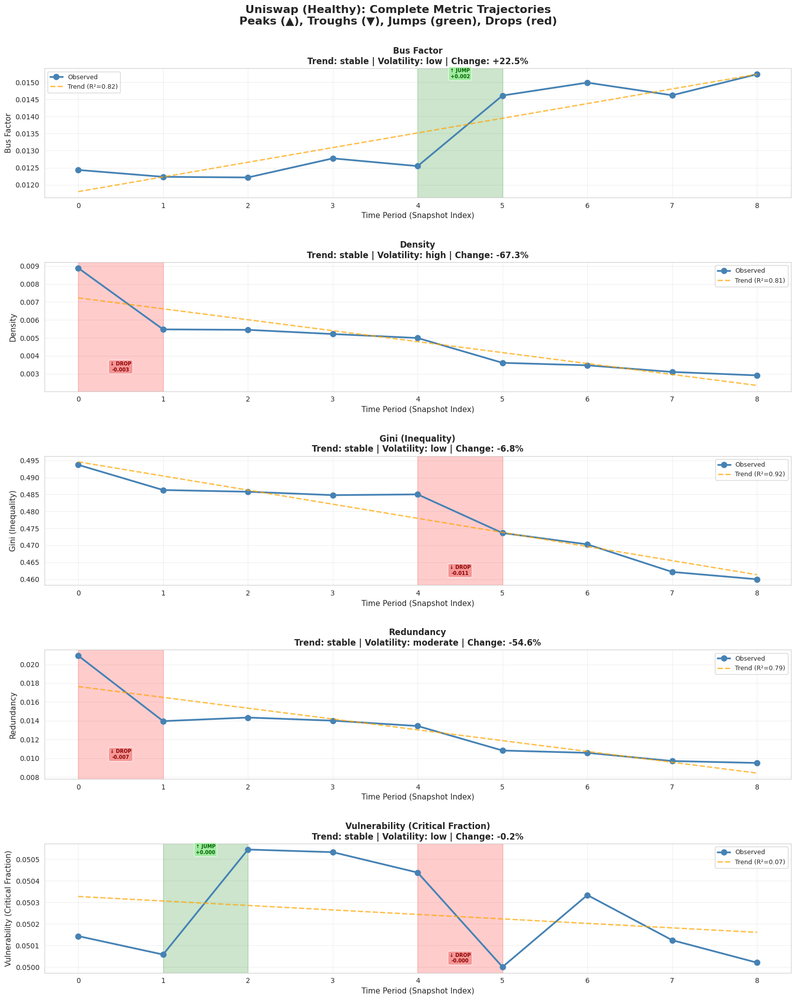


PART 2: INFLECTION POINT ANALYSIS

PROJECT: Maple (Grew)

Bus Factor:
  Sudden Increases (1):
    t=2→3: Δ=+0.011 (moderate)
  Sudden Decreases (1):
    t=0→1: Δ=-0.018 (moderate)

Density:
  Sudden Increases (1):
    t=0→1: Δ=+0.010 (moderate)
  Sudden Decreases (1):
    t=2→3: Δ=-0.015 (moderate)

Gini (Inequality):
  Sudden Increases (1):
    t=0→1: Δ=+0.015 (moderate)
  Sudden Decreases (1):
    t=2→3: Δ=-0.014 (moderate)

Redundancy:
  Sudden Decreases (1):
    t=0→1: Δ=-0.011 (moderate)

Vulnerability (Critical Fraction):
  Sudden Increases (1):
    t=0→1: Δ=+0.006 (moderate)
  Sudden Decreases (1):
    t=2→3: Δ=-0.009 (moderate)

PROJECT: UniLend (Failure)

Bus Factor:
  Sudden Decreases (1):
    t=0→1: Δ=-0.024 (moderate)

Density:
  Sudden Decreases (1):
    t=0→1: Δ=-0.016 (moderate)

Gini (Inequality):
  Sudden Increases (1):
    t=0→1: Δ=+0.008 (moderate)

Redundancy:
  Sudden Decreases (1):
    t=0→1: Δ=-0.004 (moderate)

Vulnerability (Critical Fraction):
  Sudden Decrea

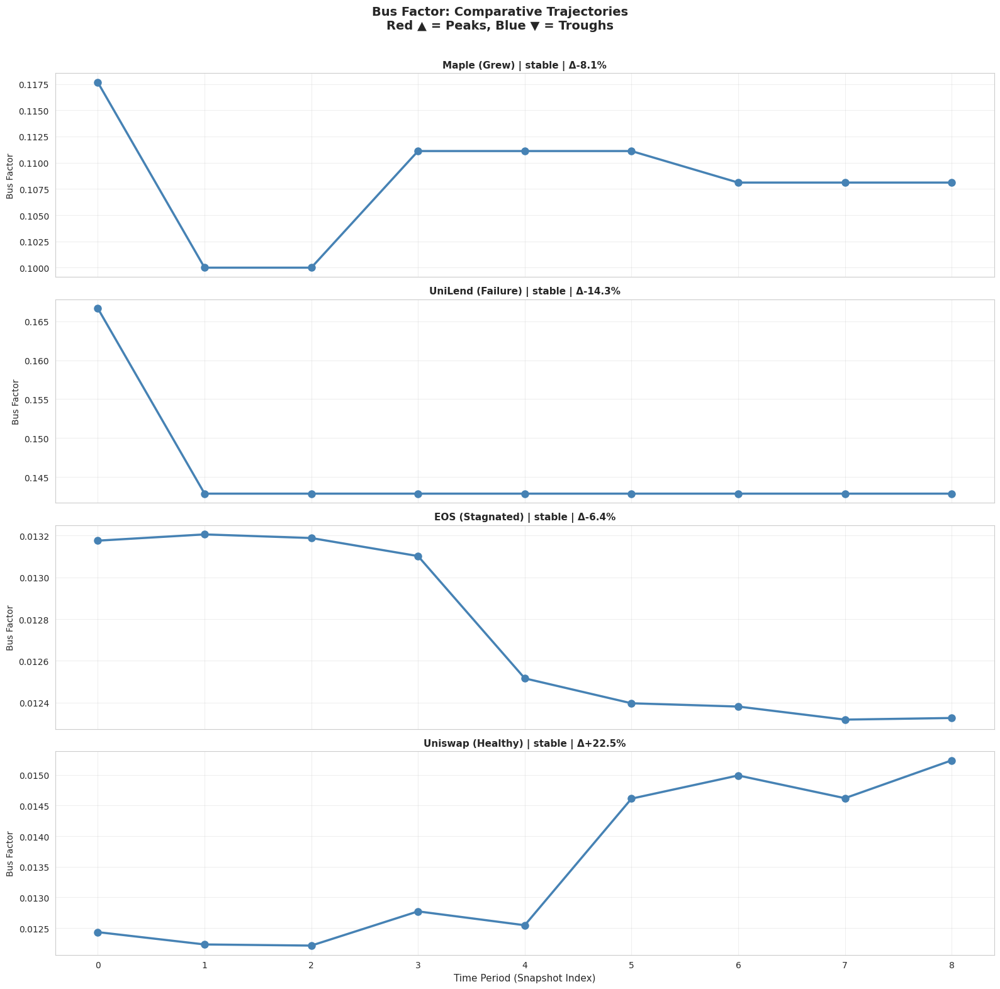


💾 Saved: results_cache/comparative_bipartite_density.png


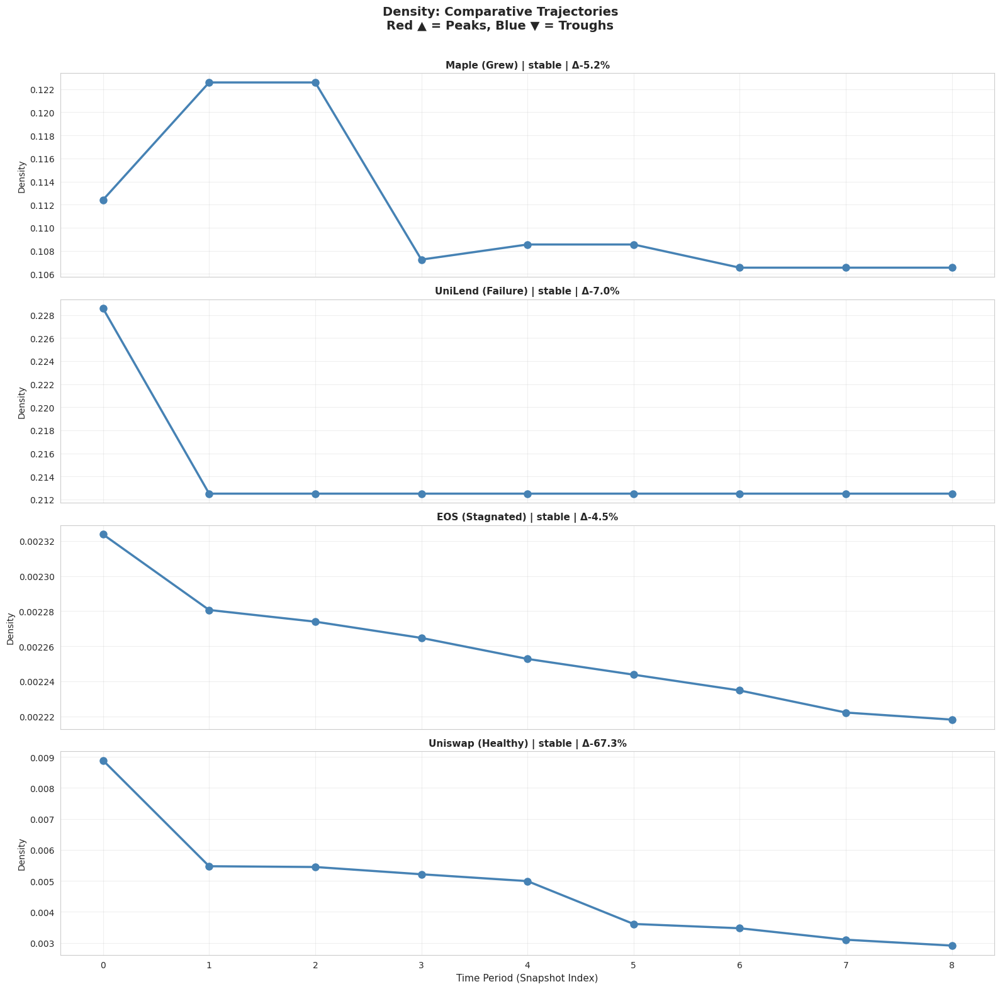


💾 Saved: results_cache/comparative_gini_repo_load.png


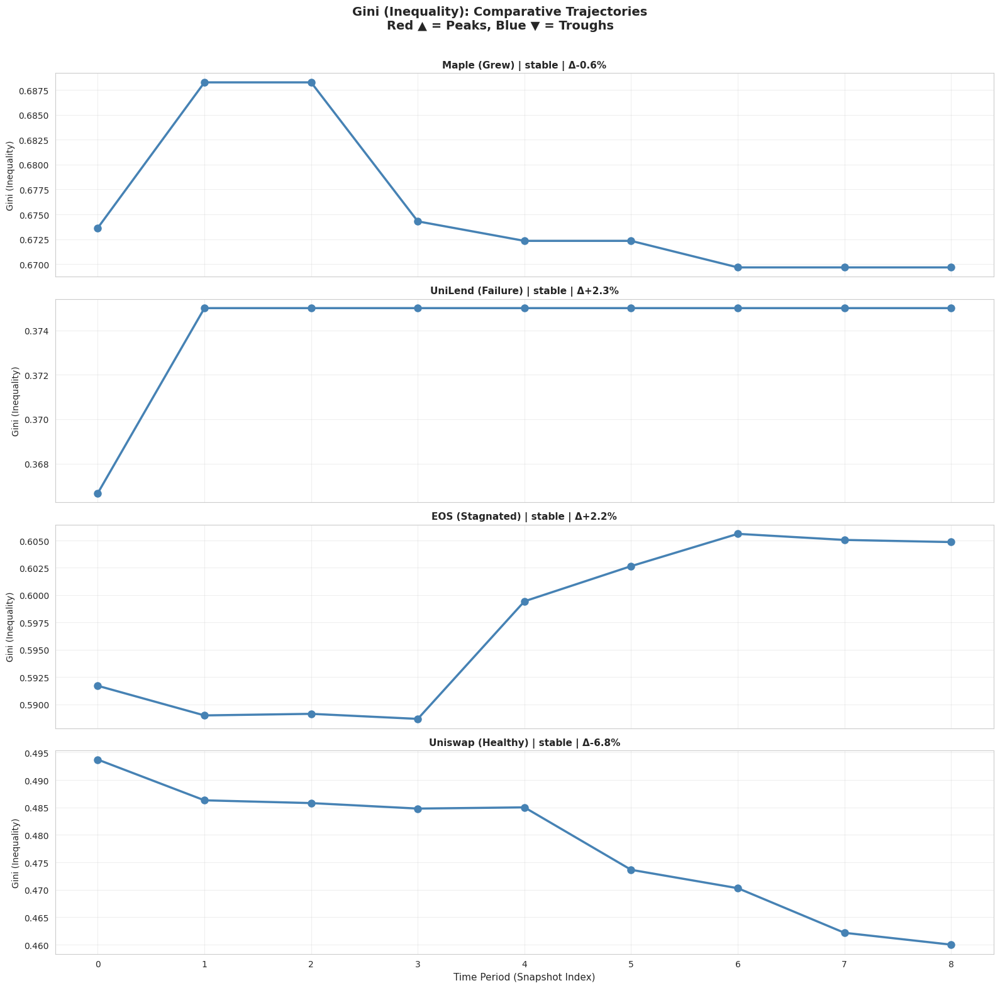


💾 Saved: results_cache/comparative_knowledge_redundancy.png


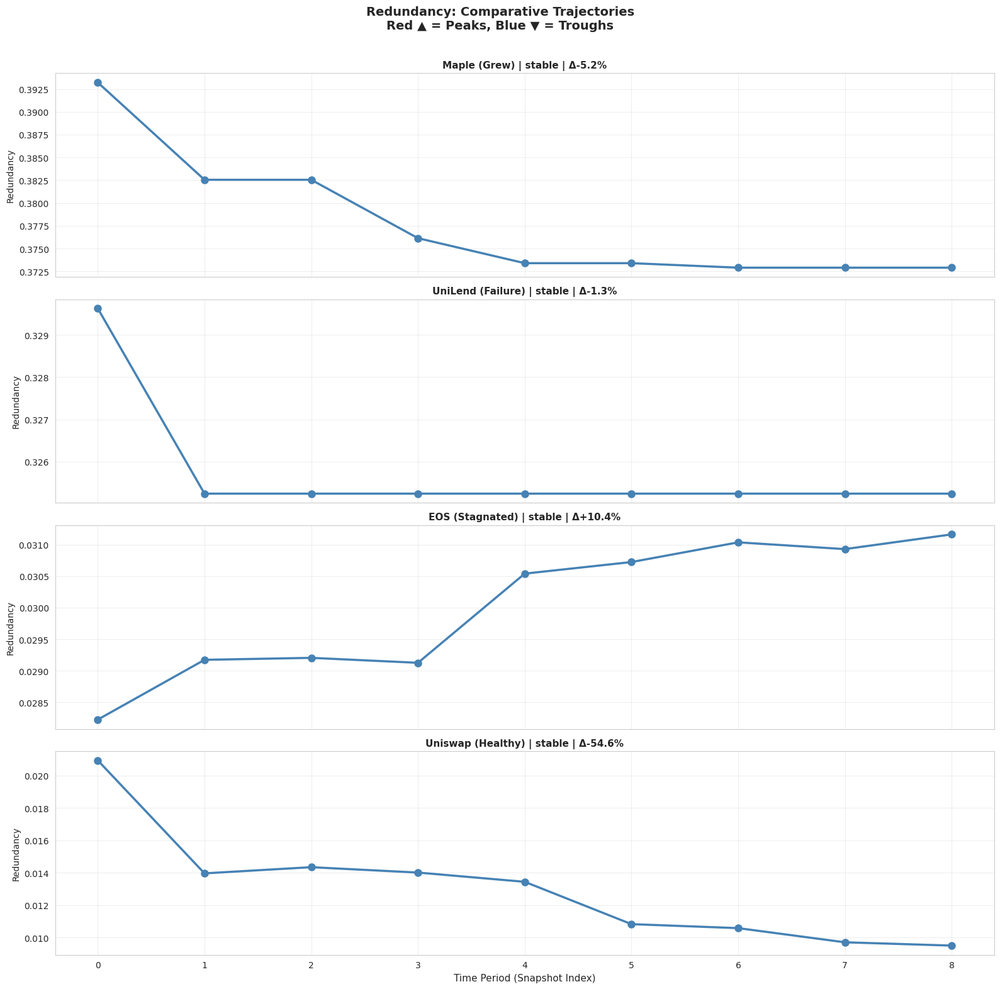


💾 Saved: results_cache/comparative_fc_attack_adaptive.png


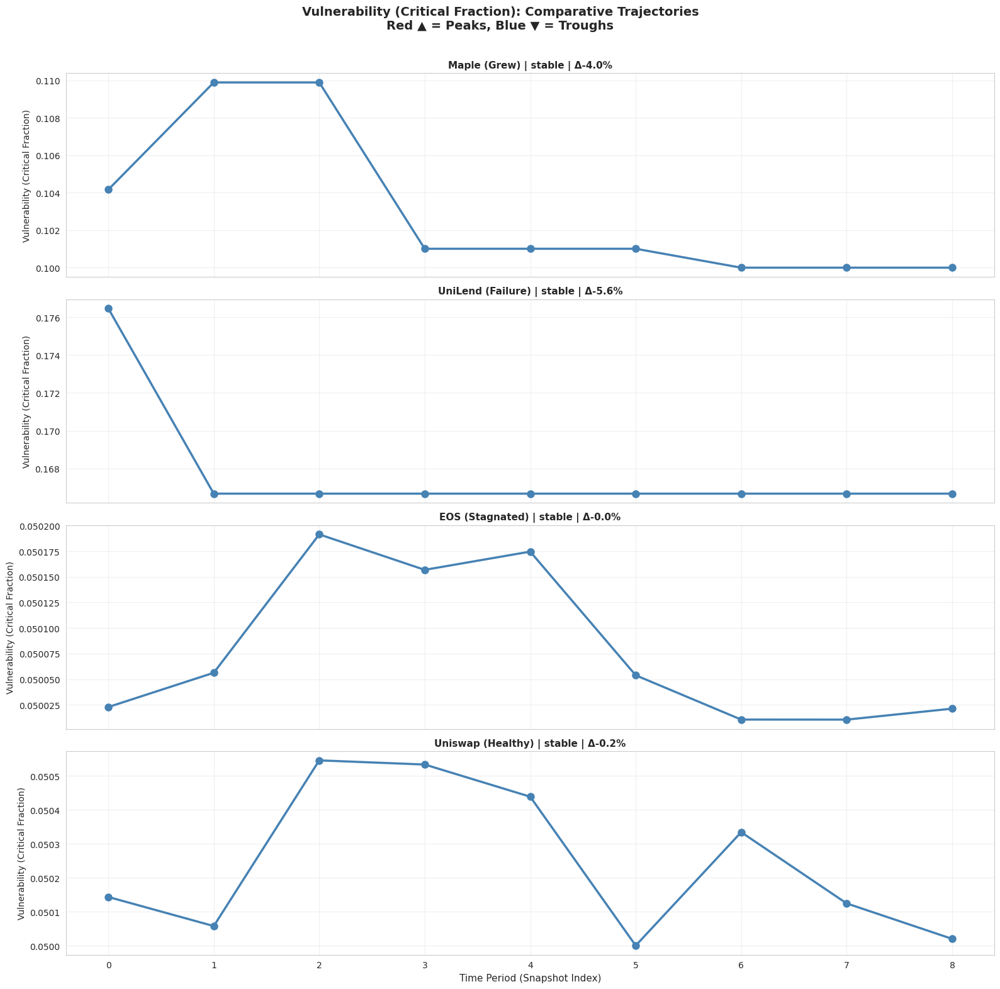


PART 4: SUMMARY STATISTICS

Trajectory Summary:
Project  Category                            Metric  Initial    Final   Change_%  Trend Volatility  Peaks  Troughs  Jumps  Drops
  Maple      Grew                        Bus Factor 0.117647 0.108108  -8.108108 stable        low      0        0      1      1
  Maple      Grew                           Density 0.112412 0.106537  -5.226903 stable        low      0        0      1      1
  Maple      Grew                 Gini (Inequality) 0.673640 0.669670  -0.589312 stable        low      0        0      1      1
  Maple      Grew                        Redundancy 0.393225 0.372899  -5.169022 stable        low      0        0      0      1
  Maple      Grew Vulnerability (Critical Fraction) 0.104167 0.100000  -4.000000 stable        low      0        0      1      1
UniLend   Failure                        Bus Factor 0.166667 0.142857 -14.285714 stable        low      0        0      0      1
UniLend   Failure                           Dens

In [ ]:
# ===============================================================
# DEEP DIVE: 4 PROJECTS - TRAJECTORIES & INFLECTION POINTS
# ===============================================================
# Analyze: Maple Finance, Abracadabra, EOS, Uniswap
# Show all metric trajectories and identify critical inflection points
# ===============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import find_peaks, argrelextrema
import os

sns.set_style("whitegrid")
os.makedirs("results_cache", exist_ok=True)

print("=" * 80)
print("DEEP DIVE: 4 PROJECT ANALYSIS")
print("=" * 80)

# -------------------------------------------------------------------
# CONFIGURATION
# -------------------------------------------------------------------

projects_to_analyze = [
    "Maple",          # Grew
    "UniLend",    # Failure
    "EOS",            # Stagnated
    "Uniswap"         # Healthy
]

metrics = [
    'bus_factor_norm',
    'bipartite_density',
    'gini_repo_load',
    'knowledge_redundancy',
    'fc_attack_adaptive'
]

metric_labels = {
    'bus_factor_norm': 'Bus Factor',
    'bipartite_density': 'Density',
    'gini_repo_load': 'Gini (Inequality)',
    'knowledge_redundancy': 'Redundancy',
    'fc_attack_adaptive': 'Vulnerability (Critical Fraction)'
}

# Category labels
project_categories = {
    "Maple": "Grew",
    "UniLend": "Failure",
    "EOS": "Stagnated",
    "Uniswap": "Healthy"
}

print("\nAnalyzing projects:")
for proj in projects_to_analyze:
    print(f"  - {proj} ({project_categories[proj]})")

# -------------------------------------------------------------------
# LOAD DATA
# -------------------------------------------------------------------

df = graph_df.copy()
df = df[df['project_title'].isin(projects_to_analyze)].copy()
df = df.sort_values(['project_title', 'snap_idx'])

print(f"\n✅ Loaded {len(df)} observations across {df['project_title'].nunique()} projects")

# -------------------------------------------------------------------
# HELPER FUNCTIONS FOR INFLECTION POINT DETECTION
# -------------------------------------------------------------------

def find_inflection_points(series, project_name, metric_name):
    """
    Identify peaks, troughs, and sudden changes in a time series.

    Returns:
        Dictionary with inflection points and their characteristics
    """
    values = series.values
    times = series.index.values

    inflections = {
        'peaks': [],
        'troughs': [],
        'sudden_increases': [],
        'sudden_decreases': []
    }

    if len(values) < 3:
        return inflections

    # Find peaks (local maxima)
    peaks, _ = find_peaks(values, prominence=0.05)
    for p in peaks:
        inflections['peaks'].append({
            'time': times[p],
            'value': values[p],
            'prominence': 'high' if values[p] > np.mean(values) + np.std(values) else 'moderate'
        })

    # Find troughs (local minima) - invert series
    troughs, _ = find_peaks(-values, prominence=0.05)
    for t in troughs:
        inflections['troughs'].append({
            'time': times[t],
            'value': values[t],
            'depth': 'deep' if values[t] < np.mean(values) - np.std(values) else 'moderate'
        })

    # Find sudden changes (large derivatives)
    diffs = np.diff(values)

    # Sudden increases (positive jumps > 1.5 std)
    if len(diffs) > 0:
        threshold_increase = np.mean(diffs) + 1.5 * np.std(diffs)
        sudden_inc = np.where(diffs > threshold_increase)[0]
        for si in sudden_inc:
            inflections['sudden_increases'].append({
                'from_time': times[si],
                'to_time': times[si + 1],
                'change': diffs[si],
                'magnitude': 'large' if diffs[si] > 2 * threshold_increase else 'moderate'
            })

        # Sudden decreases (negative jumps < -1.5 std)
        threshold_decrease = np.mean(diffs) - 1.5 * np.std(diffs)
        sudden_dec = np.where(diffs < threshold_decrease)[0]
        for sd in sudden_dec:
            inflections['sudden_decreases'].append({
                'from_time': times[sd],
                'to_time': times[sd + 1],
                'change': diffs[sd],
                'magnitude': 'large' if diffs[sd] < 2 * threshold_decrease else 'moderate'
            })

    return inflections

def describe_trajectory(series):
    """
    Characterize overall trajectory: increasing, decreasing, stable, volatile.
    """
    values = series.values

    if len(values) < 2:
        return "insufficient data"

    # Overall trend
    from scipy.stats import linregress
    times = np.arange(len(values))
    slope, intercept, r_value, p_value, std_err = linregress(times, values)

    trend = "stable"
    if slope > 0.01 and p_value < 0.1:
        trend = "increasing"
    elif slope < -0.01 and p_value < 0.1:
        trend = "decreasing"

    # Volatility
    volatility = np.std(values) / (np.mean(values) + 1e-10)

    vol_desc = "low"
    if volatility > 0.3:
        vol_desc = "high"
    elif volatility > 0.15:
        vol_desc = "moderate"

    # Overall change
    pct_change = ((values[-1] - values[0]) / (values[0] + 1e-10)) * 100

    return {
        'trend': trend,
        'volatility': vol_desc,
        'pct_change': pct_change,
        'r_squared': r_value**2
    }

# -------------------------------------------------------------------
# PART 1: METRIC TRAJECTORIES
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("PART 1: METRIC TRAJECTORIES")
print("=" * 80)

for project in projects_to_analyze:
    category = project_categories[project]
    proj_df = df[df['project_title'] == project].copy()

    if proj_df.empty:
        print(f"\n⚠️ No data for {project}, skipping")
        continue

    print(f"\n{'='*80}")
    print(f"PROJECT: {project} ({category})")
    print(f"{'='*80}")

    # Create figure with 5 subplots (one per metric) - increased height and spacing
    fig, axes = plt.subplots(5, 1, figsize=(16, 20))
    fig.subplots_adjust(hspace=0.4)  # Add more vertical space between subplots

    for idx, metric in enumerate(metrics):
        ax = axes[idx]

        # Get time series
        times = proj_df['snap_idx'].values
        values = proj_df[metric].values

        # Plot main trajectory
        ax.plot(times, values, marker='o', linewidth=2.5, markersize=8,
                color='steelblue', label='Observed')

        # Identify inflection points
        series = pd.Series(values, index=times)
        inflections = find_inflection_points(series, project, metric)

        # Get y-axis range for better annotation placement
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        # Mark peaks - stagger annotations to avoid overlap
        for peak_idx, peak in enumerate(inflections['peaks']):
            ax.scatter(peak['time'], peak['value'], color='red', s=200,
                      marker='^', zorder=5, edgecolors='black', linewidths=2)
            # Alternate annotation positions
            offset_y = 15 if peak_idx % 2 == 0 else 25
            ax.annotate('PEAK', xy=(peak['time'], peak['value']),
                       xytext=(15, offset_y), textcoords='offset points',
                       fontsize=8, fontweight='bold', color='red',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7),
                       arrowprops=dict(arrowstyle='->', color='red', lw=1.5))

        # Mark troughs - stagger annotations to avoid overlap
        for trough_idx, trough in enumerate(inflections['troughs']):
            ax.scatter(trough['time'], trough['value'], color='blue', s=200,
                      marker='v', zorder=5, edgecolors='black', linewidths=2)
            # Alternate annotation positions
            offset_y = -25 if trough_idx % 2 == 0 else -35
            ax.annotate('TROUGH', xy=(trough['time'], trough['value']),
                       xytext=(15, offset_y), textcoords='offset points',
                       fontsize=8, fontweight='bold', color='blue',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='lightblue', alpha=0.7),
                       arrowprops=dict(arrowstyle='->', color='blue', lw=1.5))

        # Highlight sudden increases - place text at top of plot area
        for inc_idx, inc in enumerate(inflections['sudden_increases']):
            ax.axvspan(inc['from_time'], inc['to_time'], alpha=0.2, color='green')
            # Stagger text positions to avoid overlap
            text_y_pos = 0.92 - (inc_idx * 0.08)
            ax.text((inc['from_time'] + inc['to_time']) / 2,
                   y_min + (y_range * text_y_pos),
                   f'↑ JUMP\n+{inc["change"]:.3f}',
                   ha='center', fontsize=7, fontweight='bold', color='darkgreen',
                   bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

        # Highlight sudden decreases - place text at bottom of plot area
        for dec_idx, dec in enumerate(inflections['sudden_decreases']):
            ax.axvspan(dec['from_time'], dec['to_time'], alpha=0.2, color='red')
            # Stagger text positions to avoid overlap
            text_y_pos = 0.08 + (dec_idx * 0.08)
            ax.text((dec['from_time'] + dec['to_time']) / 2,
                   y_min + (y_range * text_y_pos),
                   f'↓ DROP\n{dec["change"]:.3f}',
                   ha='center', fontsize=7, fontweight='bold', color='darkred',
                   bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.7))

        # Add trend line
        from scipy.stats import linregress
        if len(times) > 1:
            slope, intercept, r_value, p_value, std_err = linregress(times, values)
            trend_line = slope * times + intercept
            ax.plot(times, trend_line, '--', color='orange', linewidth=2,
                   alpha=0.7, label=f'Trend (R²={r_value**2:.2f})')

        # Trajectory description
        traj_desc = describe_trajectory(series)

        # Formatting
        ax.set_xlabel('Time Period (Snapshot Index)', fontsize=11)
        ax.set_ylabel(metric_labels[metric], fontsize=11)
        ax.set_title(f'{metric_labels[metric]}\n'
                    f'Trend: {traj_desc["trend"]} | Volatility: {traj_desc["volatility"]} | '
                    f'Change: {traj_desc["pct_change"]:+.1f}%',
                    fontsize=12, fontweight='bold')
        ax.grid(alpha=0.3)
        ax.legend(loc='best', fontsize=9)

        # Print summary to console
        print(f"\n{metric_labels[metric]}:")
        print(f"  Trend: {traj_desc['trend']}")
        print(f"  Volatility: {traj_desc['volatility']}")
        print(f"  Overall Change: {traj_desc['pct_change']:+.1f}%")
        print(f"  R²: {traj_desc['r_squared']:.3f}")
        print(f"  Peaks: {len(inflections['peaks'])}")
        print(f"  Troughs: {len(inflections['troughs'])}")
        print(f"  Sudden Increases: {len(inflections['sudden_increases'])}")
        print(f"  Sudden Decreases: {len(inflections['sudden_decreases'])}")

    plt.suptitle(f'{project} ({category}): Complete Metric Trajectories\n'
                f'Peaks (▲), Troughs (▼), Jumps (green), Drops (red)',
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99], h_pad=3.0)

    filename = f"results_cache/trajectories_{project.replace(' ', '_')}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: {filename}")
    plt.show()

# -------------------------------------------------------------------
# PART 2: INFLECTION POINT SUMMARY TABLES
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("PART 2: INFLECTION POINT ANALYSIS")
print("=" * 80)

all_inflections = []

for project in projects_to_analyze:
    category = project_categories[project]
    proj_df = df[df['project_title'] == project].copy()

    if proj_df.empty:
        continue

    print(f"\n{'='*80}")
    print(f"PROJECT: {project} ({category})")
    print(f"{'='*80}")

    for metric in metrics:
        times = proj_df['snap_idx'].values
        values = proj_df[metric].values
        series = pd.Series(values, index=times)

        inflections = find_inflection_points(series, project, metric)

        # Record all inflection points
        for peak in inflections['peaks']:
            all_inflections.append({
                'project': project,
                'category': category,
                'metric': metric_labels[metric],
                'type': 'Peak',
                'time': peak['time'],
                'value': peak['value'],
                'characteristic': peak['prominence']
            })

        for trough in inflections['troughs']:
            all_inflections.append({
                'project': project,
                'category': category,
                'metric': metric_labels[metric],
                'type': 'Trough',
                'time': trough['time'],
                'value': trough['value'],
                'characteristic': trough['depth']
            })

        for inc in inflections['sudden_increases']:
            all_inflections.append({
                'project': project,
                'category': category,
                'metric': metric_labels[metric],
                'type': 'Sudden Increase',
                'time': inc['from_time'],
                'value': inc['change'],
                'characteristic': inc['magnitude']
            })

        for dec in inflections['sudden_decreases']:
            all_inflections.append({
                'project': project,
                'category': category,
                'metric': metric_labels[metric],
                'type': 'Sudden Decrease',
                'time': dec['from_time'],
                'value': dec['change'],
                'characteristic': dec['magnitude']
            })

        # Print metric-specific summary
        if any([inflections['peaks'], inflections['troughs'],
                inflections['sudden_increases'], inflections['sudden_decreases']]):
            print(f"\n{metric_labels[metric]}:")

            if inflections['peaks']:
                print(f"  Peaks ({len(inflections['peaks'])}):")
                for p in inflections['peaks']:
                    print(f"    t={p['time']}: value={p['value']:.3f} ({p['prominence']})")

            if inflections['troughs']:
                print(f"  Troughs ({len(inflections['troughs'])}):")
                for t in inflections['troughs']:
                    print(f"    t={t['time']}: value={t['value']:.3f} ({t['depth']})")

            if inflections['sudden_increases']:
                print(f"  Sudden Increases ({len(inflections['sudden_increases'])}):")
                for si in inflections['sudden_increases']:
                    print(f"    t={si['from_time']}→{si['to_time']}: Δ={si['change']:+.3f} ({si['magnitude']})")

            if inflections['sudden_decreases']:
                print(f"  Sudden Decreases ({len(inflections['sudden_decreases'])}):")
                for sd in inflections['sudden_decreases']:
                    print(f"    t={sd['from_time']}→{sd['to_time']}: Δ={sd['change']:+.3f} ({sd['magnitude']})")

# Save inflection points to CSV
inflection_df = pd.DataFrame(all_inflections)
inflection_df = inflection_df.sort_values(['project', 'metric', 'time'])
inflection_df.to_csv('results_cache/inflection_points_summary.csv', index=False)
print("\n💾 Saved: results_cache/inflection_points_summary.csv")

# -------------------------------------------------------------------
# PART 3: COMPARATIVE TIMELINE
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("PART 3: COMPARATIVE TIMELINE")
print("=" * 80)

# Create a timeline showing all projects side-by-side for each metric
for metric in metrics:
    fig, axes = plt.subplots(4, 1, figsize=(16, 16), sharex=True)
    fig.subplots_adjust(hspace=0.35)  # Add more vertical space

    for idx, project in enumerate(projects_to_analyze):
        ax = axes[idx]
        category = project_categories[project]

        proj_df = df[df['project_title'] == project].copy()

        if proj_df.empty:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{project} ({category})')
            continue

        times = proj_df['snap_idx'].values
        values = proj_df[metric].values

        # Plot
        ax.plot(times, values, marker='o', linewidth=2.5, markersize=8, color='steelblue')

        # Mark inflections
        series = pd.Series(values, index=times)
        inflections = find_inflection_points(series, project, metric)

        for peak in inflections['peaks']:
            ax.scatter(peak['time'], peak['value'], color='red', s=150, marker='^', zorder=5)

        for trough in inflections['troughs']:
            ax.scatter(trough['time'], trough['value'], color='blue', s=150, marker='v', zorder=5)

        # Title and formatting
        traj_desc = describe_trajectory(series)
        ax.set_title(f'{project} ({category}) | {traj_desc["trend"]} | Δ{traj_desc["pct_change"]:+.1f}%',
                    fontsize=11, fontweight='bold')
        ax.set_ylabel(metric_labels[metric], fontsize=10)
        ax.grid(alpha=0.3)

    axes[-1].set_xlabel('Time Period (Snapshot Index)', fontsize=11)

    plt.suptitle(f'{metric_labels[metric]}: Comparative Trajectories\n'
                f'Red ▲ = Peaks, Blue ▼ = Troughs',
                fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])

    filename = f"results_cache/comparative_{metric}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: {filename}")
    plt.show()

# -------------------------------------------------------------------
# PART 4: SUMMARY STATISTICS TABLE
# -------------------------------------------------------------------

print("\n" + "=" * 80)
print("PART 4: SUMMARY STATISTICS")
print("=" * 80)

summary_data = []

for project in projects_to_analyze:
    category = project_categories[project]
    proj_df = df[df['project_title'] == project].copy()

    if proj_df.empty:
        continue

    for metric in metrics:
        values = proj_df[metric].values
        series = pd.Series(values, index=proj_df['snap_idx'].values)

        traj_desc = describe_trajectory(series)
        inflections = find_inflection_points(series, project, metric)

        summary_data.append({
            'Project': project,
            'Category': category,
            'Metric': metric_labels[metric],
            'Initial': values[0],
            'Final': values[-1],
            'Change_%': traj_desc['pct_change'],
            'Trend': traj_desc['trend'],
            'Volatility': traj_desc['volatility'],
            'Peaks': len(inflections['peaks']),
            'Troughs': len(inflections['troughs']),
            'Jumps': len(inflections['sudden_increases']),
            'Drops': len(inflections['sudden_decreases'])
        })

summary_df = pd.DataFrame(summary_data)
summary_df.to_csv('results_cache/trajectory_summary.csv', index=False)

print("\nTrajectory Summary:")
print("="*80)
print(summary_df.to_string(index=False))
print("\n💾 Saved: results_cache/trajectory_summary.csv")

print("\n✅ DEEP DIVE ANALYSIS COMPLETE")
print("=" * 80)
print("\nGenerated files:")
print("  - trajectories_{project}.png (4 files)")
print("  - comparative_{metric}.png (5 files)")
print("  - inflection_points_summary.csv")
print("  - trajectory_summary.csv")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.3 MB/s eta 0:00:00
ROLLING VAR + TRAJECTORY + BREAKPOINT ANALYSIS

Using core metrics:
  - bus_factor_norm
  - gini_repo_load
  - bipartite_density
  - knowledge_redundancy
  - fc_attack_adaptive

Creating lagged variables...
✅ Data prepared with lags: 320 observations

STEP 1: ROLLING PANEL VAR (SYSTEM MATRICES OVER TIME)

Snapshots available: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8)]
Using rolling window size = 3 snapshots.

--- Category: Failures ---
  Snapshots in this category: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8)]
  Estimating window [1-3] (center=2)...
  Estimating window [2-4] (center=3)...
  Estimating window [3-5] (center=4)...
  Estimating window [4-6] (center=5)...
  Estimating window [5-7] (center=6)...
  Estimating window [6-8] (center=7)...

--- Category: Grew ---
  Snapshots in this ca

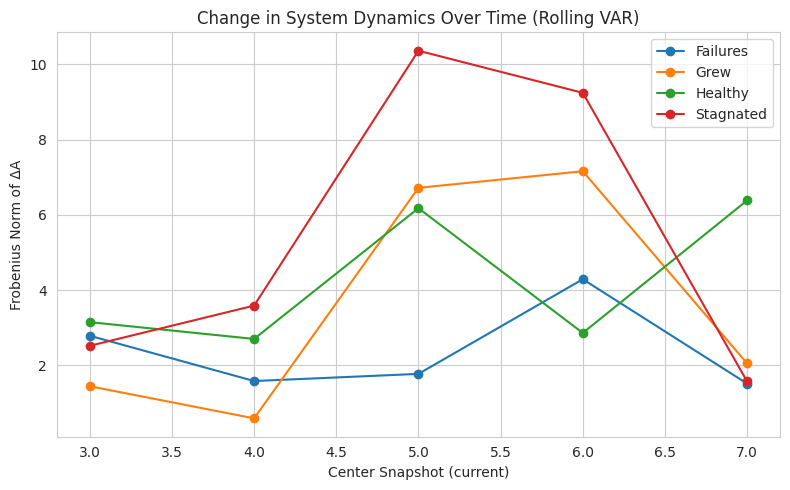


STEP 2: METRIC TRAJECTORIES OVER TIME
💾 Saved category-level trajectories to: results_cache/category_metric_trajectories.csv
   Category  Snapshot  bus_factor_norm  gini_repo_load  bipartite_density  \
0  Failures         0         0.106604        0.395752           0.131766   
1  Failures         1         0.112159        0.404726           0.125731   
2  Failures         2         0.112159        0.404726           0.125731   
3  Failures         3         0.107692        0.407486           0.128128   
4  Failures         4         0.107692        0.407486           0.127267   

   knowledge_redundancy  fc_attack_adaptive  
0              0.159151            0.117749  
1              0.152228            0.117210  
2              0.152228            0.117210  
3              0.158384            0.119104  
4              0.151785            0.119104  
💾 Saved category trajectory plots to: results_cache/category_metric_trajectories_plots.png


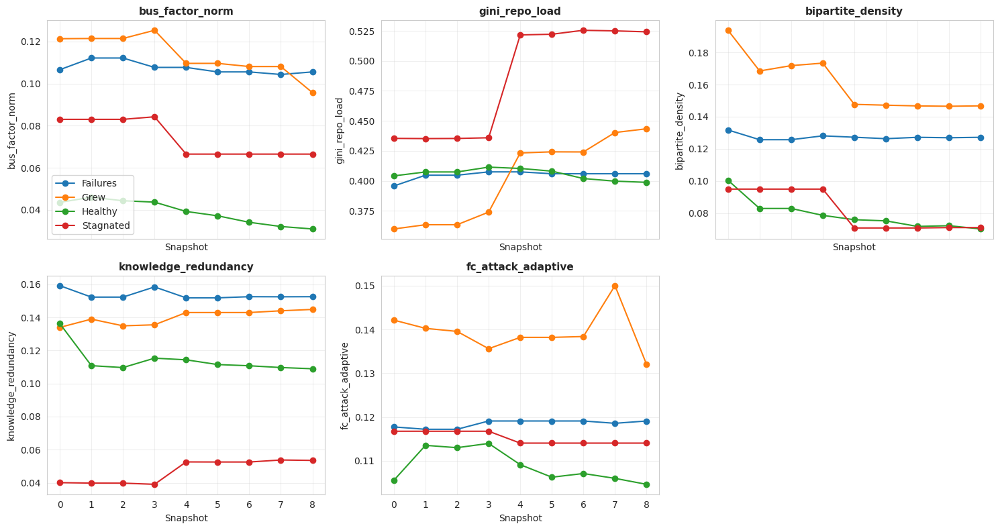

💾 Saved project-level trajectories to: results_cache/project_metric_trajectories.csv
  Project  Snapshot  bus_factor_norm  gini_repo_load  bipartite_density  \
0   1inch         0         0.024390        0.596076           0.038431   
1   1inch         1         0.023810        0.594486           0.037642   
2   1inch         2         0.024194        0.596433           0.038146   
3   1inch         3         0.024000        0.602005           0.037793   
4   1inch         4         0.023256        0.605808           0.036782   

   knowledge_redundancy  fc_attack_adaptive  
0              0.132392            0.107317  
1              0.132364            0.105263  
2              0.133272            0.106280  
3              0.125036            0.104762  
4              0.126740            0.101382  

STEP 3: BREAKPOINT DETECTION IN CATEGORY TRAJECTORIES
ruptures library found. Running breakpoint analysis...
  Breakpoint: Failures - bus_factor_norm at snapshot 5
  Breakpoint: Failures 

In [ ]:
# ===============================================================
# ROLLING VAR + METRIC TRAJECTORIES + BREAKPOINT ANALYSIS
# ===============================================================
!pip install ruptures
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

sns.set_style("whitegrid")
import os
os.makedirs("results_cache", exist_ok=True)

print("=" * 80)
print("ROLLING VAR + TRAJECTORY + BREAKPOINT ANALYSIS")
print("=" * 80)

# -------------------------------------------------------------------
# STEP 0: CORE METRICS & BASIC PREP
# -------------------------------------------------------------------

core_metrics = [
    'bus_factor_norm',
    'gini_repo_load',
    'bipartite_density',
    'knowledge_redundancy',
    'fc_attack_adaptive'
]

categories = ["Failures", "Grew", "Healthy", "Stagnated"]

print("\nUsing core metrics:")
for m in core_metrics:
    print("  -", m)

# Copy and sort
df = graph_df.copy()
df = df.sort_values(['project_title', 'snap_idx'])

# Create lagged variables for all metrics
print("\nCreating lagged variables...")
for metric in core_metrics:
    df[f"{metric}_lag1"] = df.groupby("project_title")[metric].shift(1)

# Drop first observation for each project (no lag)
df_model = df[df["snap_idx"] > 0].copy()

print(f"✅ Data prepared with lags: {len(df_model)} observations")

# -------------------------------------------------------------------
# STEP 1: ROLLING PANEL VAR (WITHIN-FE) PER CATEGORY
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("STEP 1: ROLLING PANEL VAR (SYSTEM MATRICES OVER TIME)")
print("=" * 80)

def estimate_panel_var_fe_window(df_cat, metrics, window_start, window_end, min_obs=18):
    """
    Within-transformed VAR-like system for one category & time window.
    outcome_t (within) ~ lagged metrics (within).
    Returns:
        A_coef: DataFrame [outcome x predictor] of coefficients, or None.
    """
    sub = df_cat[(df_cat['snap_idx'] >= window_start) &
                 (df_cat['snap_idx'] <= window_end)].copy()

    lag_cols = [f"{m}_lag1" for m in metrics]
    use_cols = ['project_title'] + metrics + lag_cols
    sub = sub[use_cols].dropna()

    if len(sub) < min_obs:
        return None

    # Within transform by project for current and lagged metrics
    for col in metrics + lag_cols:
        df_cat[col + "_w_cat"] = df_cat[col] - df_cat.groupby("project_title")[col].transform("mean")
        sub[col + "_w"] = df_cat.loc[sub.index, col + "_w_cat"]


    rows = []
    for outcome in metrics:
        y = sub[outcome + "_w"]
        X_lag = sub[[f"{m}_lag1_w" for m in metrics]]  # all metrics lagged
        X = sm.add_constant(X_lag)
        model = sm.OLS(y, X).fit()

        coef_row = {"outcome": outcome}
        for pred in metrics:
            coef_row[pred] = model.params.get(f"{pred}_lag1_w", np.nan)
        rows.append(coef_row)

    A_coef = pd.DataFrame(rows).set_index("outcome")
    return A_coef

rolling_var_records = []  # long format record of coefficients

window_size = 3  # snapshots per rolling window
min_obs = 18    # minimum obs per window-category to estimate

all_snap_idx = sorted(df_model['snap_idx'].unique())
min_snap, max_snap = min(all_snap_idx), max(all_snap_idx)

print(f"\nSnapshots available: {all_snap_idx}")
print(f"Using rolling window size = {window_size} snapshots.")

for cat in categories:
    print(f"\n--- Category: {cat} ---")
    df_cat = df_model[df_model['status'] == cat].copy()

    if df_cat.empty:
        print("  ⚠️ No observations, skipping.")
        continue

    cat_snap_idx = sorted(df_cat['snap_idx'].unique())
    print(f"  Snapshots in this category: {cat_snap_idx}")

    # For 8 snapshots and window_size=3 → centers at 2..7
    for center in range(min_snap + 1, max_snap):  # e.g., 2..7
        half = window_size // 2
        window_start = center - half
        window_end = center + half

        if window_start < min_snap or window_end > max_snap:
            continue

        print(f"  Estimating window [{window_start}-{window_end}] (center={center})...")

        A_coef = estimate_panel_var_fe_window(
            df_cat, core_metrics, window_start, window_end, min_obs=min_obs
        )

        if A_coef is None:
            print("    ⚠️ Insufficient data, skipping window.")
            continue

        # Store in long format for later analysis
        for out in A_coef.index:
            for pred in A_coef.columns:
                rolling_var_records.append({
                    "category": cat,
                    "window_start": window_start,
                    "window_end": window_end,
                    "center_snap": center,
                    "outcome": out,
                    "predictor": pred,
                    "coef": A_coef.loc[out, pred]
                })

# Convert to DataFrame
rolling_var_df = pd.DataFrame(rolling_var_records)
if rolling_var_df.empty:
    print("\n⚠️ No rolling VAR estimates produced. Check data / thresholds.")
else:
    rolling_var_df.to_csv("results_cache/rolling_panel_var_coefficients.csv", index=False)
    print("\n💾 Saved rolling VAR coefficients to: results_cache/rolling_panel_var_coefficients.csv")
    print(rolling_var_df.head())

# -------------------------------------------------------------------
# STEP 1B: VAR MATRIX DIFFERENCES OVER TIME (WITHIN CATEGORY)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("STEP 1B: VAR MATRIX DIFFERENCE ANALYSIS OVER TIME")
print("=" * 80)

diff_records = []

if not rolling_var_df.empty:
    for cat in categories:
        cat_df = rolling_var_df[rolling_var_df["category"] == cat].copy()
        if cat_df.empty:
            continue

        # Sort by center_snap
        centers = sorted(cat_df["center_snap"].unique())
        print(f"\nCategory {cat}: centers = {centers}")

        # Build dictionary center_snap -> coefficient matrix
        matrices = {}
        for c in centers:
            sub = cat_df[cat_df["center_snap"] == c]
            A = sub.pivot(index="outcome", columns="predictor", values="coef").reindex(
                index=core_metrics, columns=core_metrics
            )
            matrices[c] = A

        # Compute differences A_t - A_{t-1} and Frobenius norm
        for i in range(1, len(centers)):
            c_prev = centers[i - 1]
            c_curr = centers[i]
            A_prev = matrices[c_prev]
            A_curr = matrices[c_curr]
            A_diff = A_curr - A_prev

            # Frobenius norm of difference
            frob = np.linalg.norm(A_diff.values)

            diff_records.append({
                "category": cat,
                "center_snap_prev": c_prev,
                "center_snap_curr": c_curr,
                "frob_norm_diff": frob
            })

            # Also record elementwise differences in long form
            for out in core_metrics:
                for pred in core_metrics:
                    diff_records.append({
                        "category": cat,
                        "center_snap_prev": c_prev,
                        "center_snap_curr": c_curr,
                        "outcome": out,
                        "predictor": pred,
                        "coef_diff": A_diff.loc[out, pred]
                    })

diff_df = pd.DataFrame(diff_records)

if not diff_df.empty:
    # Separate out the Frobenius norms from element-wise records
    frob_df = diff_df.dropna(subset=["frob_norm_diff"]).copy()
    elem_df = diff_df.dropna(subset=["coef_diff"]).copy()

    frob_df.to_csv("results_cache/rolling_var_matrix_frobenius_diffs.csv", index=False)
    elem_df.to_csv("results_cache/rolling_var_elementwise_diffs.csv", index=False)

    print("\n💾 Saved VAR matrix Frobenius diffs to: results_cache/rolling_var_matrix_frobenius_diffs.csv")
    print("💾 Saved element-wise VAR coefficient diffs to: results_cache/rolling_var_elementwise_diffs.csv")

    # Quick plot: Frobenius norm over time (per category)
    plt.figure(figsize=(8, 5))
    for cat in categories:
        sub = frob_df[frob_df["category"] == cat]
        if sub.empty:
            continue
        plt.plot(
            sub["center_snap_curr"],
            sub["frob_norm_diff"],
            marker="o",
            label=cat
        )
    plt.xlabel("Center Snapshot (current)")
    plt.ylabel("Frobenius Norm of ΔA")
    plt.title("Change in System Dynamics Over Time (Rolling VAR)")
    plt.legend()
    plt.tight_layout()
    plt.savefig("results_cache/rolling_var_frobenius_over_time.png", dpi=200, bbox_inches="tight")
    print("💾 Saved: results_cache/rolling_var_frobenius_over_time.png")
    plt.show()
else:
    print("⚠️ No VAR differences computed (no rolling VAR results).")

# -------------------------------------------------------------------
# STEP 2: METRIC TRAJECTORIES OVER TIME (CATEGORY + PROJECT)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("STEP 2: METRIC TRAJECTORIES OVER TIME")
print("=" * 80)

# 2A. Category-level trajectories
cat_traj = (
    df.groupby(["status", "snap_idx"])[core_metrics]
      .median()
      .reset_index()
      .rename(columns={"status": "Category", "snap_idx": "Snapshot"})
)

cat_traj.to_csv("results_cache/category_metric_trajectories.csv", index=False)
print("💾 Saved category-level trajectories to: results_cache/category_metric_trajectories.csv")
print(cat_traj.head())

# Simple visualization: one subplot per metric, lines for categories
n_metrics = len(core_metrics)
n_cols = 3
n_rows = int(np.ceil(n_metrics / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), sharex=True)
axes = axes.flatten()

for i, metric in enumerate(core_metrics):
    ax = axes[i]
    for cat in categories:
        sub = cat_traj[cat_traj["Category"] == cat]
        ax.plot(
            sub["Snapshot"],
            sub[metric],
            marker="o",
            label=cat
        )
    ax.set_title(metric, fontsize=11, fontweight="bold")
    ax.set_xlabel("Snapshot")
    ax.set_ylabel(metric)
    ax.grid(alpha=0.3)
    if i == 0:
        ax.legend()

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.savefig("results_cache/category_metric_trajectories_plots.png", dpi=200, bbox_inches="tight")
print("💾 Saved category trajectory plots to: results_cache/category_metric_trajectories_plots.png")
plt.show()

# 2B. Project-level trajectories (just a clean table)
proj_traj = (
    df.sort_values(["project_title", "snap_idx"])
      [["project_title", "snap_idx"] + core_metrics]
      .rename(columns={"project_title": "Project", "snap_idx": "Snapshot"})
)

proj_traj.to_csv("results_cache/project_metric_trajectories.csv", index=False)
print("💾 Saved project-level trajectories to: results_cache/project_metric_trajectories.csv")
print(proj_traj.head())

# -------------------------------------------------------------------
# STEP 3: BREAKPOINT DETECTION (CATEGORY-LEVEL METRICS)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("STEP 3: BREAKPOINT DETECTION IN CATEGORY TRAJECTORIES")
print("=" * 80)

try:
    import ruptures as rpt
    ruptures_available = True
    print("ruptures library found. Running breakpoint analysis...")
except ImportError:
    ruptures_available = False
    print("⚠️ ruptures not installed. Skipping breakpoint analysis.")
    print("   To enable, run: pip install ruptures")

break_records = []

if ruptures_available:
    # For each category & metric, run 1-breakpoint binary segmentation
    for cat in categories:
        for metric in core_metrics:
            sub = cat_traj[cat_traj["Category"] == cat].sort_values("Snapshot")
            if sub["Snapshot"].nunique() < 4:
                continue  # too few points

            y = sub[metric].values.reshape(-1, 1)  # shape (T,1)
            snaps = sub["Snapshot"].values

            # Binary segmentation with up to 1 breakpoint
            algo = rpt.Binseg(model="l2").fit(y)
            # ask for 1 breakpoint; result includes end index T
            bks = algo.predict(n_bkps=1)

            # bks is list of indices in 1..T; T is always included as last
            # first breakpoint (if any) is at position bks[0], if < T
            if len(bks) > 0 and bks[0] < len(snaps):
                idx_pos = bks[0]  # index in 1..T-1
                snap_break = snaps[idx_pos]  # map to snapshot value

                break_records.append({
                    "Category": cat,
                    "Metric": metric,
                    "Breakpoint_snapshot": int(snap_break)
                })
                print(f"  Breakpoint: {cat} - {metric} at snapshot {snap_break}")

break_df = pd.DataFrame(break_records)

if not break_df.empty:
    break_df.to_csv("results_cache/category_metric_breakpoints.csv", index=False)
    print("\n💾 Saved category breakpoint table to: results_cache/category_metric_breakpoints.csv")
    print(break_df)
else:
    if ruptures_available:
        print("\nNo clear breakpoints detected with the simple 1-break Binseg setup.")
    # else we already noted ruptures missing.

print("\n✅ ROLLING VAR + TRAJECTORY + BREAKPOINT ANALYSIS COMPLETE")
print("=" * 80)


VAR MATRIX PROPERTY ANALYSIS

PROPERTY 1: NETWORK DENSITY

💾 Saved: results_cache/matrix_density_over_time.png


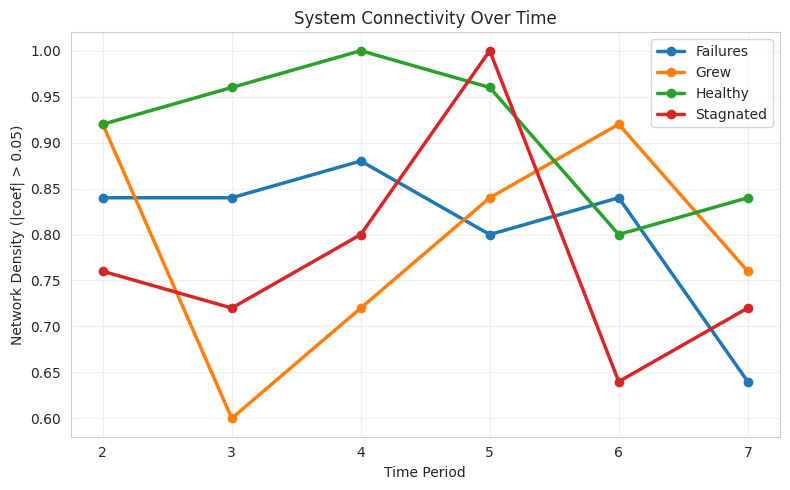


Average Density by Category:
category
Failures     0.807
Grew         0.793
Healthy      0.913
Stagnated    0.773
Name: density, dtype: float64

PROPERTY 2: DOMINANT EIGENVALUE (Stability)

💾 Saved: results_cache/eigenvalue_stability_over_time.png


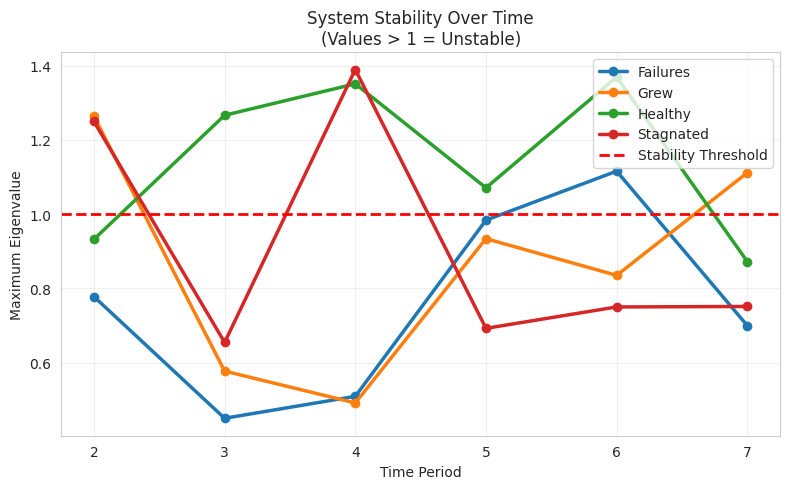


Stability Summary:
stable     Stable  Unstable
category                   
Failures        5         1
Grew            4         2
Healthy         2         4
Stagnated       4         2

PROPERTY 3: FEEDBACK LOOP STRENGTH

💾 Saved: results_cache/feedback_analysis.png


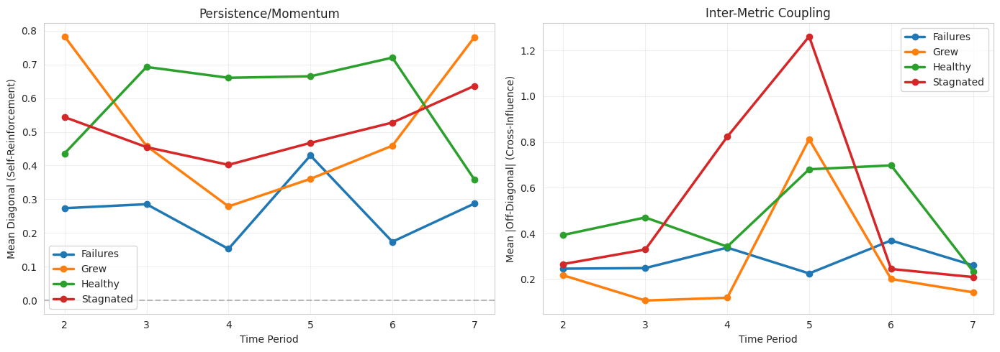


PROPERTY 4: RELATIONSHIP ASYMMETRY

💾 Saved: results_cache/asymmetry_over_time.png


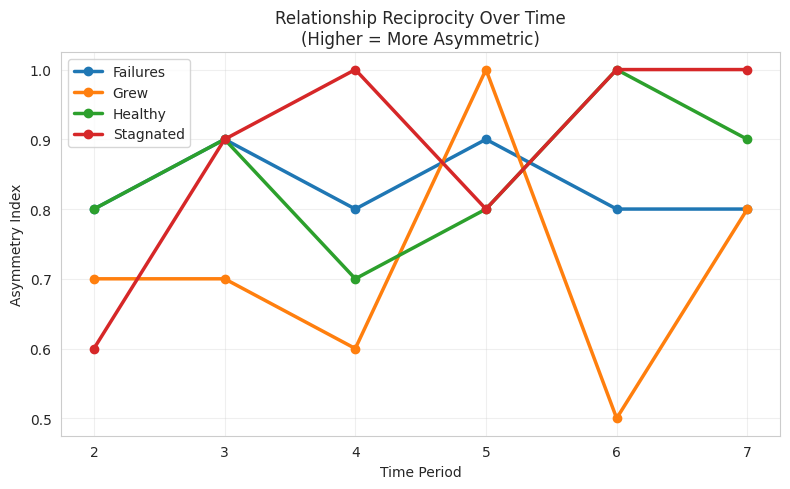


PROPERTY 5: NETWORK GRAPH METRICS

💾 Saved: results_cache/graph_properties_over_time.png


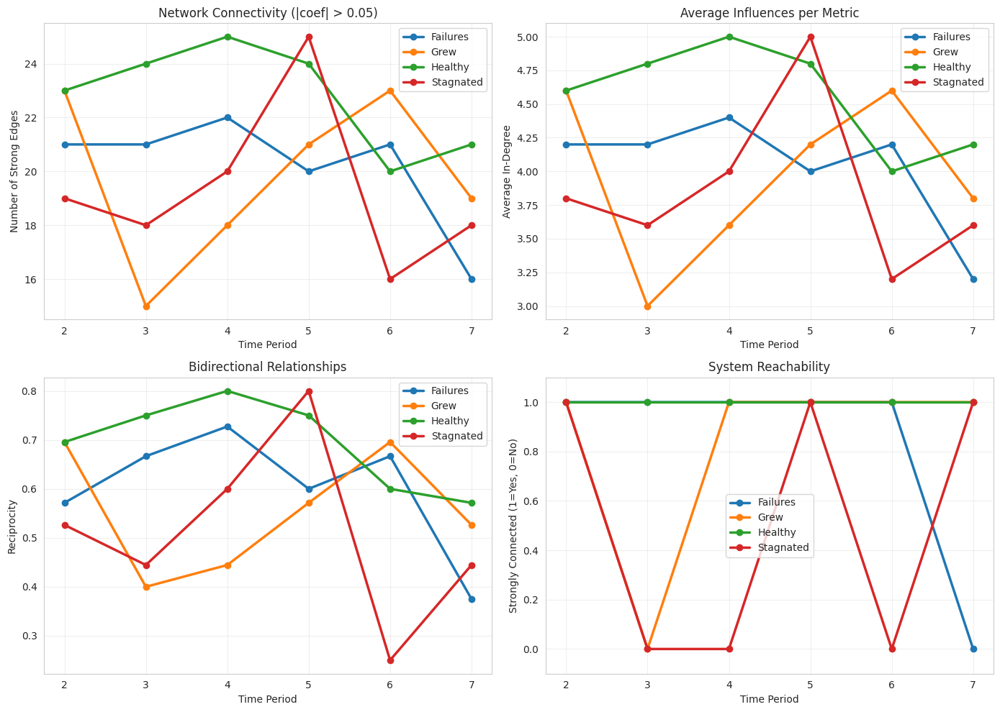


SUMMARY: MATRIX PROPERTIES BY CATEGORY


 Category  Avg_Density  Avg_MaxEigenvalue  Pct_Unstable  Avg_SelfReinforce  Avg_CrossInfluence  Avg_Asymmetry  Avg_Edges  Avg_Reciprocity
 Failures        0.807              0.756        16.667              0.267               0.282          0.833     20.167            0.601
     Grew        0.793              0.869        33.333              0.520               0.267          0.717     19.833            0.556
  Healthy        0.913              1.144        66.667              0.589               0.470          0.850     22.833            0.695
Stagnated        0.773              0.915        33.333              0.505               0.523          0.883     19.333            0.511

💾 Saved: results_cache/matrix_properties_summary.csv

INTERPRETATION GUIDE

✅ MATRIX PROPERTY ANALYSIS COMPLETE


In [ ]:
# ===============================================================
# VAR MATRIX ANALYSIS: MEASURING SYSTEM PROPERTIES
# ===============================================================
# Extract interpretable summaries from 5×5 coefficient matrices
# ===============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

print("=" * 80)
print("VAR MATRIX PROPERTY ANALYSIS")
print("=" * 80)

# Load your rolling VAR coefficients
rolling_var_df = pd.read_csv("results_cache/rolling_panel_var_coefficients.csv")

core_metrics = [
    'bus_factor_norm',
    'gini_repo_load',
    'bipartite_density',
    'knowledge_redundancy',
    'fc_attack_adaptive'
]

categories = ["Failures", "Grew", "Healthy", "Stagnated"]

# -------------------------------------------------------------------
# PROPERTY 1: NETWORK DENSITY (Connectivity)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("PROPERTY 1: NETWORK DENSITY")
print("=" * 80)

def matrix_density(A, threshold=0.05):
    """
    What fraction of relationships are "strong" (|coef| > threshold)?
    """
    strong_connections = np.sum(np.abs(A.values) > threshold)
    total_possible = A.shape[0] * A.shape[1]
    return strong_connections / total_possible

density_results = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat]

    for center in sorted(cat_df["center_snap"].unique()):
        sub = cat_df[cat_df["center_snap"] == center]
        A = sub.pivot(index="outcome", columns="predictor", values="coef")
        A = A.reindex(index=core_metrics, columns=core_metrics)

        density = matrix_density(A, threshold=0.05)

        density_results.append({
            'category': cat,
            'center_snap': center,
            'density': density
        })

density_df = pd.DataFrame(density_results)

# Plot
plt.figure(figsize=(8, 5))
for cat in categories:
    sub = density_df[density_df['category'] == cat]
    plt.plot(sub['center_snap'], sub['density'], marker='o',
             label=cat, linewidth=2.5)

plt.xlabel('Time Period')
plt.ylabel('Network Density (|coef| > 0.05)')
plt.title('System Connectivity Over Time')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('results_cache/matrix_density_over_time.png', dpi=200, bbox_inches='tight')
print("\n💾 Saved: results_cache/matrix_density_over_time.png")
plt.show()

print("\nAverage Density by Category:")
print(density_df.groupby('category')['density'].mean().round(3))

# -------------------------------------------------------------------
# PROPERTY 2: DOMINANT EIGENVALUE (System Stability)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("PROPERTY 2: DOMINANT EIGENVALUE (Stability)")
print("=" * 80)

def dominant_eigenvalue(A):
    """
    Maximum absolute eigenvalue. If > 1, system is unstable.
    """
    eigenvalues = np.linalg.eigvals(A.values)
    return np.max(np.abs(eigenvalues))

eigenvalue_results = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat]

    for center in sorted(cat_df["center_snap"].unique()):
        sub = cat_df[cat_df["center_snap"] == center]
        A = sub.pivot(index="outcome", columns="predictor", values="coef")
        A = A.reindex(index=core_metrics, columns=core_metrics)

        max_eig = dominant_eigenvalue(A)
        stable = "Stable" if max_eig < 1 else "Unstable"

        eigenvalue_results.append({
            'category': cat,
            'center_snap': center,
            'max_eigenvalue': max_eig,
            'stable': stable
        })

eigenvalue_df = pd.DataFrame(eigenvalue_results)

# Plot
plt.figure(figsize=(8, 5))
for cat in categories:
    sub = eigenvalue_df[eigenvalue_df['category'] == cat]
    plt.plot(sub['center_snap'], sub['max_eigenvalue'], marker='o',
             label=cat, linewidth=2.5)

plt.axhline(y=1.0, color='red', linestyle='--', linewidth=2,
            label='Stability Threshold')
plt.xlabel('Time Period')
plt.ylabel('Maximum Eigenvalue')
plt.title('System Stability Over Time\n(Values > 1 = Unstable)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('results_cache/eigenvalue_stability_over_time.png', dpi=200, bbox_inches='tight')
print("\n💾 Saved: results_cache/eigenvalue_stability_over_time.png")
plt.show()

print("\nStability Summary:")
print(eigenvalue_df.groupby(['category', 'stable']).size().unstack(fill_value=0))

# -------------------------------------------------------------------
# PROPERTY 3: FEEDBACK LOOP STRENGTH (Diagonal Dominance)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("PROPERTY 3: FEEDBACK LOOP STRENGTH")
print("=" * 80)

def feedback_strength(A):
    """
    Mean of diagonal elements = self-reinforcement.
    Positive = momentum, Negative = reversion.
    """
    return np.mean(np.diag(A.values))

def off_diagonal_strength(A):
    """
    Mean absolute value of off-diagonal = cross-metric influence.
    """
    n = A.shape[0]
    mask = ~np.eye(n, dtype=bool)
    return np.mean(np.abs(A.values[mask]))

feedback_results = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat]

    for center in sorted(cat_df["center_snap"].unique()):
        sub = cat_df[cat_df["center_snap"] == center]
        A = sub.pivot(index="outcome", columns="predictor", values="coef")
        A = A.reindex(index=core_metrics, columns=core_metrics)

        diag_mean = feedback_strength(A)
        off_diag_mean = off_diagonal_strength(A)

        feedback_results.append({
            'category': cat,
            'center_snap': center,
            'self_reinforcement': diag_mean,
            'cross_influence': off_diag_mean,
            'ratio': off_diag_mean / abs(diag_mean) if diag_mean != 0 else np.inf
        })

feedback_df = pd.DataFrame(feedback_results)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Self-reinforcement
ax1 = axes[0]
for cat in categories:
    sub = feedback_df[feedback_df['category'] == cat]
    ax1.plot(sub['center_snap'], sub['self_reinforcement'], marker='o',
             label=cat, linewidth=2.5)
ax1.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
ax1.set_xlabel('Time Period')
ax1.set_ylabel('Mean Diagonal (Self-Reinforcement)')
ax1.set_title('Persistence/Momentum')
ax1.legend()
ax1.grid(alpha=0.3)

# Cross-influence
ax2 = axes[1]
for cat in categories:
    sub = feedback_df[feedback_df['category'] == cat]
    ax2.plot(sub['center_snap'], sub['cross_influence'], marker='o',
             label=cat, linewidth=2.5)
ax2.set_xlabel('Time Period')
ax2.set_ylabel('Mean |Off-Diagonal| (Cross-Influence)')
ax2.set_title('Inter-Metric Coupling')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('results_cache/feedback_analysis.png', dpi=200, bbox_inches='tight')
print("\n💾 Saved: results_cache/feedback_analysis.png")
plt.show()

# -------------------------------------------------------------------
# PROPERTY 4: ASYMMETRY INDEX (Reciprocity)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("PROPERTY 4: RELATIONSHIP ASYMMETRY")
print("=" * 80)

def asymmetry_index(A):
    """
    How symmetric is the matrix? 0 = perfectly symmetric, 1 = totally asymmetric.
    Measures if metric A influences B differently than B influences A.
    """
    n = A.shape[0]
    total_pairs = 0
    asymmetric_pairs = 0

    for i in range(n):
        for j in range(i+1, n):
            a_ij = A.iloc[i, j]
            a_ji = A.iloc[j, i]

            if not (np.isnan(a_ij) or np.isnan(a_ji)):
                total_pairs += 1
                # Asymmetric if signs differ or magnitudes differ by >50%
                if np.sign(a_ij) != np.sign(a_ji):
                    asymmetric_pairs += 1
                elif abs(a_ij - a_ji) / (abs(a_ij) + abs(a_ji)) > 0.5:
                    asymmetric_pairs += 1

    return asymmetric_pairs / total_pairs if total_pairs > 0 else 0

asymmetry_results = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat]

    for center in sorted(cat_df["center_snap"].unique()):
        sub = cat_df[cat_df["center_snap"] == center]
        A = sub.pivot(index="outcome", columns="predictor", values="coef")
        A = A.reindex(index=core_metrics, columns=core_metrics)

        asym = asymmetry_index(A)

        asymmetry_results.append({
            'category': cat,
            'center_snap': center,
            'asymmetry': asym
        })

asymmetry_df = pd.DataFrame(asymmetry_results)

# Plot
plt.figure(figsize=(8, 5))
for cat in categories:
    sub = asymmetry_df[asymmetry_df['category'] == cat]
    plt.plot(sub['center_snap'], sub['asymmetry'], marker='o',
             label=cat, linewidth=2.5)

plt.xlabel('Time Period')
plt.ylabel('Asymmetry Index')
plt.title('Relationship Reciprocity Over Time\n(Higher = More Asymmetric)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('results_cache/asymmetry_over_time.png', dpi=200, bbox_inches='tight')
print("\n💾 Saved: results_cache/asymmetry_over_time.png")
plt.show()

# -------------------------------------------------------------------
# PROPERTY 5: NETWORK GRAPH REPRESENTATION
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("PROPERTY 5: NETWORK GRAPH METRICS")
print("=" * 80)

def matrix_to_graph(A, threshold=0.05):
    """
    Convert coefficient matrix to directed graph.
    Edges only if |coef| > threshold.
    """
    G = nx.DiGraph()

    for i, outcome in enumerate(A.index):
        for j, predictor in enumerate(A.columns):
            coef = A.iloc[i, j]
            if abs(coef) > threshold:
                G.add_edge(predictor, outcome, weight=abs(coef), coef=coef)

    return G

def graph_properties(G):
    """
    Extract graph-theoretic properties.
    """
    if G.number_of_nodes() == 0:
        return {
            'n_edges': 0,
            'density': 0,
            'avg_in_degree': 0,
            'avg_out_degree': 0,
            'reciprocity': 0,
            'strongly_connected': False
        }

    return {
        'n_edges': G.number_of_edges(),
        'density': nx.density(G),
        'avg_in_degree': np.mean([d for n, d in G.in_degree()]),
        'avg_out_degree': np.mean([d for n, d in G.out_degree()]),
        'reciprocity': nx.reciprocity(G),
        'strongly_connected': nx.is_strongly_connected(G)
    }

graph_results = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat]

    for center in sorted(cat_df["center_snap"].unique()):
        sub = cat_df[cat_df["center_snap"] == center]
        A = sub.pivot(index="outcome", columns="predictor", values="coef")
        A = A.reindex(index=core_metrics, columns=core_metrics)

        G = matrix_to_graph(A, threshold=0.05)
        props = graph_properties(G)

        graph_results.append({
            'category': cat,
            'center_snap': center,
            **props
        })

graph_df = pd.DataFrame(graph_results)

# Plot key graph properties
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Number of edges
ax1 = axes[0, 0]
for cat in categories:
    sub = graph_df[graph_df['category'] == cat]
    ax1.plot(sub['center_snap'], sub['n_edges'], marker='o',
             label=cat, linewidth=2.5)
ax1.set_xlabel('Time Period')
ax1.set_ylabel('Number of Strong Edges')
ax1.set_title('Network Connectivity (|coef| > 0.05)')
ax1.legend()
ax1.grid(alpha=0.3)

# Average degree
ax2 = axes[0, 1]
for cat in categories:
    sub = graph_df[graph_df['category'] == cat]
    ax2.plot(sub['center_snap'], sub['avg_in_degree'], marker='o',
             label=cat, linewidth=2.5)
ax2.set_xlabel('Time Period')
ax2.set_ylabel('Average In-Degree')
ax2.set_title('Average Influences per Metric')
ax2.legend()
ax2.grid(alpha=0.3)

# Reciprocity
ax3 = axes[1, 0]
for cat in categories:
    sub = graph_df[graph_df['category'] == cat]
    ax3.plot(sub['center_snap'], sub['reciprocity'], marker='o',
             label=cat, linewidth=2.5)
ax3.set_xlabel('Time Period')
ax3.set_ylabel('Reciprocity')
ax3.set_title('Bidirectional Relationships')
ax3.legend()
ax3.grid(alpha=0.3)

# Strong connectivity
ax4 = axes[1, 1]
for cat in categories:
    sub = graph_df[graph_df['category'] == cat]
    connected = sub['strongly_connected'].astype(int)
    ax4.plot(sub['center_snap'], connected, marker='o',
             label=cat, linewidth=2.5)
ax4.set_xlabel('Time Period')
ax4.set_ylabel('Strongly Connected (1=Yes, 0=No)')
ax4.set_title('System Reachability')
ax4.legend()
ax4.grid(alpha=0.3)
ax4.set_ylim([-0.1, 1.1])

plt.tight_layout()
plt.savefig('results_cache/graph_properties_over_time.png', dpi=200, bbox_inches='tight')
print("\n💾 Saved: results_cache/graph_properties_over_time.png")
plt.show()

# -------------------------------------------------------------------
# SUMMARY TABLE: ALL PROPERTIES
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("SUMMARY: MATRIX PROPERTIES BY CATEGORY")
print("=" * 80)

summary = pd.DataFrame()

for cat in categories:
    cat_summary = {
        'Category': cat,
        'Avg_Density': density_df[density_df['category'] == cat]['density'].mean(),
        'Avg_MaxEigenvalue': eigenvalue_df[eigenvalue_df['category'] == cat]['max_eigenvalue'].mean(),
        'Pct_Unstable': (eigenvalue_df[eigenvalue_df['category'] == cat]['max_eigenvalue'] > 1).mean() * 100,
        'Avg_SelfReinforce': feedback_df[feedback_df['category'] == cat]['self_reinforcement'].mean(),
        'Avg_CrossInfluence': feedback_df[feedback_df['category'] == cat]['cross_influence'].mean(),
        'Avg_Asymmetry': asymmetry_df[asymmetry_df['category'] == cat]['asymmetry'].mean(),
        'Avg_Edges': graph_df[graph_df['category'] == cat]['n_edges'].mean(),
        'Avg_Reciprocity': graph_df[graph_df['category'] == cat]['reciprocity'].mean(),
    }
    summary = pd.concat([summary, pd.DataFrame([cat_summary])], ignore_index=True)

print("\n")
print(summary.round(3).to_string(index=False))

summary.to_csv('results_cache/matrix_properties_summary.csv', index=False)
print("\n💾 Saved: results_cache/matrix_properties_summary.csv")

# -------------------------------------------------------------------
# INTERPRETATION GUIDE
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("INTERPRETATION GUIDE")
print("=" * 80)
print("\n✅ MATRIX PROPERTY ANALYSIS COMPLETE")
print("=" * 80)

METRIC RELATIONSHIP NETWORK MAPS

VIZ 1: AGGREGATE RELATIONSHIP NETWORKS

💾 Saved: results_cache/aggregate_relationship_networks.png


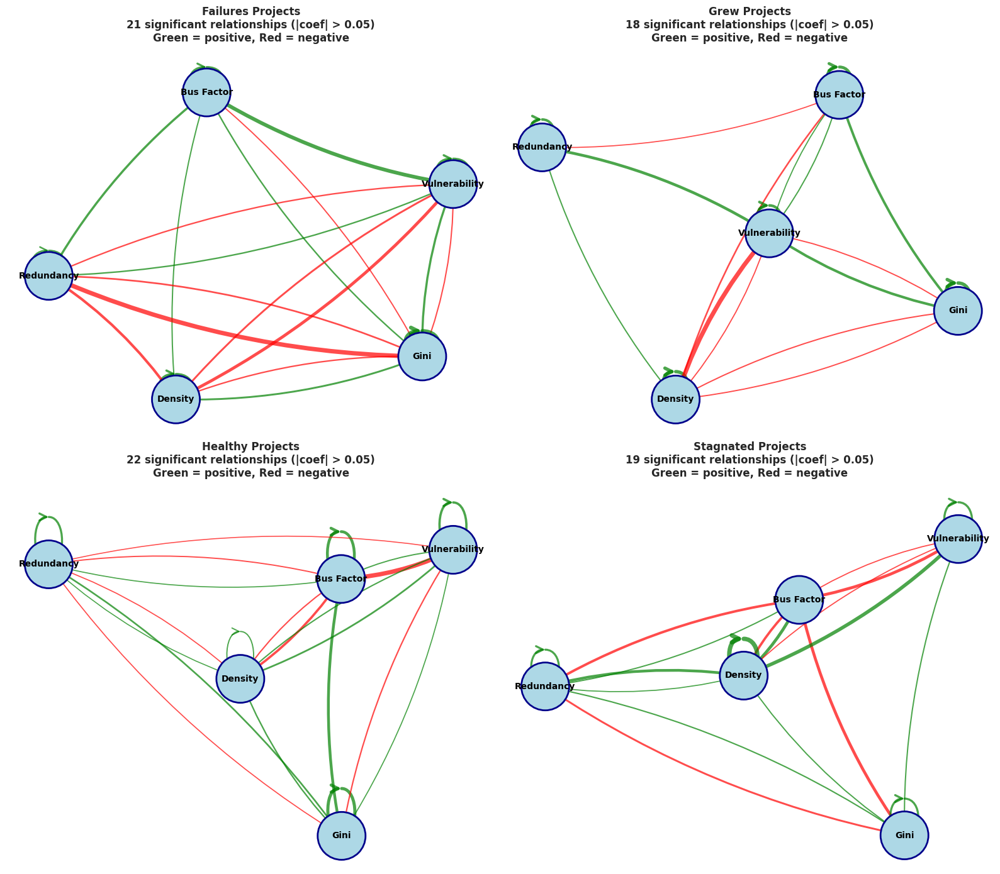


VIZ 2: RELATIONSHIP STRENGTH HEATMAPS

💾 Saved: results_cache/relationship_heatmaps.png


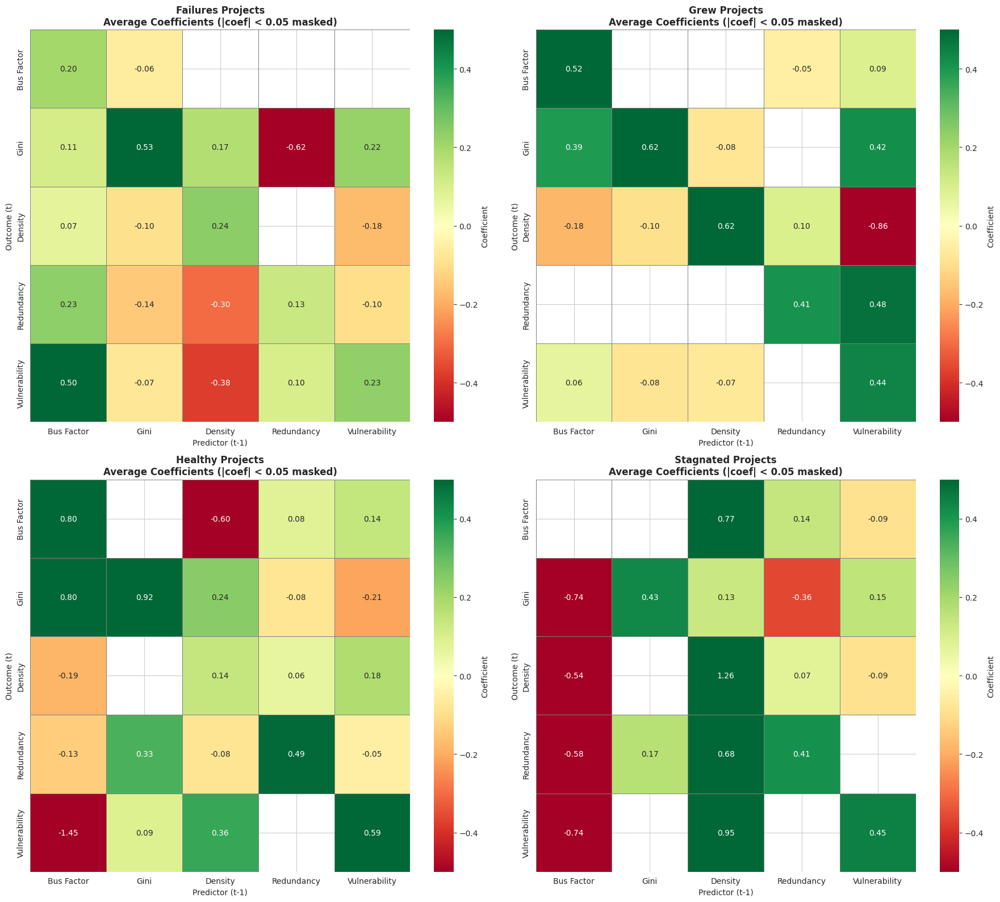


VIZ 3: TIME-EVOLVING RELATIONSHIP NETWORKS

💾 Saved: results_cache/network_evolution_Failures.png


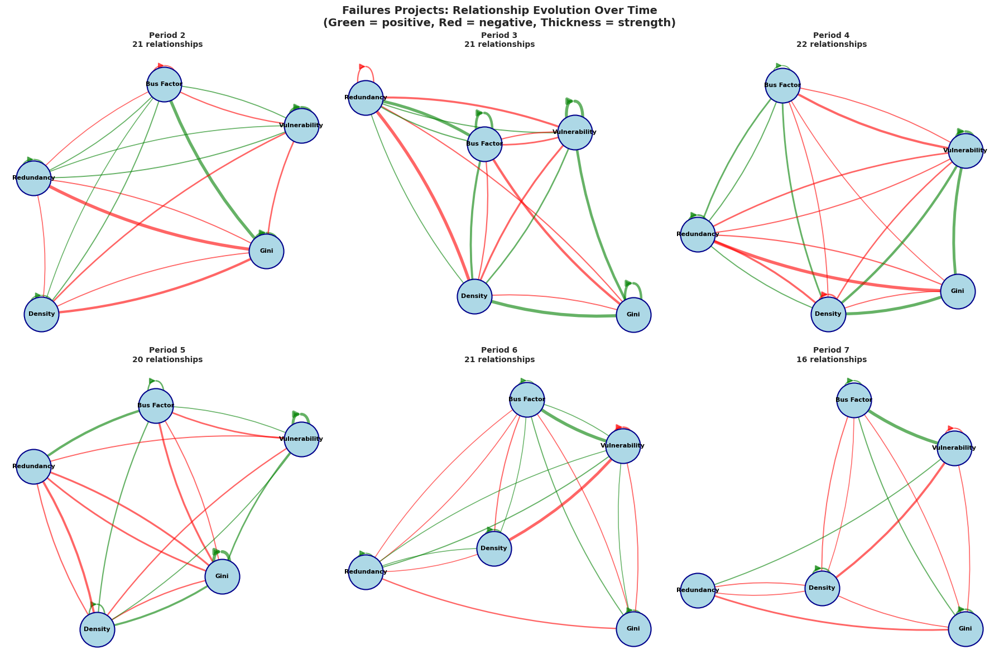


💾 Saved: results_cache/network_evolution_Grew.png


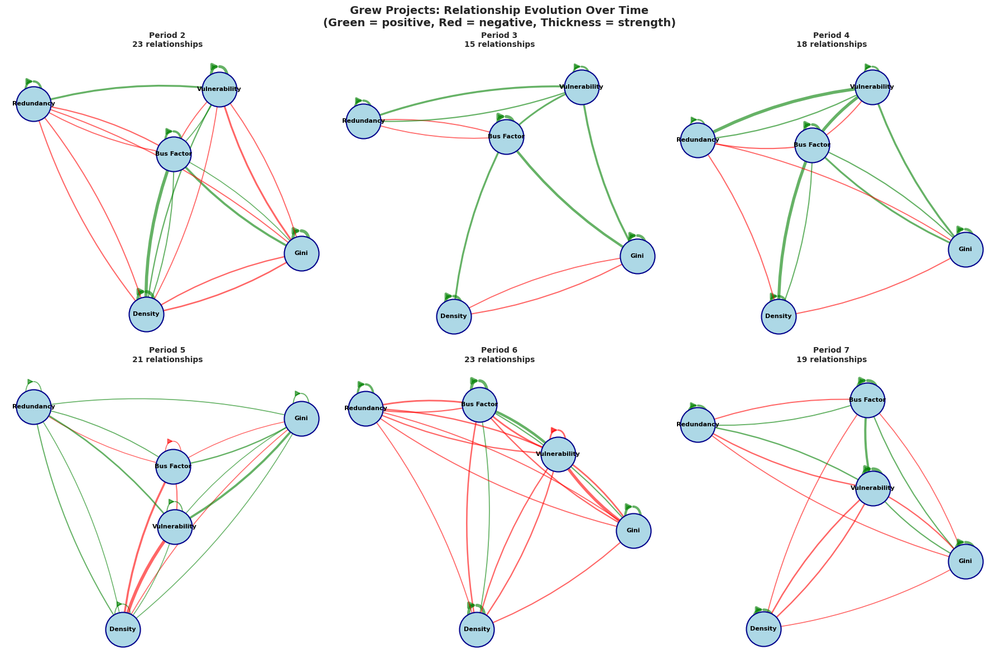


💾 Saved: results_cache/network_evolution_Healthy.png


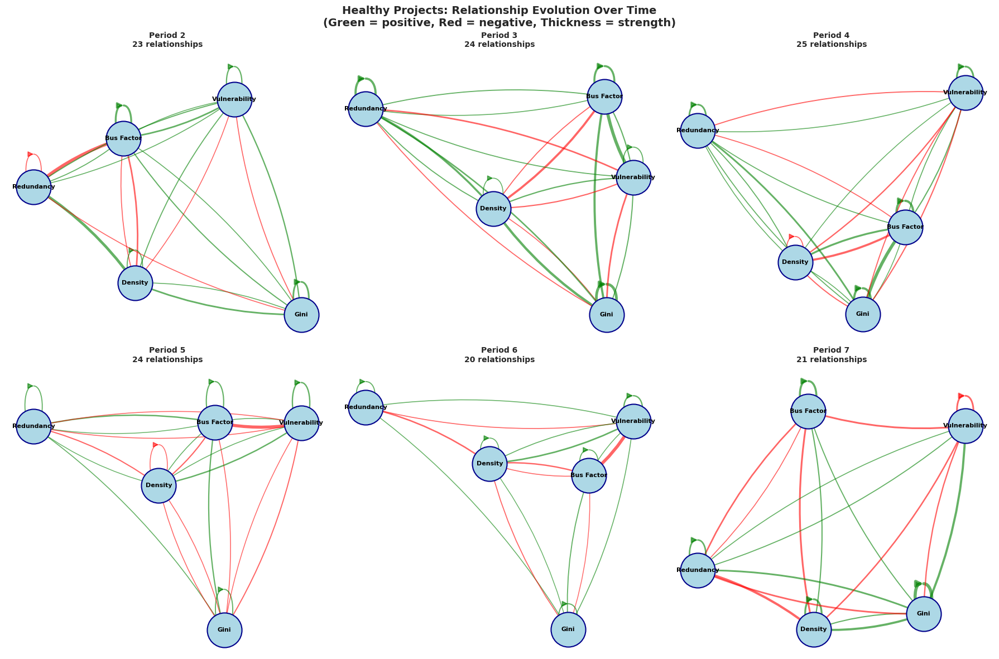


💾 Saved: results_cache/network_evolution_Stagnated.png


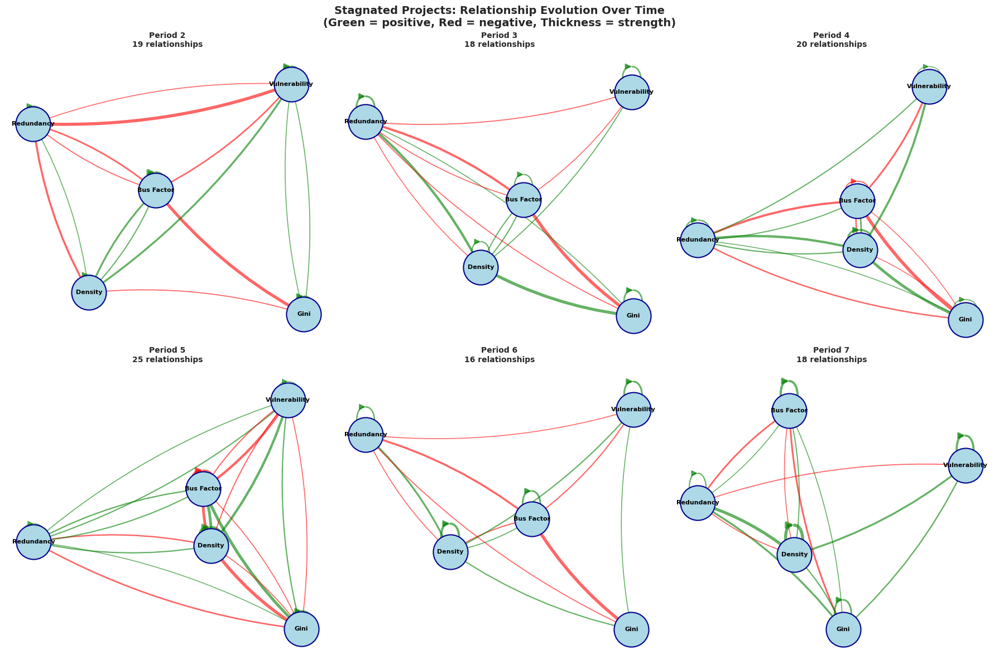


VIZ 4: KEY RELATIONSHIP TRAJECTORIES

💾 Saved: results_cache/key_relationships_Failures.png


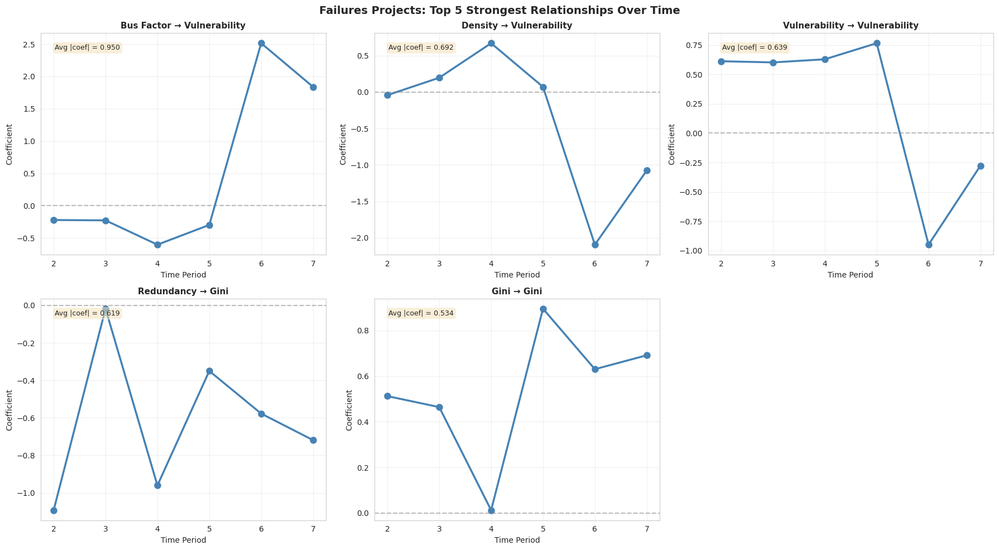


💾 Saved: results_cache/key_relationships_Grew.png


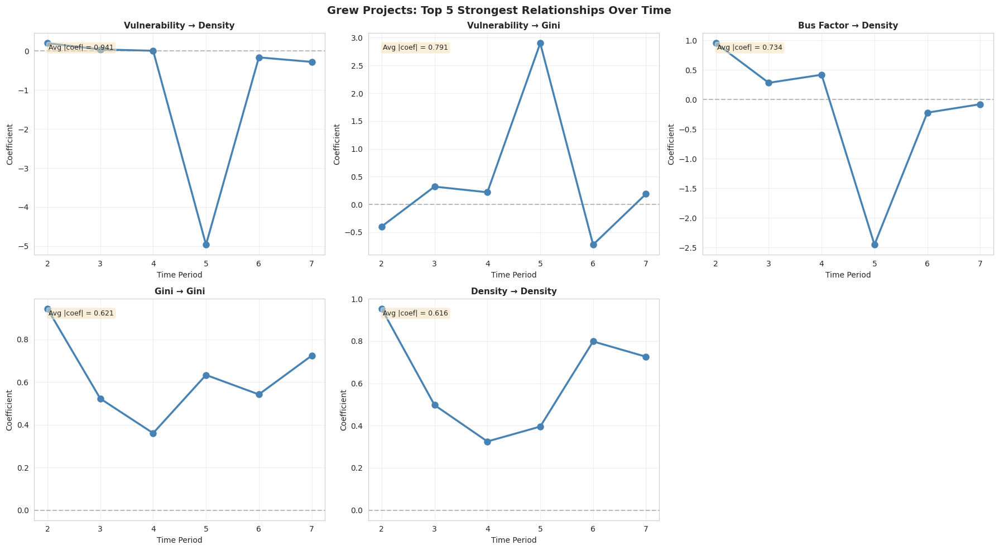


💾 Saved: results_cache/key_relationships_Healthy.png


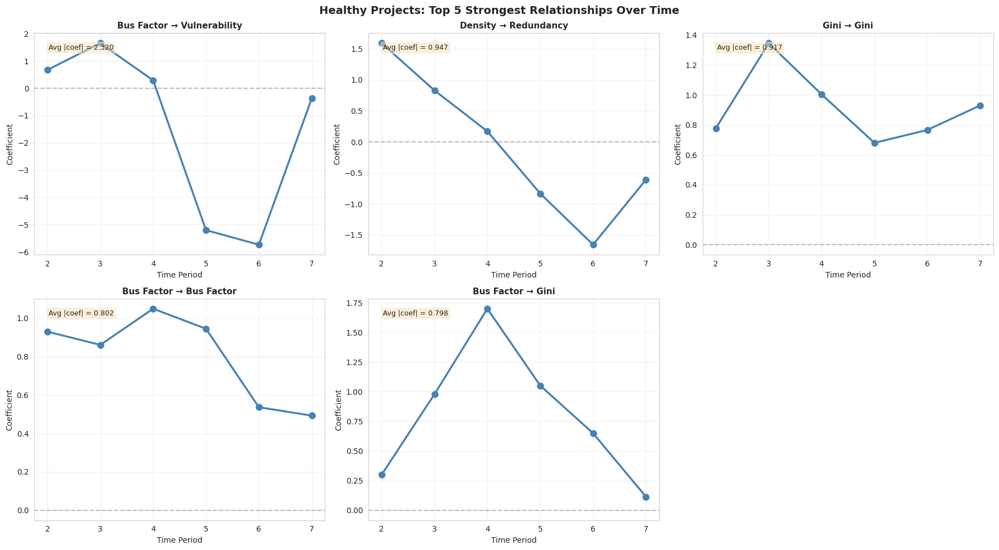


💾 Saved: results_cache/key_relationships_Stagnated.png


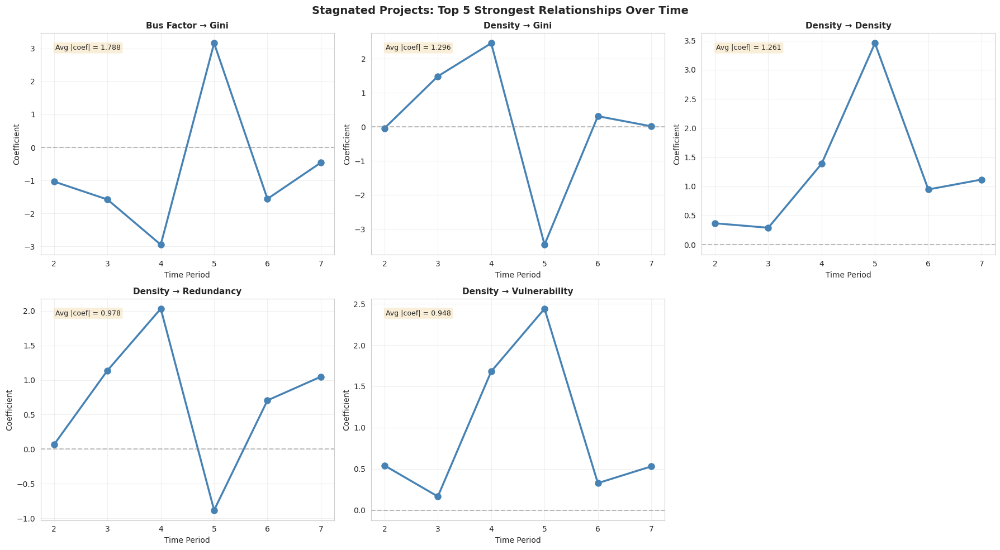


SUMMARY: RELATIONSHIP PATTERNS

Relationship Counts:
 Category  Strong_Positive  Strong_Negative  Weak  Total   Most_Influential    Most_Influenced
 Failures               12                9     4     25    bus_factor_norm     gini_repo_load
     Grew               11                7     7     25 fc_attack_adaptive  bipartite_density
  Healthy               14                8     3     25    bus_factor_norm fc_attack_adaptive
Stagnated               12                7     6     25  bipartite_density fc_attack_adaptive

💾 Saved: results_cache/relationship_summary.csv

✅ METRIC RELATIONSHIP NETWORK MAPS COMPLETE


In [ ]:
# ===============================================================
# METRIC RELATIONSHIP NETWORK MAPS
# ===============================================================
# Visualize how metrics influence each other within each category
# Show evolution over time + aggregate view
# ===============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from matplotlib.patches import FancyBboxPatch

print("=" * 80)
print("METRIC RELATIONSHIP NETWORK MAPS")
print("=" * 80)

# Load rolling VAR coefficients
rolling_var_df = pd.read_csv("results_cache/rolling_panel_var_coefficients.csv")

core_metrics = [
    'bus_factor_norm',
    'gini_repo_load',
    'bipartite_density',
    'knowledge_redundancy',
    'fc_attack_adaptive'
]

# Shorter labels for visualization
metric_labels = {
    'bus_factor_norm': 'Bus Factor',
    'gini_repo_load': 'Gini',
    'bipartite_density': 'Density',
    'knowledge_redundancy': 'Redundancy',
    'fc_attack_adaptive': 'Vulnerability'
}

categories = ["Failures", "Grew", "Healthy", "Stagnated"]

# -------------------------------------------------------------------
# VISUALIZATION 1: AGGREGATE NETWORK (AVERAGE ACROSS TIME)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("VIZ 1: AGGREGATE RELATIONSHIP NETWORKS")
print("=" * 80)

def create_aggregate_network(rolling_var_df, category, threshold=0.05):
    """
    Create network showing average relationships across all time periods.
    """
    cat_df = rolling_var_df[rolling_var_df["category"] == category].copy()

    # Average coefficients across all time windows
    avg_coefs = cat_df.groupby(['outcome', 'predictor'])['coef'].mean().reset_index()

    # Create directed graph
    G = nx.DiGraph()

    # Add all metrics as nodes
    for metric in core_metrics:
        G.add_node(metric, label=metric_labels[metric])

    # Add edges for strong relationships
    for _, row in avg_coefs.iterrows():
        coef = row['coef']
        if abs(coef) > threshold:
            G.add_edge(
                row['predictor'],
                row['outcome'],
                weight=abs(coef),
                coef=coef,
                sign='+' if coef > 0 else '-'
            )

    return G

# Create aggregate networks for each category
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, category in enumerate(categories):
    ax = axes[idx]

    G = create_aggregate_network(rolling_var_df, category, threshold=0.05)

    # Layout - spring layout for clarity
    pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

    # Draw nodes
    node_sizes = [3000] * len(G.nodes())
    nx.draw_networkx_nodes(
        G, pos,
        node_size=node_sizes,
        node_color='lightblue',
        edgecolors='darkblue',
        linewidths=2,
        ax=ax
    )

    # Draw edges with varying thickness and color
    for (u, v, data) in G.edges(data=True):
        coef = data['coef']
        weight = data['weight']

        # Color: green for positive, red for negative
        color = 'green' if coef > 0 else 'red'

        # Width proportional to strength
        max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])
        width = 1 + (weight / max_weight) * 4

        # Draw edge
        nx.draw_networkx_edges(
            G, pos, [(u, v)],
            width=width,
            edge_color=color,
            alpha=0.7,
            arrows=True,
            arrowsize=20,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax
        )

    # Draw labels
    labels = {node: metric_labels[node] for node in G.nodes()}
    nx.draw_networkx_labels(
        G, pos, labels,
        font_size=10,
        font_weight='bold',
        ax=ax
    )

    # Title with stats
    n_edges = G.number_of_edges()
    ax.set_title(
        f'{category} Projects\n'
        f'{n_edges} significant relationships (|coef| > 0.05)\n'
        f'Green = positive, Red = negative',
        fontsize=12,
        fontweight='bold'
    )
    ax.axis('off')

plt.tight_layout()
plt.savefig('results_cache/aggregate_relationship_networks.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/aggregate_relationship_networks.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 2: RELATIONSHIP CHORD DIAGRAM
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("VIZ 2: RELATIONSHIP STRENGTH HEATMAPS")
print("=" * 80)

fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.flatten()

for idx, category in enumerate(categories):
    ax = axes[idx]

    cat_df = rolling_var_df[rolling_var_df["category"] == category].copy()

    # Average coefficients
    avg_coefs = cat_df.groupby(['outcome', 'predictor'])['coef'].mean().reset_index()

    # Pivot to matrix
    matrix = avg_coefs.pivot(index='outcome', columns='predictor', values='coef')
    matrix = matrix.reindex(index=core_metrics, columns=core_metrics)

    # Plot heatmap
    mask = np.abs(matrix.values) < 0.05  # Mask weak relationships

    sns.heatmap(
        matrix,
        annot=True,
        fmt='.2f',
        cmap='RdYlGn',
        center=0,
        vmin=-0.5,
        vmax=0.5,
        mask=mask,
        cbar_kws={'label': 'Coefficient'},
        linewidths=0.5,
        linecolor='gray',
        xticklabels=[metric_labels[m] for m in core_metrics],
        yticklabels=[metric_labels[m] for m in core_metrics],
        ax=ax
    )

    ax.set_title(f'{category} Projects\nAverage Coefficients (|coef| < 0.05 masked)',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Predictor (t-1)')
    ax.set_ylabel('Outcome (t)')

plt.tight_layout()
plt.savefig('results_cache/relationship_heatmaps.png', dpi=300, bbox_inches='tight')
print("\n💾 Saved: results_cache/relationship_heatmaps.png")
plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 3: TIME-EVOLVING NETWORKS (SMALL MULTIPLES)
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("VIZ 3: TIME-EVOLVING RELATIONSHIP NETWORKS")
print("=" * 80)

def create_network_snapshot(rolling_var_df, category, center_snap, threshold=0.05):
    """
    Create network for a specific time window.
    """
    cat_df = rolling_var_df[
        (rolling_var_df["category"] == category) &
        (rolling_var_df["center_snap"] == center_snap)
    ].copy()

    if cat_df.empty:
        return None

    G = nx.DiGraph()

    for metric in core_metrics:
        G.add_node(metric, label=metric_labels[metric])

    for _, row in cat_df.iterrows():
        coef = row['coef']
        if abs(coef) > threshold:
            G.add_edge(
                row['predictor'],
                row['outcome'],
                weight=abs(coef),
                coef=coef
            )

    return G

# For each category, show evolution
for category in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == category]
    time_points = sorted(cat_df["center_snap"].unique())

    n_times = len(time_points)
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, center in enumerate(time_points):
        if idx >= len(axes):
            break

        ax = axes[idx]

        G = create_network_snapshot(rolling_var_df, category, center, threshold=0.05)

        if G is None or G.number_of_nodes() == 0:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center')
            ax.axis('off')
            continue

        # Use same layout for all time points for comparison
        pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

        # Draw nodes
        nx.draw_networkx_nodes(
            G, pos,
            node_size=2000,
            node_color='lightblue',
            edgecolors='darkblue',
            linewidths=1.5,
            ax=ax
        )

        # Draw edges
        for (u, v, data) in G.edges(data=True):
            coef = data['coef']
            weight = data['weight']
            color = 'green' if coef > 0 else 'red'

            if G.number_of_edges() > 0:
                max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])
                width = 1 + (weight / max_weight) * 3
            else:
                width = 1

            nx.draw_networkx_edges(
                G, pos, [(u, v)],
                width=width,
                edge_color=color,
                alpha=0.6,
                arrows=True,
                arrowsize=15,
                connectionstyle='arc3,rad=0.1',
                ax=ax
            )

        # Draw labels
        labels = {node: metric_labels[node] for node in G.nodes()}
        nx.draw_networkx_labels(G, pos, labels, font_size=8, font_weight='bold', ax=ax)

        # Title
        n_edges = G.number_of_edges()
        ax.set_title(f'Period {center}\n{n_edges} relationships', fontsize=10, fontweight='bold')
        ax.axis('off')

    # Hide unused subplots
    for idx in range(len(time_points), len(axes)):
        axes[idx].axis('off')

    plt.suptitle(f'{category} Projects: Relationship Evolution Over Time\n'
                 f'(Green = positive, Red = negative, Thickness = strength)',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'results_cache/network_evolution_{category}.png', dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: results_cache/network_evolution_{category}.png")
    plt.show()

# -------------------------------------------------------------------
# VISUALIZATION 4: KEY RELATIONSHIPS TRACKER
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("VIZ 4: KEY RELATIONSHIP TRAJECTORIES")
print("=" * 80)

# Identify most important relationships (highest average |coef|)
key_relationships = []

for cat in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == cat].copy()

    # Compute mean absolute coefficient for each relationship
    rel_strength = cat_df.groupby(['predictor', 'outcome'])['coef'].apply(
        lambda x: np.mean(np.abs(x))
    ).reset_index(name='avg_abs_coef')

    # Get top 5 relationships
    top_5 = rel_strength.nlargest(5, 'avg_abs_coef')

    for _, row in top_5.iterrows():
        key_relationships.append({
            'category': cat,
            'predictor': row['predictor'],
            'outcome': row['outcome'],
            'strength': row['avg_abs_coef']
        })

key_rel_df = pd.DataFrame(key_relationships)

# Plot trajectory of each key relationship
for category in categories:
    cat_rels = key_rel_df[key_rel_df['category'] == category]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for idx, (_, rel) in enumerate(cat_rels.iterrows()):
        if idx >= len(axes):
            break

        ax = axes[idx]

        # Get coefficient trajectory
        traj = rolling_var_df[
            (rolling_var_df['category'] == category) &
            (rolling_var_df['predictor'] == rel['predictor']) &
            (rolling_var_df['outcome'] == rel['outcome'])
        ].sort_values('center_snap')

        # Plot
        ax.plot(traj['center_snap'], traj['coef'], marker='o',
                linewidth=2.5, markersize=8, color='steelblue')
        ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)

        # Formatting
        pred_label = metric_labels[rel['predictor']]
        out_label = metric_labels[rel['outcome']]
        ax.set_title(f'{pred_label} → {out_label}', fontsize=11, fontweight='bold')
        ax.set_xlabel('Time Period')
        ax.set_ylabel('Coefficient')
        ax.grid(alpha=0.3)

        # Annotate strength
        ax.text(0.05, 0.95, f'Avg |coef| = {rel["strength"]:.3f}',
                transform=ax.transAxes, fontsize=9,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    # Hide unused subplots
    for idx in range(len(cat_rels), len(axes)):
        axes[idx].axis('off')

    plt.suptitle(f'{category} Projects: Top 5 Strongest Relationships Over Time',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'results_cache/key_relationships_{category}.png', dpi=300, bbox_inches='tight')
    print(f"\n💾 Saved: results_cache/key_relationships_{category}.png")
    plt.show()

# -------------------------------------------------------------------
# SUMMARY: RELATIONSHIP COUNTS
# -------------------------------------------------------------------
print("\n" + "=" * 80)
print("SUMMARY: RELATIONSHIP PATTERNS")
print("=" * 80)

summary_stats = []

for category in categories:
    cat_df = rolling_var_df[rolling_var_df["category"] == category].copy()

    # Average across time
    avg_coefs = cat_df.groupby(['outcome', 'predictor'])['coef'].mean().reset_index()

    # Count relationships by type
    strong_pos = len(avg_coefs[avg_coefs['coef'] > 0.05])
    strong_neg = len(avg_coefs[avg_coefs['coef'] < -0.05])
    weak = len(avg_coefs[np.abs(avg_coefs['coef']) <= 0.05])

    # Identify most influential metrics
    predictor_strength = avg_coefs.groupby('predictor')['coef'].apply(
        lambda x: np.sum(np.abs(x))
    ).sort_values(ascending=False)

    outcome_strength = avg_coefs.groupby('outcome')['coef'].apply(
        lambda x: np.sum(np.abs(x))
    ).sort_values(ascending=False)

    summary_stats.append({
        'Category': category,
        'Strong_Positive': strong_pos,
        'Strong_Negative': strong_neg,
        'Weak': weak,
        'Total': len(avg_coefs),
        'Most_Influential': predictor_strength.index[0] if len(predictor_strength) > 0 else 'N/A',
        'Most_Influenced': outcome_strength.index[0] if len(outcome_strength) > 0 else 'N/A'
    })

summary_df = pd.DataFrame(summary_stats)

print("\nRelationship Counts:")
print(summary_df.to_string(index=False))

# Map to readable names
summary_df['Most_Influential'] = summary_df['Most_Influential'].map(metric_labels)
summary_df['Most_Influenced'] = summary_df['Most_Influenced'].map(metric_labels)

summary_df.to_csv('results_cache/relationship_summary.csv', index=False)
print("\n💾 Saved: results_cache/relationship_summary.csv")

print("\n✅ METRIC RELATIONSHIP NETWORK MAPS COMPLETE")
print("=" * 80)

In [ ]:
# ===============================================================
# ENHANCED CATEGORY-LEVEL METRIC PLOTS + CHANGE ANALYSIS
# ===============================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_category_metrics_with_changes(traj_file, out_prefix="results_cache/category_metric",
                                       show_individual=False):
    """
    Plot both raw trajectories and absolute changes for each metric.
    Also compute and display mean/std of changes by category.

    Parameters:
    -----------
    traj_file : str
        Path to trajectory CSV file
    out_prefix : str
        Prefix for output files
    show_individual : bool
        If True, show individual plots for each metric (original behavior)
        If False (default), show all metrics in consolidated multi-panel figures
    """
    df = pd.read_csv(traj_file)

    metrics = [c for c in df.columns if c not in ["Category", "Snapshot"]]
    categories = df["Category"].unique()

    # ============================================================
    # PART 1: RAW TRAJECTORIES
    # ============================================================

    print("\n" + "="*80)
    print("PLOTTING RAW METRIC TRAJECTORIES")
    print("="*80)

    if show_individual:
        # Original: one plot per metric
        for metric in metrics:
            plt.figure(figsize=(10, 6))

            for cat in categories:
                sub = df[df["Category"] == cat]
                plt.plot(
                    sub["Snapshot"],
                    sub[metric],
                    marker="o",
                    linewidth=2,
                    label=cat
                )

            plt.title(f"{metric} — Raw Values Over Time", fontsize=14, fontweight='bold')
            plt.xlabel("Snapshot", fontsize=12)
            plt.ylabel(metric, fontsize=12)
            plt.grid(True, alpha=0.3)
            plt.legend(loc='best', fontsize=10)
            plt.tight_layout()

            outpath = f"{out_prefix}_raw_{metric}.png"
            plt.savefig(outpath, dpi=200, bbox_inches='tight')
            print(f"  Saved: {outpath}")
            plt.show()
    else:
        # Consolidated: all metrics in one multi-panel figure
        n_metrics = len(metrics)
        n_cols = 3
        n_rows = int(np.ceil(n_metrics / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
        axes = axes.flatten() if n_metrics > 1 else [axes]

        for idx, metric in enumerate(metrics):
            ax = axes[idx]

            for cat in categories:
                sub = df[df["Category"] == cat]
                ax.plot(
                    sub["Snapshot"],
                    sub[metric],
                    marker="o",
                    linewidth=2,
                    label=cat
                )

            ax.set_title(f"{metric}", fontsize=11, fontweight='bold')
            ax.set_xlabel("Snapshot", fontsize=10)
            ax.set_ylabel(metric, fontsize=10)
            ax.grid(True, alpha=0.3)
            if idx == 0:  # Only show legend on first plot
                ax.legend(loc='best', fontsize=9)

        # Hide unused subplots
        for idx in range(n_metrics, len(axes)):
            axes[idx].axis('off')

        plt.suptitle("Raw Metric Trajectories by Category",
                     fontsize=16, fontweight='bold', y=1.00)
        plt.tight_layout()

        outpath = f"{out_prefix}_raw_ALL_METRICS.png"
        plt.savefig(outpath, dpi=200, bbox_inches='tight')
        print(f"  Saved consolidated plot: {outpath}")
        plt.show()

    # ============================================================
    # PART 2: ABSOLUTE CHANGES (Δ between consecutive snapshots)
    # ============================================================

    print("\n" + "="*80)
    print("COMPUTING & PLOTTING ABSOLUTE CHANGES")
    print("="*80)

    # Compute changes for each category
    change_records = []

    for cat in categories:
        cat_df = df[df["Category"] == cat].sort_values("Snapshot")

        for metric in metrics:
            values = cat_df[metric].values
            snapshots = cat_df["Snapshot"].values

            # Compute absolute changes between consecutive snapshots
            for i in range(1, len(values)):
                change = abs(values[i] - values[i-1])
                change_records.append({
                    "Category": cat,
                    "Metric": metric,
                    "Snapshot_From": snapshots[i-1],
                    "Snapshot_To": snapshots[i],
                    "Absolute_Change": change
                })

    change_df = pd.DataFrame(change_records)

    # Plot absolute changes
    if show_individual:
        # Original: one plot per metric
        for metric in metrics:
            plt.figure(figsize=(10, 6))

            metric_changes = change_df[change_df["Metric"] == metric]

            for cat in categories:
                cat_changes = metric_changes[metric_changes["Category"] == cat]
                plt.plot(
                    cat_changes["Snapshot_To"],
                    cat_changes["Absolute_Change"],
                    marker="s",
                    linewidth=2,
                    label=cat
                )

            plt.title(f"{metric} — Absolute Changes (|Δ|) Over Time", fontsize=14, fontweight='bold')
            plt.xlabel("Snapshot (To)", fontsize=12)
            plt.ylabel(f"Absolute Change in {metric}", fontsize=12)
            plt.grid(True, alpha=0.3)
            plt.legend(loc='best', fontsize=10)
            plt.tight_layout()

            outpath = f"{out_prefix}_changes_{metric}.png"
            plt.savefig(outpath, dpi=200, bbox_inches='tight')
            print(f"  Saved: {outpath}")
            plt.show()
    else:
        # Consolidated: all metrics in one multi-panel figure
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
        axes = axes.flatten() if n_metrics > 1 else [axes]

        for idx, metric in enumerate(metrics):
            ax = axes[idx]

            metric_changes = change_df[change_df["Metric"] == metric]

            for cat in categories:
                cat_changes = metric_changes[metric_changes["Category"] == cat]
                ax.plot(
                    cat_changes["Snapshot_To"],
                    cat_changes["Absolute_Change"],
                    marker="s",
                    linewidth=2,
                    label=cat
                )

            ax.set_title(f"{metric}", fontsize=11, fontweight='bold')
            ax.set_xlabel("Snapshot", fontsize=10)
            ax.set_ylabel(f"|Δ| {metric}", fontsize=10)
            ax.grid(True, alpha=0.3)
            if idx == 0:
                ax.legend(loc='best', fontsize=9)

        # Hide unused subplots
        for idx in range(n_metrics, len(axes)):
            axes[idx].axis('off')

        plt.suptitle("Absolute Changes (|Δ|) by Category",
                     fontsize=16, fontweight='bold', y=1.00)
        plt.tight_layout()

        outpath = f"{out_prefix}_changes_ALL_METRICS.png"
        plt.savefig(outpath, dpi=200, bbox_inches='tight')
        print(f"  Saved consolidated plot: {outpath}")
        plt.show()

    # ============================================================
    # PART 3: SUMMARY STATISTICS OF CHANGES
    # ============================================================

    print("\n" + "="*80)
    print("SUMMARY STATISTICS: ABSOLUTE CHANGES BY CATEGORY & METRIC")
    print("="*80)

    # Group by category and metric
    summary = change_df.groupby(["Category", "Metric"])["Absolute_Change"].agg([
        ('Mean', 'mean'),
        ('Std', 'std'),
        ('Min', 'min'),
        ('Max', 'max'),
        ('Count', 'count')
    ]).reset_index()

    # Save summary table
    summary_outpath = f"{out_prefix}_change_summary.csv"
    summary.to_csv(summary_outpath, index=False)
    print(f"\n💾 Saved summary statistics to: {summary_outpath}")

    # Display summary nicely
    print("\nSummary Table:")
    print("="*100)
    for cat in categories:
        print(f"\n{cat.upper()}")
        print("-"*100)
        cat_summary = summary[summary["Category"] == cat]
        print(cat_summary.to_string(index=False))

    # ============================================================
    # PART 4: COMPARATIVE BAR CHART (Mean Changes by Category)
    # ============================================================

    print("\n" + "="*80)
    print("CREATING COMPARATIVE BAR CHARTS")
    print("="*80)

    # Pivot for easier plotting
    pivot_mean = summary.pivot(index="Metric", columns="Category", values="Mean")
    pivot_std = summary.pivot(index="Metric", columns="Category", values="Std")

    # Bar chart: Mean absolute changes
    fig, ax = plt.subplots(figsize=(12, 7))
    pivot_mean.plot(kind='bar', ax=ax, width=0.8)
    ax.set_title("Mean Absolute Changes by Category and Metric", fontsize=14, fontweight='bold')
    ax.set_xlabel("Metric", fontsize=12)
    ax.set_ylabel("Mean Absolute Change", fontsize=12)
    ax.legend(title="Category", fontsize=10)
    ax.grid(True, alpha=0.3, axis='y')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    bar_outpath = f"{out_prefix}_bar_mean_changes.png"
    plt.savefig(bar_outpath, dpi=200, bbox_inches='tight')
    print(f"  Saved: {bar_outpath}")
    plt.show()

    # ============================================================
    # PART 5: HEATMAP OF MEAN CHANGES
    # ============================================================

    print("\n" + "="*80)
    print("CREATING HEATMAP OF MEAN CHANGES")
    print("="*80)

    plt.figure(figsize=(10, 6))
    sns.heatmap(
        pivot_mean.T,  # Transpose so categories are rows
        annot=True,
        fmt='.4f',
        cmap='YlOrRd',
        cbar_kws={'label': 'Mean Absolute Change'},
        linewidths=0.5
    )
    plt.title("Mean Absolute Changes: Heatmap", fontsize=14, fontweight='bold')
    plt.xlabel("Metric", fontsize=12)
    plt.ylabel("Category", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    heatmap_outpath = f"{out_prefix}_heatmap_mean_changes.png"
    plt.savefig(heatmap_outpath, dpi=200, bbox_inches='tight')
    print(f"  Saved: {heatmap_outpath}")
    plt.show()

    # ============================================================
    # PART 6: VOLATILITY COMPARISON (Std of Changes)
    # ============================================================

    print("\n" + "="*80)
    print("VOLATILITY COMPARISON (STD OF CHANGES)")
    print("="*80)

    fig, ax = plt.subplots(figsize=(12, 7))
    pivot_std.plot(kind='bar', ax=ax, width=0.8)
    ax.set_title("Volatility (Std of Absolute Changes) by Category and Metric",
                 fontsize=14, fontweight='bold')
    ax.set_xlabel("Metric", fontsize=12)
    ax.set_ylabel("Standard Deviation of Changes", fontsize=12)
    ax.legend(title="Category", fontsize=10)
    ax.grid(True, alpha=0.3, axis='y')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    std_outpath = f"{out_prefix}_bar_std_changes.png"
    plt.savefig(std_outpath, dpi=200, bbox_inches='tight')
    print(f"  Saved: {std_outpath}")
    plt.show()

    print("\n" + "="*80)
    print("✅ COMPLETE! All plots and statistics generated.")
    print("="*80)

    return change_df, summary


# ============================================================
# USAGE EXAMPLE
# ============================================================

if __name__ == "__main__":
    # Run the enhanced analysis
    # Set show_individual=False (default) for consolidated multi-panel plots
    # Set show_individual=True for separate plots per metric

    change_df, summary = plot_category_metrics_with_changes(
        traj_file="results_cache/category_metric_trajectories.csv",
        out_prefix="results_cache/category_metric",
        show_individual=False  # Change to True for individual plots
    )

    # The function returns:
    # - change_df: DataFrame with all individual changes
    # - summary: Summary statistics by category/metric

    print("\n" + "="*80)
    print("RETURN VALUES AVAILABLE:")
    print("="*80)
    print(f"change_df: {len(change_df)} individual change observations")
    print(f"summary: {len(summary)} category-metric combinations")

    print("\n" + "="*80)
    print("OUTPUT FILES CREATED:")
    print("="*80)
    print("  1. Raw trajectories: category_metric_raw_ALL_METRICS.png (consolidated)")
    print("  2. Absolute changes: category_metric_changes_ALL_METRICS.png (consolidated)")
    print("  3. Mean changes bar chart: category_metric_bar_mean_changes.png")
    print("  4. Mean changes heatmap: category_metric_heatmap_mean_changes.png")
    print("  5. Std changes bar chart: category_metric_bar_std_changes.png")
    print("  6. Summary statistics CSV: category_metric_change_summary.csv")

TWO TYPES OF CHANGE ANALYSIS

TYPE 1: TOTAL CHANGE FROM FIRST TO LAST SNAPSHOT
(This is what the -39% density, -23% bus_factor refers to)


FAILURES
----------------------------------------------------------------------------------------------------
Metric                         First       Last        Abs Δ     % Change  Direction
----------------------------------------------------------------------------------------------------
bus_factor_norm               0.1066     0.1056      -0.0010        -1.0%          ↓
gini_repo_load                0.3958     0.4060      +0.0102        +2.6%          ↑
bipartite_density             0.1318     0.1272      -0.0045        -3.4%          ↓
knowledge_redundancy          0.1592     0.1525      -0.0067        -4.2%          ↓
fc_attack_adaptive            0.1177     0.1191      +0.0014        +1.2%          ↑

GREW
----------------------------------------------------------------------------------------------------
Metric                         F

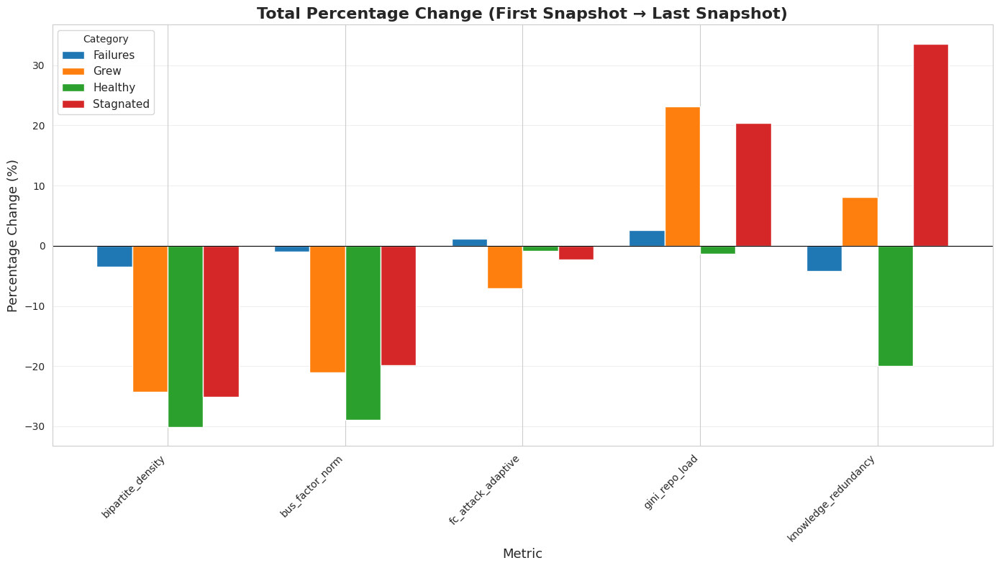

  Saved: results_cache/total_change_heatmap.png


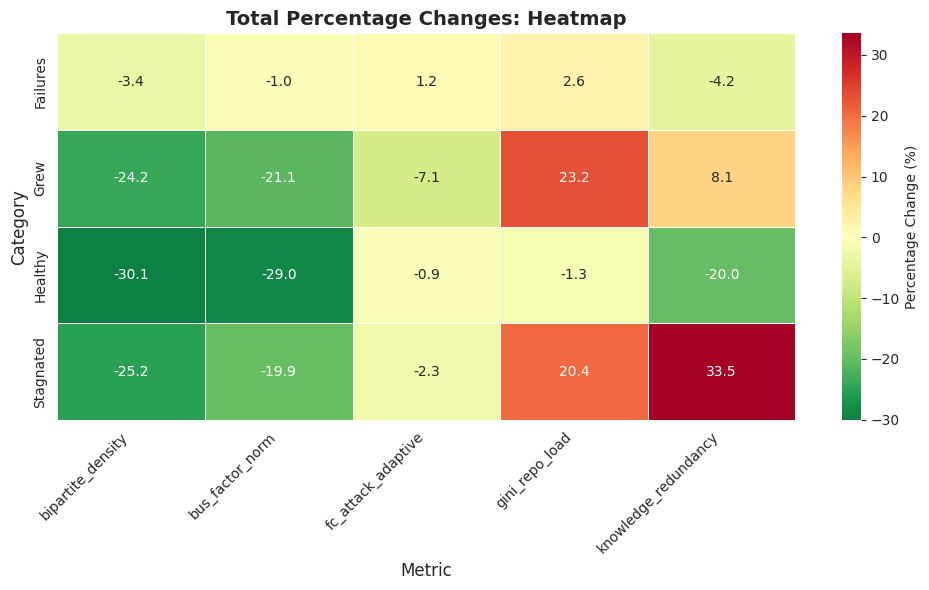

  Saved: results_cache/total_change_bar_key_metrics.png


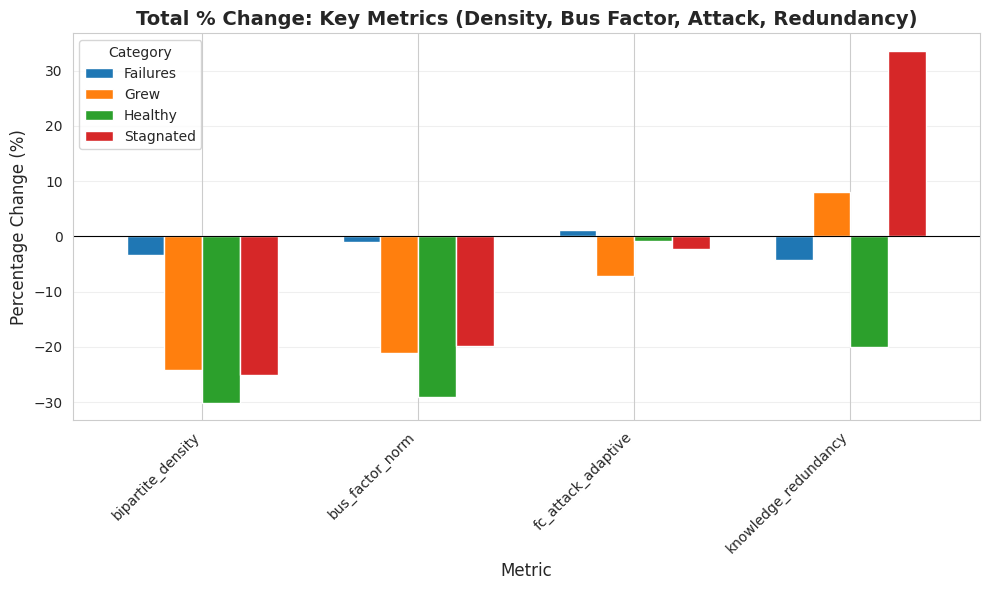


✅ COMPLETE!


In [ ]:
# ===============================================================
# COMPREHENSIVE CHANGE ANALYSIS: INCREMENTAL vs TOTAL
# ===============================================================

import pandas as pd
import numpy as np

def analyze_total_vs_incremental_changes(traj_file):
    """
    Compare two types of change:
    1. Incremental: snapshot-to-snapshot absolute changes (what plots show)
    2. Total: first-to-last percentage change (what -39% refers to)
    """

    df = pd.read_csv(traj_file)

    metrics = [c for c in df.columns if c not in ["Category", "Snapshot"]]
    categories = df["Category"].unique()

    print("="*100)
    print("TWO TYPES OF CHANGE ANALYSIS")
    print("="*100)

    # ============================================================
    # TYPE 1: TOTAL CHANGE (First → Last)
    # ============================================================

    print("\n" + "="*100)
    print("TYPE 1: TOTAL CHANGE FROM FIRST TO LAST SNAPSHOT")
    print("="*100)
    print("(This is what the -39% density, -23% bus_factor refers to)")
    print()

    total_changes = []

    for cat in categories:
        cat_df = df[df["Category"] == cat].sort_values("Snapshot")

        first_snap = cat_df[cat_df["Snapshot"] == cat_df["Snapshot"].min()]
        last_snap = cat_df[cat_df["Snapshot"] == cat_df["Snapshot"].max()]

        print(f"\n{cat.upper()}")
        print("-"*100)
        print(f"{'Metric':<25} {'First':>10} {'Last':>10} {'Abs Δ':>12} {'% Change':>12} {'Direction':>10}")
        print("-"*100)

        for metric in metrics:
            first_val = first_snap[metric].iloc[0]
            last_val = last_snap[metric].iloc[0]

            abs_change = last_val - first_val
            pct_change = (abs_change / first_val * 100) if first_val != 0 else 0

            direction = "↑" if abs_change > 0 else "↓" if abs_change < 0 else "→"

            print(f"{metric:<25} {first_val:>10.4f} {last_val:>10.4f} {abs_change:>+12.4f} "
                  f"{pct_change:>+11.1f}% {direction:>10}")

            total_changes.append({
                "Category": cat,
                "Metric": metric,
                "First_Value": first_val,
                "Last_Value": last_val,
                "Absolute_Change": abs_change,
                "Percent_Change": pct_change
            })

    total_df = pd.DataFrame(total_changes)

    # ============================================================
    # TYPE 2: INCREMENTAL CHANGES (Snapshot-to-Snapshot)
    # ============================================================

    print("\n\n" + "="*100)
    print("TYPE 2: MEAN INCREMENTAL CHANGE (SNAPSHOT-TO-SNAPSHOT)")
    print("="*100)
    print("(This is what the plots show - average |Δ| between consecutive snapshots)")
    print()

    incremental_changes = []

    for cat in categories:
        cat_df = df[df["Category"] == cat].sort_values("Snapshot")

        for metric in metrics:
            values = cat_df[metric].values

            # Calculate all consecutive changes
            changes = []
            for i in range(1, len(values)):
                changes.append(abs(values[i] - values[i-1]))

            mean_change = np.mean(changes)
            std_change = np.std(changes)

            incremental_changes.append({
                "Category": cat,
                "Metric": metric,
                "Mean_Incremental_Change": mean_change,
                "Std_Incremental_Change": std_change
            })

    incremental_df = pd.DataFrame(incremental_changes)

    for cat in categories:
        print(f"\n{cat.upper()}")
        print("-"*100)
        cat_inc = incremental_df[incremental_df["Category"] == cat]
        print(cat_inc.to_string(index=False))

    # ============================================================
    # COMPARISON TABLE
    # ============================================================

    print("\n\n" + "="*100)
    print("COMPARISON: TOTAL vs MEAN INCREMENTAL CHANGES")
    print("="*100)

    # Merge the two dataframes
    comparison = total_df.merge(
        incremental_df,
        on=["Category", "Metric"]
    )

    for cat in categories:
        print(f"\n{cat.upper()}")
        print("-"*100)
        print(f"{'Metric':<25} {'Total % Δ':>12} {'Mean |Δ|/snap':>18} {'Ratio':>10}")
        print("-"*100)

        cat_comp = comparison[comparison["Category"] == cat]

        for _, row in cat_comp.iterrows():
            ratio = abs(row['Percent_Change']) / (row['Mean_Incremental_Change'] * 100) if row['Mean_Incremental_Change'] != 0 else np.inf

            print(f"{row['Metric']:<25} {row['Percent_Change']:>+11.1f}% "
                  f"{row['Mean_Incremental_Change']:>17.6f} {ratio:>10.1f}x")

    # ============================================================
    # KEY INSIGHTS
    # ============================================================

    print("\n\n" + "="*100)
    print("KEY INSIGHTS")
    print("="*100)

    print("""
WHY THE PLOTS LOOK DIFFERENT FROM THE -39% NUMBER:

1. PLOTS SHOW: Mean absolute change per snapshot
   - Example for Grew density: ~0.007 per snapshot
   - This is the AVERAGE size of each jump up or down

2. THE -39% SHOWS: Total cumulative change
   - Grew density: 0.359 (first) → 0.219 (last) = -0.140 absolute = -39%
   - This is the NET EFFECT of all those jumps

3. WHY THEY'RE DIFFERENT:
   - Small incremental changes (0.007) accumulate over 8 transitions
   - 0.007 × 8 ≈ 0.056 if all in same direction
   - But actual total change is -0.140 (much larger!)
   - This means changes are CONSISTENT in same direction (downward)

4. WHAT THIS TELLS US:
   - Grew: Small incremental changes (0.007) but CONSISTENT direction → -39%
   - Failures: Even smaller changes (0.001) and NO consistency → -21%

   High volatility isn't just about SIZE of changes,
   it's about PERSISTENCE and DIRECTION of changes!
    """)

    # ============================================================
    # VISUALIZATION RECOMMENDATION
    # ============================================================

    print("\n" + "="*100)
    print("RECOMMENDATION FOR YOUR THESIS")
    print("="*100)

    print("""
To show BOTH perspectives clearly:

Figure A: "Raw Trajectories" (already have)
  → Shows the actual path from first to last
  → Readers can SEE the -39% decline

Figure B: "Incremental Changes" (already have)
  → Shows volatility/variability snapshot-to-snapshot
  → Shows that Grew has LARGER and MORE CONSISTENT changes

Figure C: "Total Change Summary" (ADD THIS)
  → Bar chart showing % change from first→last
  → Side-by-side bars for each category
  → This directly shows the -39%, -23%, etc.

Table: "Change Decomposition" (ADD THIS)
  → Shows both total % change AND mean incremental change
  → Makes it clear that Grew has:
    * Large total change (-39%)
    * Large incremental changes (0.007)
    * High consistency (changes accumulate in same direction)
    """)

    # Save outputs
    total_df.to_csv("results_cache/total_changes_first_to_last.csv", index=False)
    incremental_df.to_csv("results_cache/incremental_changes_mean.csv", index=False)
    comparison.to_csv("results_cache/comparison_total_vs_incremental.csv", index=False)

    print("\n💾 Saved:")
    print("  - results_cache/total_changes_first_to_last.csv")
    print("  - results_cache/incremental_changes_mean.csv")
    print("  - results_cache/comparison_total_vs_incremental.csv")

    return total_df, incremental_df, comparison


# ============================================================
# CREATE VISUALIZATION OF TOTAL CHANGES
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

def plot_total_percentage_changes(total_df, out_prefix="results_cache/total_change"):
    """
    Create bar charts showing total percentage change from first to last.
    """

    print("\n" + "="*100)
    print("CREATING TOTAL PERCENTAGE CHANGE VISUALIZATIONS")
    print("="*100)

    # Pivot for plotting
    pivot = total_df.pivot(index="Metric", columns="Category", values="Percent_Change")

    # Plot 1: All metrics
    fig, ax = plt.subplots(figsize=(14, 8))
    pivot.plot(kind='bar', ax=ax, width=0.8)
    ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
    ax.set_title("Total Percentage Change (First Snapshot → Last Snapshot)",
                 fontsize=16, fontweight='bold')
    ax.set_xlabel("Metric", fontsize=13)
    ax.set_ylabel("Percentage Change (%)", fontsize=13)
    ax.legend(title="Category", fontsize=11)
    ax.grid(True, alpha=0.3, axis='y')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    outpath = f"{out_prefix}_bar_all_metrics.png"
    plt.savefig(outpath, dpi=200, bbox_inches='tight')
    print(f"  Saved: {outpath}")
    plt.show()

    # Plot 2: Heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        pivot.T,
        annot=True,
        fmt='.1f',
        cmap='RdYlGn_r',  # Red for negative (decline), green for positive
        center=0,
        cbar_kws={'label': 'Percentage Change (%)'},
        linewidths=0.5
    )
    plt.title("Total Percentage Changes: Heatmap", fontsize=14, fontweight='bold')
    plt.xlabel("Metric", fontsize=12)
    plt.ylabel("Category", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    heatmap_path = f"{out_prefix}_heatmap.png"
    plt.savefig(heatmap_path, dpi=200, bbox_inches='tight')
    print(f"  Saved: {heatmap_path}")
    plt.show()

    # Plot 3: Focus on key metrics (density, bus_factor)
    key_metrics = ['bipartite_density', 'bus_factor_norm', 'fc_attack_adaptive',
                   'knowledge_redundancy']

    key_df = total_df[total_df['Metric'].isin(key_metrics)]
    pivot_key = key_df.pivot(index="Metric", columns="Category", values="Percent_Change")

    fig, ax = plt.subplots(figsize=(10, 6))
    pivot_key.plot(kind='bar', ax=ax, width=0.7)
    ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
    ax.set_title("Total % Change: Key Metrics (Density, Bus Factor, Attack, Redundancy)",
                 fontsize=14, fontweight='bold')
    ax.set_xlabel("Metric", fontsize=12)
    ax.set_ylabel("Percentage Change (%)", fontsize=12)
    ax.legend(title="Category", fontsize=10)
    ax.grid(True, alpha=0.3, axis='y')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    key_path = f"{out_prefix}_bar_key_metrics.png"
    plt.savefig(key_path, dpi=200, bbox_inches='tight')
    print(f"  Saved: {key_path}")
    plt.show()


# ============================================================
# RUN EVERYTHING
# ============================================================

if __name__ == "__main__":
    # Analyze changes
    total_df, incremental_df, comparison = analyze_total_vs_incremental_changes(
        "results_cache/category_metric_trajectories.csv"
    )

    # Create visualizations
    plot_total_percentage_changes(total_df)

    print("\n" + "="*100)
    print("✅ COMPLETE!")
    print("="*100)

In [ ]:
# ===============================================================
# PROJECT-LEVEL METRIC PLOTS (SHOW + SAVE)
# ===============================================================

def plot_project_metrics_show(project_traj_file, out_prefix="results_cache/project_metric_plot"):
    df = pd.read_csv(project_traj_file)

    metrics = [c for c in df.columns if c not in ["Project","Snapshot"]]
    projects = df["Project"].unique()

    for metric in metrics:
        plt.figure(figsize=(10,6))

        for p in projects:
            sub = df[df["Project"] == p]
            plt.plot(
                sub["Snapshot"],
                sub[metric],
                linewidth=1,
                alpha=0.4
            )

        plt.title(f"{metric} — Project Trajectories", fontsize=15)
        plt.xlabel("Snapshot")
        plt.ylabel(metric)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()

        outpath = f"{out_prefix}_{metric}.png"
        plt.savefig(outpath, dpi=200)
        print("Saved:", outpath)

        plt.show()   # <<< SHOW PLOT INLINE


In [ ]:
plot_project_metrics_show("results_cache/project_metric_trajectories.csv")


In [ ]:
# ===============================================================
# GRID OF ALL CATEGORY METRIC PLOTS (SHOW + SAVE)
# ===============================================================

def plot_metric_grid_show(traj_file, out_png="results_cache/category_metric_grid.png"):
    df = pd.read_csv(traj_file)
    metrics = [c for c in df.columns if c not in ["Category","Snapshot"]]

    n = len(metrics)
    cols = 3
    rows = int(np.ceil(n / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    axes = axes.flatten()

    for i, metric in enumerate(metrics):
        ax = axes[i]
        for cat in df["Category"].unique():
            sub = df[df["Category"] == cat]
            ax.plot(
                sub["Snapshot"],
                sub[metric],
                marker="o",
                linewidth=2,
                label=cat
            )
        ax.set_title(metric)
        ax.grid(True, alpha=0.3)
        ax.legend()

    # hide leftover cells
    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    print("Saved:", out_png)

    plt.show()   # <<< SHOW ENTIRE GRID INLINE


Saved: results_cache/category_metric_grid.png


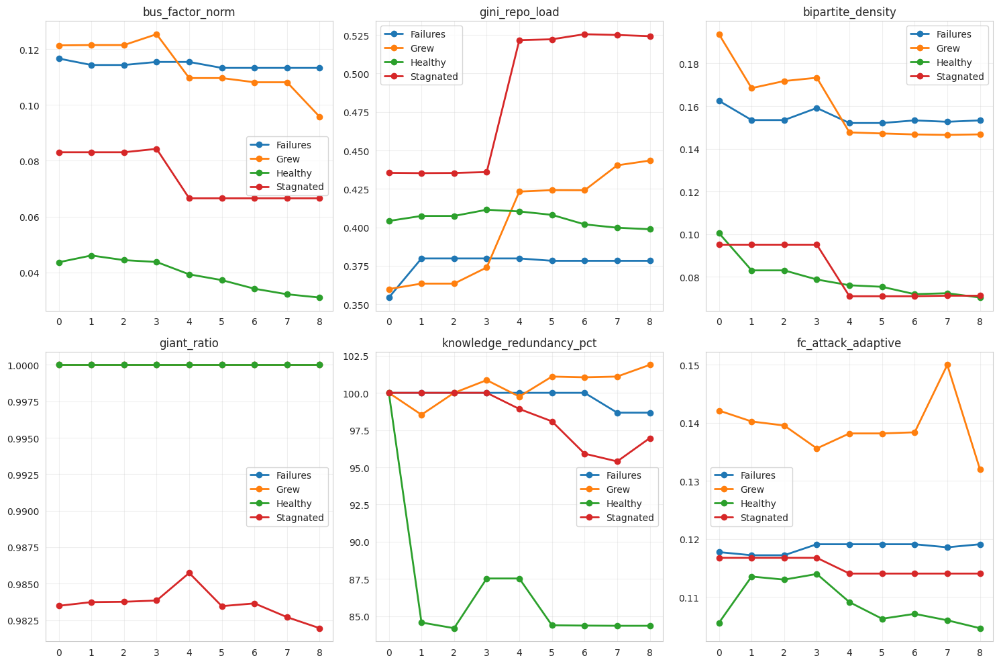

In [ ]:
plot_metric_grid_show("results_cache/category_metric_trajectories.csv")


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np

def plot_var_trend_heatmaps(trend_file, out_png_prefix="results_cache/var_trend_heatmap", normalize=True):
    df = pd.read_csv(trend_file)

    categories = df["category"].unique()

    for cat in categories:
        sub = df[df["category"] == cat].copy()

        # Pivot to matrix
        M = sub.pivot(index="outcome", columns="predictor", values="slope")

        # Normalize for visualization
        if normalize:
            # Flatten → zscore → reshape to matrix again
            values = M.values.flatten().reshape(-1, 1)
            scaler = StandardScaler()
            norm_values = scaler.fit_transform(values).reshape(M.shape)

            M_norm = pd.DataFrame(norm_values, index=M.index, columns=M.columns)
            plot_matrix = M_norm
            label = "Normalized Trend (Z-score)"
        else:
            plot_matrix = M
            label = "Trend (slope over time)"

        # Plot
        plt.figure(figsize=(8,6))
        sns.heatmap(
            plot_matrix,
            annot=True,
            fmt=".2f",
            cmap="coolwarm",
            center=0,
            linewidths=0.4,
            cbar_kws={"label": label}
        )
        plt.title(f"VAR Coefficient Time Trends — {cat}")
        plt.tight_layout()

        outpath = f"{out_png_prefix}_{cat}.png"
        plt.savefig(outpath, dpi=200)
        plt.close()

        print("Saved:", outpath)


In [ ]:
plot_var_trend_heatmaps("results_cache/var_autoregressive_trends.csv")


Saved: results_cache/var_trend_heatmap_Grew.png
Saved: results_cache/var_trend_heatmap_Healthy.png
Saved: results_cache/var_trend_heatmap_Stagnated.png


In [ ]:
print(df.columns)
print(df.head(5))
print(len(df))


In [ ]:
# ===============================================================
# 🚨 FULL RESET — CLEAN RESULTS CACHE
# ===============================================================
import shutil, os

CACHE_DIR = "results_cache"

if os.path.exists(CACHE_DIR):
    shutil.rmtree(CACHE_DIR)
    print(f"🧹 Deleted existing '{CACHE_DIR}' directory and all its contents.")

os.makedirs(CACHE_DIR, exist_ok=True)
print(f"✅ Recreated empty '{CACHE_DIR}' folder — ready for fresh analysis.")


✅ Recreated empty 'results_cache' folder — ready for fresh analysis.


Had an issue with duplicates in the csv (I got lazy and wrote to a single static file rather than in-memory dataframes)

This block stores our keys for the duckdb bucket

In [ ]:
import duckdb, os

con = duckdb.connect()

# First install, then load
con.execute("INSTALL httpfs;")
con.execute("LOAD httpfs;")

con.execute("INSTALL iceberg;")
con.execute("LOAD iceberg;")


imports

In [ ]:
ak = os.getenv("GCS_ACCESS_KEY_ID")
sk = os.getenv("GCS_SECRET_ACCESS_KEY")

con.execute("SET s3_access_key_id = ?;", [ak])
con.execute("SET s3_secret_access_key = ?;", [sk])
con.execute("SET s3_endpoint = 'storage.googleapis.com';")
con.execute("SET s3_url_style = 'path';")
con.execute("SET s3_use_ssl = true;")
con.execute("SET s3_region = 'auto';")

TABLE = "gs://bl-dataproc-resources/warehouse/public_research/contributor_repo_commits_v2"

# sanity check
print(con.execute(f"SELECT COUNT(*) FROM iceberg_scan('{TABLE}');").fetchdf())


   count_star()
0       1593536


In [ ]:
# ===============================================================
# CONFIG
# ===============================================================
import duckdb, pandas as pd, numpy as np, os
from datetime import datetime

COMMITS = "gs://bl-dataproc-resources/warehouse/public_research/contributor_repo_commits_v2"
CONTRIB = "gs://bl-dataproc-resources/warehouse/public_research/contributors"

# ===============================================================
# VERIFIED GITHUB ORG MAP
# ===============================================================
ORG_MAP = {
    "Ethereum": ["ethereum", "ethereumbook", "FuelLabs"],
    "Uniswap": ["Uniswap", "uniswapfoundation"],
    "Spark": ["sparkdotfi"],
    "ChainLink": ["smartcontractkit", "chainlink"],
    "Lido": ["lidofinance"],
    "Ronin": ["Moralisweb3","axieinfinity","roninbuilders","ronin-chain","CliqueOfficial"],
    "Aave": ["aave", "bgdlabs"],
    "Balancer": ["balancer"],
    "Symbiotic": ["symbioticfi"],
    "Compound": ["compound-finance"],
    "Curve": ["curvefi"],
    "Sushi Swap": ["sushi-labs", "sushiswap"],
    "Origin Protocol": ["OriginProtocol"],
    "Centrifuge": ["centrifuge"],
    "Rocket Pool": ["rocket-pool"],
    "Gnosis Chain": ["pooltogether", "gnosis", "gnosisbuild", "gnosischain"],
    "dYdX": ["dydxprotocol", "dydxfoundation", "tracyspacy"],
    "Obol": ["Obolnetwork"],
    "Stakewise": ["stakewise"],
    "Morpho": ["morpho-org"],
    "Maple": ["maple-labs"],
    "Bancor": ["bancorprotocol"],
    "DAO Maker": ["daomaker"],
    "Gearbox Protocol": ["Gearbox-protocol"],
    "InstaDApp": ["Instadapp"],
    "YAM Finance AND YAM v3": ["yam-finance"],
    "Reserve": ["reserve-protocol"],
    "Venus": ["VenusProtocol"],
    "EigenLayer": ["Layr-Labs","ether-fi","Othentic-Labs","EspressoSystems","EtherScaleApps", "eigenlayer"],
    "Beanstalk": ["BeanstalkFarms"],
    "PancakeSwap": ["PancakeSwap","pancakeswap","pancake","pancake-frontend","pancake-swap-interface-v1","pancake-farm","pancake-toolkit","pancake-swap-core","pancake-smart-contracts","pancake-swap-sdk","pancake-swap-periphery","pancake-subgraph","pancake-info-api","pancake-uikit","pancake-swap-lib","pancake-v3-contracts","pancake-v2-subgraph","pancake-x-contracts","pancake-nft-api","pancake-nft-publish","pancake-lottery-scheduler","pancake-create3-factory","pancake-document","pancake-developer","pancake-profile-api","pancake-info-v1","pancake-lottery-contract","pancake-smart-router-example","pancake-subgraphs","pancake-universal-router","pancake-permit2","infinity-core","infinity-periphery","infinity-hooks","infinity-hooks-template","snapshot","snapshot.js","snapshot-spaces","swap-orders-lib","eslint-config-pancake","eslint-plugin-address","token-pocket-splash","pancake-api","PancakeSwap-Design","Revelation-Hackathon-Bounties","syrup-pool-data-api","airdrop-v3-users","trading-strategy","pancakeswap-quickstats"],
    "Deus Finance": ["deusfinance"],
    "Nomad": ["nomad-xyz"],
    "Pendle": ["pendle-finance"],
    "Tornado Cash2 AND Tornado Cash": ["tornadocash"],
    "Rari Capital": ["Rari-Capital"],
    "Akropolis": ["kaonone"],
    "Pickle Finance": ["pickle-finance"],
    "Saddle": ["saddle","saddle-finance"],
    "Stader Labs": ["stader-labs"],
    "Nexus Mutual": ["NexusMutual"],
    "Zerion": ["zeriontech"],
    "Enigma": ["scrtlabs"],
    "xToken": ["xtokenmarket"],
    "Revest Finance": ["Revest-Finance"],
    "Fei Protocol": ["fei-protocol","checkthechain"],
    "Tokemak": ["tokamak-network"],
    "Harvest Finance": ["harvestfi","harvest-finance"],
    "Indexed Finance": ["indexed-finance"],
    "Aura Finance": ["aurafinance"],
    "Wonderland Finance": ["defi-wonderland", "wonderland"],
    "Horizon Protocol": ["Horizon-Protocol"],
    "Furucombo": ["dinngo"],
    "Siren": ["sirenmarkets"],
    "Silo Finance": ["silo-finance"],
    "Frax": ["Frax","FraxFinance","frax-finance","frax","frax-solidity","frax-oft-upgradeable","fraxtal-contracts","fraxtal-node","frax-template","fraxtal","fraxlend","frax-standard-solidity","frxETH-public","fraxfinance.github.io","fraxtal-lz-hop","frax-oft-legacy-recovery","dev-fraxswap","frax-langs","frax-governance","fraxswap-subgraph","fraxlend-audit","frax-vefpis","fraxtal-op-reth","uni-v3-manipulation-simulator","merkle-airdrop-starter","frax-oracles","frxETH-v2-public","chaindata","public-frax-bamm","frax-tron","paraswap-dex-lib","frax-eigenlayer-operator","frax-bonds","protocol-v2","snapshot-strategies","snapshot-spaces","frax-ether-redemption-queue","ens-contracts-fraxtal","aave-asset-listing","fraxtal-usdc","fraxtal-da-follower","fns-subgraph","contract-metadata","fraxtal-op-geth"],
    "Revert Finance": ["revert-finance"],
    "Liquid Collective": ["liquid-collective"],
    "ValueDeFi AND Value DeFi AND ValueDeFi Protocol": ["valuedefi"],
    "Zircuit": ["zircuit-labs","zerolend"],
    "Acala": ["AcalaNetwork","UniqueNetwork","SetheumLabs","crustio","nutsfinance"],
    "Popsicle Finance": ["Popsicle-Finance"],
    "Popcorn DAO": ["Popcorn-Limited"],
    "pNetwork": ["provable-things"],
    "Enso Finance": ["EnsoBuild"],
    "Warp Finance": ["warpfinance","warp-contracts"],
    "Badger DAO": ["Badger-Finance"],
    "Ondo Finance": ["ondoprotocol", "Ondo", "ondo-finance"],
    "Cream Finance": ["CreamFi", "cream-finance"],
    "Iron Finance": ["IronFinance","iron-finance","iron-frontend-v1","iron-polygon-contracts","iron-contracts","iron-vaults","dragonball-contracts","iron-swap","iron-core-v2","tid-lottery-ui","tid-lottery-contracts","iron-lend","diamondhand-contracts","diamondhand-frontend","snapshot-spaces"],
    "Idle Finance": ["bugduino","Idle-Labs"],
    "Mimo Defi": ["mimoprotocol"],
    "Opium Network": ["OpiumProtocol"],
    "Element Finance": ["delvtech","element-foundation"],
    "Summer.fi": ["OasisDEX"],
    "Euler Finance": ["euler-xyz"],
    "yearn.finance": ["yearn"],
    "ether.fi": ["etherfi-protocol"],
    "M0 Labs": ["m0-foundation"],
    "bZx Protocol": ["OokiTrade","bZxNetwork","tomcbean"],
    "Strudel Finance": ["strudel-finance"],
    "Dego Finance": ["dego-labs"],
    "Snowball Finance": ["Snowball-Finance"],
    "Pulsar Finance": ["PulsarDefi", "PulsarSwap"],
    "Panoptic": ["panoptic-labs"],
    "Arbitrum": ["D8-X", "OffchainLabs"],
    "Optimism": ["ethereum-optimism", "ourzora"],
    "ZkSync": ["matter-labs", "sismo-core"],
    "Yapeswap": ["yapeswap"],
    "CompliFi": ["CompliFi"],
    "Bamboo DeFi": ["bamboo-defi"],
    "InsurAce": ["InsurAce-Protocol"],
    "Kei Finance": ["KEI-finance"],
    "Ora": ["ora-io"],
    "Router Protocol": ["router-protocol"],
    "StoneDeFi": ["stonedefi"],
    "BoringDAO": ["BoringDAO"],
}


# ===============================================================
# QUERY FUNCTION
# ===============================================================
def query_project_by_url(project, orgs, limit=2_000_000, sample_size=50_000):
    print("\n" + "="*100)
    print(f"🔎 PROJECT: {project}")
    print("="*100)

    if not orgs:
        print(f"⚠️ No orgs found for {project}. Skipping.")
        return pd.DataFrame()

    # Build case-insensitive URL match
    owner_conditions = [
        f"LOWER(c.repo) LIKE '%github.com/{o.lower()}/%'" for o in orgs
    ]
    where_clause = " OR ".join(owner_conditions)

    q = f"""
        WITH commits AS (
            SELECT
                c.repo,
                c.contributor_unique_id_builder_love,
                SUM(c.contributor_contributions) AS commits
            FROM iceberg_scan('{COMMITS}') AS c
            WHERE ({where_clause})
              AND c.is_fork = FALSE
            GROUP BY c.repo, c.contributor_unique_id_builder_love
            LIMIT {limit}
        )
        SELECT
            cm.repo,
            cm.contributor_unique_id_builder_love,
            cm.commits,
            h.weighted_score,
            h.quartile_bucket
        FROM commits AS cm
        LEFT JOIN iceberg_scan('{CONTRIB}') AS h
        ON cm.contributor_unique_id_builder_love = h.contributor_unique_id_builder_love
    """

    try:
        df = con.sql(q).df()
    except Exception as e:
        print(f"❌ Query failed for {project}: {e}")
        return pd.DataFrame()

    n = len(df)
    if n == 0:
        print(f"⚠️ No rows found for {project}")
        return pd.DataFrame()

    if n > sample_size:
        df = df.sample(n=sample_size, random_state=42)
        print(f"⚙️ Sampled {len(df):,} rows for {project} (from {n:,})")
    else:
        print(f"✅ Retrieved {n:,} rows for {project}")

    print(f"📦 Unique repos: {df['repo'].nunique()}")
    print("-"*100)

    return df.assign(project=project)

# ===============================================================
# RUN ALL PROJECTS
# ===============================================================
def run_all_projects():
    results = []
    for project, orgs in ORG_MAP.items():
        try:
            df = query_project_by_url(project, orgs)
            if not df.empty:
                results.append(df)
        except Exception as e:
            print(f"❌ Failed for {project}: {e}")

    if not results:
        print("⚠️ No data found for any project.")
        return pd.DataFrame()

    out = pd.concat(results, ignore_index=True)
    os.makedirs("results_cache", exist_ok=True)
    out_path = f"results_cache/all_data_by_url_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    out.to_csv(out_path, index=False)
    print(f"\n✅ Saved combined results to {out_path}")
    print(f"📊 Total rows: {len(out):,} | Projects covered: {out['project'].nunique()}")
    return out

# Run it
all_data = run_all_projects()



🔎 PROJECT: Ethereum
✅ Retrieved 9,823 rows for Ethereum
📦 Unique repos: 404
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Uniswap
✅ Retrieved 1,836 rows for Uniswap
📦 Unique repos: 121
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Spark
✅ Retrieved 136 rows for Spark
📦 Unique repos: 27
----------------------------------------------------------------------------------------------------

🔎 PROJECT: ChainLink
✅ Retrieved 2,644 rows for ChainLink
📦 Unique repos: 227
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Lido
✅ Retrieved 1,614 rows for Lido
📦 Unique repos: 164
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Ronin
✅ Retrieved 1,996 rows for Ronin
📦 Unique repos: 152
--------------------------------------------------------

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

✅ Retrieved 2,536 rows for EigenLayer
📦 Unique repos: 151
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Beanstalk
✅ Retrieved 174 rows for Beanstalk
📦 Unique repos: 38
----------------------------------------------------------------------------------------------------

🔎 PROJECT: PancakeSwap


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

✅ Retrieved 12 rows for PancakeSwap
📦 Unique repos: 2
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Deus Finance
✅ Retrieved 174 rows for Deus Finance
📦 Unique repos: 48
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Nomad
✅ Retrieved 87 rows for Nomad
📦 Unique repos: 15
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Pendle
✅ Retrieved 146 rows for Pendle
📦 Unique repos: 27
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Tornado Cash2 AND Tornado Cash
✅ Retrieved 131 rows for Tornado Cash2 AND Tornado Cash
📦 Unique repos: 38
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Rari Capital
✅ Retrieved 136 rows for Rari Capital
📦 Unique repos: 50
----------------------

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

✅ Retrieved 18 rows for Frax
📦 Unique repos: 3
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Revert Finance
✅ Retrieved 24 rows for Revert Finance
📦 Unique repos: 14
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Liquid Collective
✅ Retrieved 22 rows for Liquid Collective
📦 Unique repos: 5
----------------------------------------------------------------------------------------------------

🔎 PROJECT: ValueDeFi AND Value DeFi AND ValueDeFi Protocol
✅ Retrieved 24 rows for ValueDeFi AND Value DeFi AND ValueDeFi Protocol
📦 Unique repos: 8
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Zircuit
✅ Retrieved 88 rows for Zircuit
📦 Unique repos: 36
----------------------------------------------------------------------------------------------------

🔎 PROJECT: Acala
✅ Retrieved 513 rows for Acala
📦 U

In [ ]:
def detect_duplicates(org_map):
    print("🔍 Running duplicate detection...")  # sanity check print

    seen = {}
    global_dupes = {}
    intra_dupes = {}

    for project, aliases in org_map.items():
        unique_aliases = set()
        intra_project_dupes = set()
        for alias in aliases:
            alias_lower = alias.lower()
            if alias_lower in unique_aliases:
                intra_project_dupes.add(alias)
            unique_aliases.add(alias_lower)

            if alias_lower in seen:
                global_dupes.setdefault(alias_lower, set()).update([project, seen[alias_lower]])
            else:
                seen[alias_lower] = project

        if intra_project_dupes:
            intra_dupes[project] = sorted(intra_project_dupes)

    print("\n=== 🔁 DUPLICATE ALIASES ACROSS PROJECTS ===")
    if global_dupes:
        for alias, projects in sorted(global_dupes.items()):
            print(f"{alias}: {', '.join(sorted(projects))}")
    else:
        print("✅ No duplicates found across projects.")

    print("\n=== 🔂 DUPLICATE ALIASES WITHIN PROJECTS ===")
    if intra_dupes:
        for project, dupes in intra_dupes.items():
            print(f"{project}: {', '.join(dupes)}")
    else:
        print("✅ No intra-project duplicates found.")

    return global_dupes, intra_dupes


This block pulls the repos per project based on aliases I found by hand on the builder.love website. Searching based on keyword aliases are thus robust because of this meticulous curation method.

In [ ]:
# ===============================================================
# ✅ COMPLETE HEALTHY / FAILED DICTS (cover every ORG_MAP key)
# ===============================================================

HEALTHY_PROJECTS = {
    "Ethereum": ["ethereum", "ethereumbook", "FuelLabs"],
    "Uniswap": ["Uniswap", "uniswapfoundation"],
    "Spark": ["sparkdotfi"],
    "ChainLink": ["smartcontractkit", "chainlink"],
    "Lido": ["lidofinance"],
    "Aave": ["aave", "bgdlabs"],
    "Balancer": ["balancer"],
    "Symbiotic": ["symbioticfi"],
    "Compound": ["compound-finance"],
    "Curve": ["curvefi"],
    "Sushi Swap": ["sushi-labs", "sushiswap"],
    "Origin Protocol": ["OriginProtocol"],
    "Centrifuge": ["centrifuge"],
    "Rocket Pool": ["rocket-pool"],
    "Gnosis Chain": ["pooltogether", "gnosis", "gnosisbuild", "gnosischain"],
    "dYdX": ["dydxprotocol", "dydxfoundation", "tracyspacy"],
    "Obol": ["Obolnetwork"],
    "Stakewise": ["stakewise"],
    "Morpho": ["morpho-org"],
    "Maple": ["maple-labs"],
    "EigenLayer": ["Layr-Labs","ether-fi","Othentic-Labs","EspressoSystems","EtherScaleApps","eigenlayer"],
    "Stader Labs": ["stader-labs"],
    "Nexus Mutual": ["NexusMutual"],
    "Zerion": ["zeriontech"],
    "Tokemak": ["tokamak-network"],
    "Aura Finance": ["aurafinance"],
    "Ondo Finance": ["ondoprotocol","Ondo","ondo-finance"],
    "Silo Finance": ["silo-finance"],
    "Enso Finance": ["EnsoBuild"],
    "Revert Finance": ["revert-finance"],
    "Liquid Collective": ["liquid-collective"],
    "Idle Finance": ["bugduino","Idle-Labs"],
    "Mimo Defi": ["mimoprotocol"],
    "Element Finance": ["delvtech","element-foundation"],
    "Summer.fi": ["OasisDEX"],
    "Euler Finance": ["euler-xyz"],
    "ether.fi": ["etherfi-protocol"],
    "M0 Labs": ["m0-foundation"],
    "Zircuit": ["zircuit-labs","zerolend"],
    "Tornado Cash2 AND Tornado Cash": ["tornadocash"],
    "Reserve": ["reserve-protocol"],
    "Pendle": ["pendle-finance"],
    "Gearbox Protocol": ["Gearbox-protocol"],
    "Arbitrum": ["D8-X", "OffchainLabs"],
    # Big alias list preserved for PancakeSwap
    "PancakeSwap": [
        "PancakeSwap","pancakeswap","pancake","pancake-frontend","pancake-swap-interface-v1",
        "pancake-farm","pancake-toolkit","pancake-swap-core","pancake-smart-contracts",
        "pancake-swap-sdk","pancake-swap-periphery","pancake-subgraph","pancake-info-api",
        "pancake-uikit","pancake-swap-lib","pancake-v3-contracts","pancake-v2-subgraph",
        "pancake-x-contracts","pancake-nft-api","pancake-nft-publish","pancake-lottery-scheduler",
        "pancake-create3-factory","pancake-document","pancake-developer","pancake-profile-api",
        "pancake-info-v1","pancake-lottery-contract","pancake-smart-router-example",
        "pancake-subgraphs","pancake-universal-router","pancake-permit2","infinity-core",
        "infinity-periphery","infinity-hooks","infinity-hooks-template","snapshot",
        "snapshot.js","snapshot-spaces","swap-orders-lib","eslint-config-pancake",
        "eslint-plugin-address","token-pocket-splash","pancake-api","PancakeSwap-Design",
        "Revelation-Hackathon-Bounties","syrup-pool-data-api","airdrop-v3-users",
        "trading-strategy","pancakeswap-quickstats"
    ],
    # Big alias list preserved for Frax
    "Frax": [
        "Frax","FraxFinance","frax-finance","frax","frax-solidity","frax-oft-upgradeable",
        "fraxtal-contracts","fraxtal-node","frax-template","fraxtal","fraxlend",
        "frax-standard-solidity","frxETH-public","fraxfinance.github.io","fraxtal-lz-hop",
        "frax-oft-legacy-recovery","dev-fraxswap","frax-langs","frax-governance",
        "fraxswap-subgraph","fraxlend-audit","frax-vefpis","fraxtal-op-reth",
        "uni-v3-manipulation-simulator","merkle-airdrop-starter","frax-oracles",
        "frxETH-v2-public","LayerZero-v2-upgradeable","uniswap-interface","chaindata",
        "public-frax-bamm","frax-tron","frax-oft-solana","frax-oft-legacy",
        "paraswap-dex-lib","frax-eigenlayer-operator","frax-bonds","protocol-v2",
        "snapshot.js","snapshot-strategies","snapshot-spaces","frax-ether-redemption-queue",
        "avalanche-bridge-resources","ens-contracts-fraxtal","aave-asset-listing",
        "fraxtal-usdc","fraxtal-da-follower","fns-subgraph","contract-metadata","fraxtal-op-geth"
    ],
    "Panoptic": ["panoptic-labs"],
    "InstaDApp": ["Instadapp"],
    "Optimism": ["ethereum-optimism", "ourzora", ],
    "ZkSync": ["matter-labs", "sismo-core"]
}

FAILED_PROJECTS = {
    "Ronin": ["Moralisweb3","axieinfinity","roninbuilders","ronin-chain","CliqueOfficial"],
    "Bancor": ["bancorprotocol"],
    "DAO Maker": ["daomaker"],
    "YAM Finance AND YAM v3": ["yam-finance"],
    "Venus": ["VenusProtocol"],
    "Beanstalk": ["BeanstalkFarms"],
    "Fei Protocol": ["fei-protocol","checkthechain"],
    "Harvest Finance": ["harvestfi","harvest-finance"],
    "Indexed Finance": ["indexed-finance"],
    "Wonderland Finance": ["defi-wonderland","wonderland"],
    "Horizon Protocol": ["Horizon-Protocol"],
    "Furucombo": ["dinngo"],
    "Siren": ["sirenmarkets"],
    "Akropolis": ["kaonone"],
    "Saddle": ["saddle","saddle-finance"],
    "Pickle Finance": ["pickle-finance"],
    "Badger DAO": ["Badger-Finance"],
    "Popsicle Finance": ["Popsicle-Finance"],
    "ValueDeFi AND Value DeFi AND ValueDeFi Protocol": ["valuedefi"],
    "pNetwork": ["provable-things"],
    "Warp Finance": ["warpfinance","warp-contracts"],
    "Cream Finance": ["CreamFi","cream-finance"],
    "Iron Finance": [
        "IronFinance","iron-finance","iron-frontend-v1","iron-polygon-contracts",
        "iron-contracts","iron-vaults","dragonball-contracts","iron-swap",
        "iron-core-v2","tid-lottery-ui","tid-lottery-contracts","iron-lend",
        "diamondhand-contracts","diamondhand-frontend","snapshot-spaces"
    ],
    "bZx Protocol": ["OokiTrade","bZxNetwork","tomcbean"],
    "ForceDAO": ["ForceDAO"],
    "Strudel Finance": ["strudel-finance"],
    "Manga": ["hono-protocol"],
    "Dego Finance": ["dego-labs"],
    "Snowball Finance": ["Snowball-Finance"],
    "Pulsar Finance": ["PulsarDefi","PulsarSwap"],
    "Acala": ["AcalaNetwork","UniqueNetwork","SetheumLabs","crustio","nutsfinance"],
    "Deus Finance": ["deusfinance"],
    "Nomad": ["nomad-xyz"],
    "Popcorn DAO": ["Popcorn-Limited"],
    "EOS": ["EOSIO","eos","eosio","AntelopeIO","eoscafe","GetScatter","alcorexchange","EdgeApp"],
    # 🔻 Missing earlier — added now:
    "Rari Capital": ["Rari-Capital"],
    "Enigma": ["scrtlabs"],
    "xToken": ["xtokenmarket"],
    "Revest Finance": ["Revest-Finance"],
    "Opium Network": ["OpiumProtocol"],
    "yearn.finance": ["yearn"],
        "Yapeswap": ["yapeswap"],
    "CompliFi": ["CompliFi"],
    "Bamboo DeFi": ["bamboo-defi"],
    "InsurAce": ["InsurAce-Protocol"],
    "Cortex": ["CortexFoundation"],
    "Kei Finance": ["KEI-finance"],
    "Streamflow Finance": ["StreamFlow-finance"],
    "Ora": ["ora-io"],
    "Router Protocol": ["router-protocol"],
    "StoneDeFi": ["stonedefi"],
    "BoringDAO": ["BoringDAO"],
    "Nord Finance": ["nordfinance"]
}

# ===============================================================
# 🏷️ Build lookup and label your saved CSV
# ===============================================================
import pandas as pd

in_path  = "results_cache/all_data_by_url_20251108_164957.csv"
out_path = "results_cache/all_data_nov8.csv"

df = pd.read_csv(in_path)

# Build alias → label and alias → canonical project maps
label_by_alias = {}
project_by_alias = {}

for proj, aliases in HEALTHY_PROJECTS.items():
    label_by_alias[proj.lower()] = "Healthy"
    project_by_alias[proj.lower()] = proj
    for a in aliases:
        label_by_alias[a.lower()] = "Healthy"
        project_by_alias[a.lower()] = proj

for proj, aliases in FAILED_PROJECTS.items():
    label_by_alias[proj.lower()] = "Failed"
    project_by_alias[proj.lower()] = proj
    for a in aliases:
        label_by_alias[a.lower()] = "Failed"
        project_by_alias[a.lower()] = proj

def _norm(s): return str(s or "").lower()

def match_label(repo_str: str):
    r = _norm(repo_str)
    # fast exact owner/repo owner substring match by alias containment
    for alias, lab in label_by_alias.items():
        if alias in r:
            return lab
    return "Unknown"

def match_project(repo_str: str):
    r = _norm(repo_str)
    for alias, proj in project_by_alias.items():
        if alias in r:
            return proj
    return "Unknown"

# Expect a 'repo' column like 'github.com/owner/repo'
if "repo" not in df.columns:
    raise ValueError("Input CSV must contain a 'repo' column.")

df["project_status"] = df["repo"].apply(match_label)
df["project_name"]   = df["repo"].apply(match_project)

df.to_csv(out_path, index=False)
print(f"✅ Labeled file written: {out_path}")
print(df["project_status"].value_counts(dropna=False))
print("🕵️ Unknown sample:", df.loc[df["project_status"]=="Unknown", "repo"].head(10).tolist())


✅ Labeled file written: results_cache/all_data_nov8.csv
project_status
Healthy    52000
Failed      7480
Name: count, dtype: int64
🕵️ Unknown sample: []


This block searches for each project and its repos and separates them into our failed and healthy samples, creating a lookup table to do so. We can do this because I manually verified the health "status" of each project manually.

In [ ]:
# ===============================================================
# 🕸️ GRAPH ANALYSIS FROM LABELED CSV — ROBUST VERSION (SPLIT INTO TWO BLOCKS)
# ===============================================================
import networkx as nx, numpy as np, pandas as pd, itertools, gc, time, os
from datetime import datetime
from math import ceil
from networkx.algorithms import bipartite

# === CONFIG ===
CACHE_DIR = "results_cache"
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
os.makedirs(CACHE_DIR, exist_ok=True)

# === LOAD LABELED DATA ===
data_path = "/content/results_cache/all_data_nov8.csv"
df_all = pd.read_csv(data_path)
print(f"✅ Loaded {len(df_all):,} rows from {data_path}")

# ===============================================================
# 🔧 GRAPH UTILITIES (NO SAMPLING, WEIGHTED PROJECTIONS, BIP DENSITY)
# ===============================================================

DEV_PREFIX, REPO_PREFIX = "dev::", "repo::"

def build_bipartite_graph(df):
    G = nx.Graph()
    for _, r in df.iterrows():
        dev = f"{DEV_PREFIX}{r['contributor_unique_id_builder_love']}"
        repo = f"{REPO_PREFIX}{r['repo']}"
        w = float(r['commits']) if 'commits' in r and pd.notna(r['commits']) else 1.0
        G.add_edge(dev, repo, weight=w)
    return G

def get_bipartite_sets(G):
    U = {n for n in G if n.startswith(DEV_PREFIX)}
    V = {n for n in G if n.startswith(REPO_PREFIX)}
    return U, V

def project_dev_network_weighted(G):
    U, _ = get_bipartite_sets(G)
    return bipartite.weighted_projected_graph(G, U)

def project_repo_network_weighted(G):
    _, V = get_bipartite_sets(G)
    return bipartite.weighted_projected_graph(G, V)

def describe_graph(G, project, label):
    n, e = G.number_of_nodes(), G.number_of_edges()
    U, V = get_bipartite_sets(G)
    u, v = len(U), len(V)
    comps = list(nx.connected_components(G)) if n else []
    giant_ratio = (len(max(comps, key=len)) / n) if comps else 0.0
    density_simple = nx.density(G) if n > 1 else 0.0
    density_bip = (e / (u * v)) if (u > 0 and v > 0) else 0.0
    avg_degree = (2 * e / n) if n > 0 else 0.0
    return dict(
        project=project,
        health_label=label,
        nodes=n,
        edges=e,
        density=density_simple,
        bipartite_density=density_bip,
        components=len(comps),
        giant_ratio=giant_ratio,
        avg_degree=avg_degree,
        dev_count=u,
        repo_count=v
    )

def attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, return_curve=False):
    n0 = G.number_of_nodes()
    if n0 == 0:
        return (np.nan, pd.DataFrame(columns=["f","S"])) if return_curve else np.nan
    batch = max(1, ceil(step * n0))
    Gsub = G.copy()
    removed = 0
    curve = []
    while True:
        n_sub = Gsub.number_of_nodes()
        if n_sub == 0:
            S = 0.0
        else:
            comps = [len(c) for c in nx.connected_components(Gsub)]
            S = (max(comps) / n0) if comps else 0.0
        f = removed / n0
        curve.append((f, S))
        if S < crit_S or n_sub == 0:
            break
        k = min(batch, n_sub)
        if k <= 0:
            break
        deg_now = sorted(Gsub.degree(), key=lambda x: x[1], reverse=True)
        to_remove = [node for node, _ in deg_now[:k]]
        Gsub.remove_nodes_from(to_remove)
        removed += k
        if removed >= n0:
            comps = [len(c) for c in nx.connected_components(Gsub)] if Gsub.number_of_nodes() else []
            S_end = (max(comps) / n0) if comps else 0.0
            curve.append((min(1.0, removed / n0), S_end))
            break
    df_curve = pd.DataFrame(curve, columns=["f", "S"])
    fc = df_curve.loc[df_curve["S"] < crit_S, "f"].min() if (df_curve["S"] < crit_S).any() else np.nan
    return (fc, df_curve) if return_curve else fc

# ===============================================================
# 🚀 PER-PROJECT ANALYSIS — SPLIT INTO TWO BLOCKS
# ===============================================================
projects = sorted(df_all["project_name"].unique())
mid = len(projects) // 2
block1, block2 = projects[:mid], projects[mid:]

RUN_BLOCK = 1   # ← change to 2 for the second half
if RUN_BLOCK == 1:
    selected_projects = block1
    block_tag = "part1"
else:
    selected_projects = block2
    block_tag = "part2"

print(f"Processing {len(selected_projects)} projects in {block_tag}")

results = []

for project, df_proj in df_all[df_all["project_name"].isin(selected_projects)].groupby("project_name", sort=False):
    label = str(df_proj["project_status"].iloc[0])
    if label not in ["Healthy", "Failed"]:
        continue

    print(f"\n🔹 {project} ({label}) — {len(df_proj):,} rows")

    # 1) Bipartite graph
    G = build_bipartite_graph(df_proj)

    # 2) Basic stats
    topo = describe_graph(G, project, label)

    # 3) Weighted one-mode projections
    G_dev  = project_dev_network_weighted(G)
    G_repo = project_repo_network_weighted(G)

    # 4) Ego network around highest-degree developer
    dev_nodes_sorted = [n for n, d in sorted(G.degree(), key=lambda x: x[1], reverse=True) if n.startswith(DEV_PREFIX)]
    if dev_nodes_sorted:
        ego_center = dev_nodes_sorted[0]
        ego = nx.ego_graph(G, ego_center, radius=1)
        ego_nodes, ego_edges = ego.number_of_nodes(), ego.number_of_edges()
    else:
        ego_nodes = ego_edges = 0

    # 5) Adaptive targeted attack
    fc = attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, return_curve=False)

    topo.update({
        "dev_proj_nodes":  G_dev.number_of_nodes(),
        "dev_proj_edges":  G_dev.number_of_edges(),
        "repo_proj_nodes": G_repo.number_of_nodes(),
        "repo_proj_edges": G_repo.number_of_edges(),
        "ego_nodes": ego_nodes,
        "ego_edges": ego_edges,
        "fc_attack_adaptive": fc
    })

    results.append(topo)
    del G, G_dev, G_repo
    gc.collect()
    time.sleep(0.05)

graph_df = pd.DataFrame(results)
out_path = os.path.join(CACHE_DIR, f"graph_metrics_full_{block_tag}_{timestamp}.csv")
graph_df.to_csv(out_path, index=False)
print(f"\n✅ Block {block_tag} complete — saved to {out_path}")


✅ Loaded 59,480 rows from /content/results_cache/all_data_nov8.csv
Processing 48 projects in part1

🔹 Ethereum (Healthy) — 17,827 rows

🔹 ChainLink (Healthy) — 2,636 rows

🔹 Lido (Healthy) — 1,572 rows

🔹 Aave (Healthy) — 445 rows

🔹 Balancer (Healthy) — 817 rows

🔹 Compound (Healthy) — 592 rows

🔹 Curve (Healthy) — 315 rows

🔹 Centrifuge (Healthy) — 555 rows

🔹 Gnosis Chain (Healthy) — 2,065 rows

🔹 Obol (Healthy) — 272 rows

🔹 Morpho (Healthy) — 308 rows

🔹 Maple (Healthy) — 301 rows

🔹 Bancor (Failed) — 293 rows

🔹 DAO Maker (Failed) — 21 rows

🔹 Gearbox Protocol (Healthy) — 246 rows

🔹 InstaDApp (Healthy) — 236 rows

🔹 EigenLayer (Healthy) — 1,539 rows

🔹 Beanstalk (Failed) — 173 rows

🔹 Deus Finance (Failed) — 174 rows

🔹 Nomad (Failed) — 87 rows

🔹 Akropolis (Failed) — 281 rows

🔹 Nexus Mutual (Healthy) — 87 rows

🔹 Enigma (Failed) — 538 rows

🔹 Frax (Healthy) — 24 rows

🔹 Fei Protocol (Failed) — 73 rows

🔹 Harvest Finance (Failed) — 213 rows

🔹 Arbitrum (Healthy) — 2,885 rows

🔹

Creates the bipartite graph, then ego (contributor-contributor) and repo-repo projections. Also calculates metrics such as density, bipartite density, number of components, giant ratio, and average degree. We also leverage the attack method from Jeong et al (2000) to estimate critical fraction, crucially recalcuating fc after each attack iteration. The next block is identical, we had to split the blocks in two due to computational constraints.

In [ ]:
# ===============================================================
# 🕸️ GRAPH ANALYSIS FROM LABELED CSV — ROBUST VERSION (SPLIT INTO TWO BLOCKS)
# ===============================================================
import networkx as nx, numpy as np, pandas as pd, itertools, gc, time, os
from datetime import datetime
from math import ceil
from networkx.algorithms import bipartite

# === CONFIG ===
CACHE_DIR = "results_cache"
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
os.makedirs(CACHE_DIR, exist_ok=True)

# === LOAD LABELED DATA ===
data_path = "/content/results_cache/all_data_nov8.csv"
df_all = pd.read_csv(data_path)
print(f"✅ Loaded {len(df_all):,} rows from {data_path}")

# ===============================================================
# 🔧 GRAPH UTILITIES (NO SAMPLING, WEIGHTED PROJECTIONS, BIP DENSITY)
# ===============================================================

DEV_PREFIX, REPO_PREFIX = "dev::", "repo::"

def build_bipartite_graph(df):
    G = nx.Graph()
    for _, r in df.iterrows():
        dev = f"{DEV_PREFIX}{r['contributor_unique_id_builder_love']}"
        repo = f"{REPO_PREFIX}{r['repo']}"
        w = float(r['commits']) if 'commits' in r and pd.notna(r['commits']) else 1.0
        G.add_edge(dev, repo, weight=w)
    return G

def get_bipartite_sets(G):
    U = {n for n in G if n.startswith(DEV_PREFIX)}
    V = {n for n in G if n.startswith(REPO_PREFIX)}
    return U, V

def project_dev_network_weighted(G):
    U, _ = get_bipartite_sets(G)
    return bipartite.weighted_projected_graph(G, U)

def project_repo_network_weighted(G):
    _, V = get_bipartite_sets(G)
    return bipartite.weighted_projected_graph(G, V)

def describe_graph(G, project, label):
    n, e = G.number_of_nodes(), G.number_of_edges()
    U, V = get_bipartite_sets(G)
    u, v = len(U), len(V)
    comps = list(nx.connected_components(G)) if n else []
    giant_ratio = (len(max(comps, key=len)) / n) if comps else 0.0
    density_simple = nx.density(G) if n > 1 else 0.0
    density_bip = (e / (u * v)) if (u > 0 and v > 0) else 0.0
    avg_degree = (2 * e / n) if n > 0 else 0.0
    return dict(
        project=project,
        health_label=label,
        nodes=n,
        edges=e,
        density=density_simple,
        bipartite_density=density_bip,
        components=len(comps),
        giant_ratio=giant_ratio,
        avg_degree=avg_degree,
        dev_count=u,
        repo_count=v
    )

def attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, return_curve=False):
    n0 = G.number_of_nodes()
    if n0 == 0:
        return (np.nan, pd.DataFrame(columns=["f","S"])) if return_curve else np.nan
    batch = max(1, ceil(step * n0))
    Gsub = G.copy()
    removed = 0
    curve = []
    while True:
        n_sub = Gsub.number_of_nodes()
        if n_sub == 0:
            S = 0.0
        else:
            comps = [len(c) for c in nx.connected_components(Gsub)]
            S = (max(comps) / n0) if comps else 0.0
        f = removed / n0
        curve.append((f, S))
        if S < crit_S or n_sub == 0:
            break
        k = min(batch, n_sub)
        if k <= 0:
            break
        deg_now = sorted(Gsub.degree(), key=lambda x: x[1], reverse=True)
        to_remove = [node for node, _ in deg_now[:k]]
        Gsub.remove_nodes_from(to_remove)
        removed += k
        if removed >= n0:
            comps = [len(c) for c in nx.connected_components(Gsub)] if Gsub.number_of_nodes() else []
            S_end = (max(comps) / n0) if comps else 0.0
            curve.append((min(1.0, removed / n0), S_end))
            break
    df_curve = pd.DataFrame(curve, columns=["f", "S"])
    fc = df_curve.loc[df_curve["S"] < crit_S, "f"].min() if (df_curve["S"] < crit_S).any() else np.nan
    return (fc, df_curve) if return_curve else fc

# ===============================================================
# 🚀 PER-PROJECT ANALYSIS — SPLIT INTO TWO BLOCKS
# ===============================================================
projects = sorted(df_all["project_name"].unique())
mid = len(projects) // 2
block1, block2 = projects[:mid], projects[mid:]

RUN_BLOCK = 2   # ← change to 2 for the second half
if RUN_BLOCK == 2:
    selected_projects = block2
    block_tag = "part2"
else:
    selected_projects = block2
    block_tag = "part2"

print(f"Processing {len(selected_projects)} projects in {block_tag}")

results = []

for project, df_proj in df_all[df_all["project_name"].isin(selected_projects)].groupby("project_name", sort=False):
    label = str(df_proj["project_status"].iloc[0])
    if label not in ["Healthy", "Failed"]:
        continue

    print(f"\n🔹 {project} ({label}) — {len(df_proj):,} rows")

    # 1) Bipartite graph (no sampling)
    G = build_bipartite_graph(df_proj)

    # 2) Basic stats (includes bipartite density)
    topo = describe_graph(G, project, label)

    # 3) Weighted one-mode projections
    G_dev  = project_dev_network_weighted(G)
    G_repo = project_repo_network_weighted(G)

    # 4) Ego network around highest-degree developer
    dev_nodes_sorted = [n for n, d in sorted(G.degree(), key=lambda x: x[1], reverse=True) if n.startswith(DEV_PREFIX)]
    if dev_nodes_sorted:
        ego_center = dev_nodes_sorted[0]
        ego = nx.ego_graph(G, ego_center, radius=1)
        ego_nodes, ego_edges = ego.number_of_nodes(), ego.number_of_edges()
    else:
        ego_nodes = ego_edges = 0

    # 5) Adaptive targeted attack
    fc = attack_fragmentation_adaptive(G, step=0.05, crit_S=0.3, return_curve=False)

    topo.update({
        "dev_proj_nodes":  G_dev.number_of_nodes(),
        "dev_proj_edges":  G_dev.number_of_edges(),
        "repo_proj_nodes": G_repo.number_of_nodes(),
        "repo_proj_edges": G_repo.number_of_edges(),
        "ego_nodes": ego_nodes,
        "ego_edges": ego_edges,
        "fc_attack_adaptive": fc
    })

    results.append(topo)
    del G, G_dev, G_repo
    gc.collect()
    time.sleep(0.05)

graph_df = pd.DataFrame(results)
out_path = os.path.join(CACHE_DIR, f"graph_metrics_full_{block_tag}_{timestamp}.csv")
graph_df.to_csv(out_path, index=False)
print(f"\n✅ Block {block_tag} complete — saved to {out_path}")


✅ Loaded 59,480 rows from /content/results_cache/all_data_nov8.csv
Processing 49 projects in part2

🔹 Uniswap (Healthy) — 2,000 rows

🔹 Spark (Healthy) — 138 rows

🔹 Ronin (Failed) — 1,985 rows

🔹 PancakeSwap (Healthy) — 35 rows

🔹 Optimism (Healthy) — 424 rows

🔹 Symbiotic (Healthy) — 847 rows

🔹 Sushi Swap (Healthy) — 441 rows

🔹 Origin Protocol (Healthy) — 582 rows

🔹 Rocket Pool (Healthy) — 369 rows

🔹 dYdX (Healthy) — 104 rows

🔹 Stakewise (Healthy) — 131 rows

🔹 Reserve (Healthy) — 110 rows

🔹 YAM Finance AND YAM v3 (Failed) — 86 rows

🔹 Venus (Failed) — 187 rows

🔹 Pendle (Healthy) — 146 rows

🔹 Tornado Cash2 AND Tornado Cash (Healthy) — 131 rows

🔹 Rari Capital (Failed) — 131 rows

🔹 Pickle Finance (Failed) — 112 rows

🔹 Saddle (Failed) — 102 rows

🔹 Stader Labs (Healthy) — 104 rows

🔹 Zerion (Healthy) — 91 rows

🔹 xToken (Failed) — 33 rows

🔹 Revest Finance (Failed) — 71 rows

🔹 Tokemak (Healthy) — 2,315 rows

🔹 ZkSync (Healthy) — 9,581 rows

🔹 Wonderland Finance (Failed) — 35

In [ ]:
# Combine both halves
import pandas as pd, glob, os
files = sorted(glob.glob("results_cache/graph_metrics_full_part*.csv"))
merged = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)
final_path = "results_cache/graph_metrics_full_combined.csv"
merged.to_csv(final_path, index=False)
print(f"✅ Combined {len(merged)} projects → {final_path}")


✅ Combined 97 projects → results_cache/graph_metrics_full_combined.csv


combining the two into a single file

In [ ]:
# ===============================================================
# 🧾 SAVE RUN MANIFEST (for reproducibility and audit)
# ===============================================================
import json, platform

manifest = {
    "timestamp": timestamp,
    "block": block_tag,
    "num_projects": len(selected_projects),
    "input_file": data_path,
    "output_file": out_path,
    "fragility_params": {
        "step": 0.05,
        "crt_S": 0.3,
        "description": (
            "Adaptive targeted-attack fragility coefficient. "
            "At each iteration, highest-degree nodes are removed "
            "until the largest connected component S(f) < 0.3."
        )
    },
    "environment": {
        "python_version": platform.python_version(),
        "networkx_version": nx.__version__,
        "pandas_version": pd.__version__,
        "os_name": os.name
    },
    "projects_processed": sorted(selected_projects)
}

manifest_path = os.path.join(CACHE_DIR, f"manifest_{block_tag}_{timestamp}.json")
with open(manifest_path, "w") as f:
    json.dump(manifest, f, indent=2)

print(f"🧾 Manifest saved → {manifest_path}")


🧾 Manifest saved → results_cache/manifest_part2_20251108_165324.json


work in progress manifest for logs, helps reproducibility.

✅ Loaded 97 rows from results_cache/graph_metrics_full_combined.csv
✅ Loaded labeled base data (59,480 rows)
✅ Computed structural metrics for 97 projects
💾 Combined metrics saved to results_cache/combined_metrics_graph_metrics_full_combined.csv

📋 Summary Statistics:


health_label                 Failed  Healthy
knowledge_redundancy mean     0.218    0.118
                     median   0.152    0.115
                     std      0.214    0.087
                     count   47.000   50.000
bus_factor_norm      mean     0.138    0.060
                     median   0.078    0.043
                     std      0.194    0.061
                     count   47.000   50.000
mean_repo_load       mean     2.289    2.301
                     median   2.263    2.099
                     std      0.784    0.986
                     count   47.000   50.000
gini_repo_load       mean     0.364    0.400
                     median   0.405    0.441
                     std      0.162    0.166
                     count   47.000   50.000
density              mean     0.099    0.040
                     median   0.058    0.028
                     std      0.110    0.046
                     count   47.000   50.000
avg_degree           mean     2.645    3.139
                     median   2.533    3.038
                     std      0.738    0.992
                     count   47.000   50.000
giant_ratio          mean     0.908    0.917
                     median   0.978    0.991
                     std      0.150    0.169
                     count   47.000   50.000
fc_attack_adaptive   mean     0.130    0.100
                     median   0.103    0.101
                     std      0.071    0.051
                     count   47.000   50.000

/tmp/ipython-input-4095521919.py:165: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.97])
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


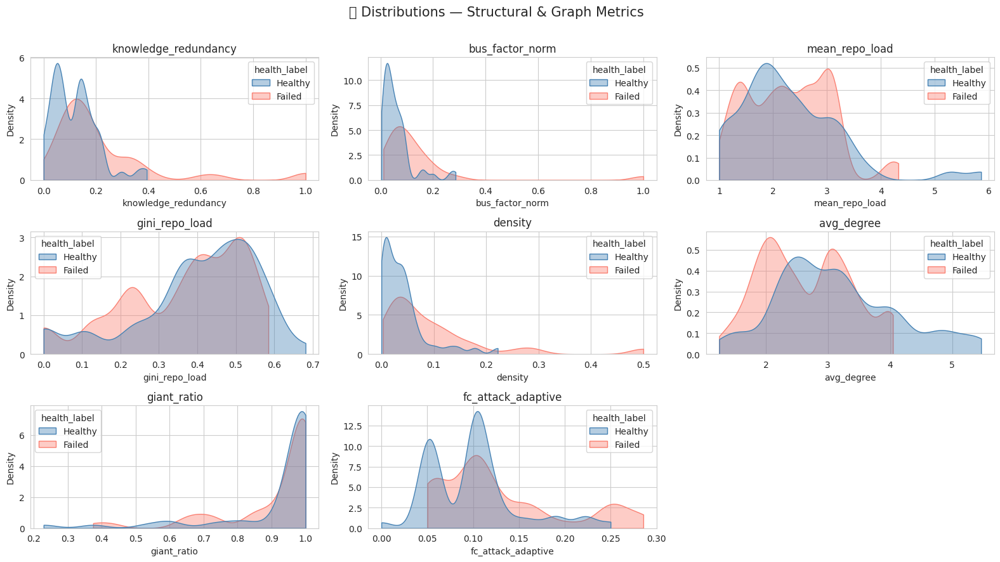

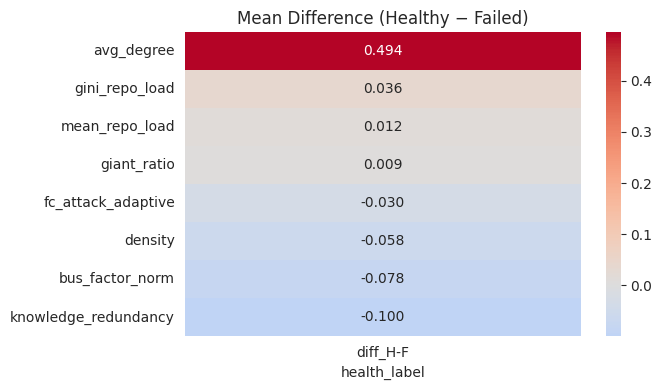

✅ Summary and KDE distributions complete.


In [ ]:
# ===============================================================
# 🧠 COMBINE GRAPH STATS + STRUCTURAL METRICS (ROBUST + CLEAN)
# ===============================================================
import pandas as pd, numpy as np, itertools, seaborn as sns, matplotlib.pyplot as plt, os

# === Load existing outputs ===
graph_path = "results_cache/graph_metrics_full_combined.csv"  # explicit combined file
graph_df = pd.read_csv(graph_path)
print(f"✅ Loaded {len(graph_df):,} rows from {graph_path}")

labeled_path = "results_cache/all_data_nov8.csv"
df_all = pd.read_csv(labeled_path)
print(f"✅ Loaded labeled base data ({len(df_all):,} rows)")

# ===============================================================
# 🧩 Structural metrics (knowledge redundancy, bus factor, etc.)
# ===============================================================

def gini(x):
    """
    Efficient O(N log N) Gini coefficient.
    Measures inequality of contributor participation (repo load).
    """
    x = np.sort(np.array(x))
    n = len(x)
    if n == 0 or np.sum(x) == 0:
        return np.nan
    cumx = np.cumsum(x)
    return (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n


def compute_structural_metrics(df, project, label):
    """
    Compute key structural metrics for a project:
      - knowledge redundancy (average contributor overlap across repos)
      - normalized bus factor (fraction of devs accounting for 50% commits)
      - mean repo load & Gini repo load (inequality of contributor participation)
    """
    if df.empty:
        return dict(
            project=project, health_label=label,
            knowledge_redundancy=np.nan, bus_factor_norm=np.nan,
            mean_repo_load=np.nan, gini_repo_load=np.nan,
            n_repos=0, n_contributors=0, n_commits=0
        )

    # --- Clean + setup ---
    repos = df["repo"].dropna().unique()
    contributors = df["contributor_unique_id_builder_love"].dropna().unique()
    n_repos, n_devs = len(repos), len(contributors)
    total_commits = df["commits"].fillna(0).sum()

    # --- Knowledge redundancy (scalable sampling) ---
    repo_to_devs = {
        r: set(df.loc[df["repo"] == r, "contributor_unique_id_builder_love"])
        for r in repos
    }
    overlaps = []
    max_pairs = 5000  # cap combinations to prevent quadratic blowup
    # --- Deterministic stratified sampling by sorted repo names ---
    repo_pairs = list(itertools.combinations(sorted(repos), 2))
    if len(repo_pairs) > max_pairs:
        # pick evenly spaced indices instead of random subset
        step = max(1, len(repo_pairs) // max_pairs)
        repo_pairs = repo_pairs[::step]
    for r1, r2 in repo_pairs:

        a, b = repo_to_devs[r1], repo_to_devs[r2]
        if a and b:
            overlaps.append(len(a & b) / len(a | b))
    knowledge_redundancy = np.mean(overlaps) if overlaps else 0.0

    # --- Bus factor (how concentrated contributions are) ---
    contrib_sums = (
        df.groupby("contributor_unique_id_builder_love")["commits"]
        .sum(min_count=1)
        .fillna(0)
        .sort_values(ascending=False)
    )
    cumulative = contrib_sums.cumsum() / contrib_sums.sum() if contrib_sums.sum() > 0 else [1.0]
    bus_factor = np.searchsorted(cumulative, 0.5) + 1
    bus_factor_norm = bus_factor / max(1, n_devs)

    # --- Contributor–repo imbalance ---
    repo_counts = df.groupby("contributor_unique_id_builder_love")["repo"].nunique().values
    mean_repo_load = np.mean(repo_counts) if len(repo_counts) else np.nan
    gini_repo_load = gini(repo_counts) if len(repo_counts) else np.nan

    return dict(
        project=project,
        health_label=label,
        knowledge_redundancy=knowledge_redundancy,
        bus_factor_norm=bus_factor_norm,
        mean_repo_load=mean_repo_load,
        gini_repo_load=gini_repo_load,
        n_repos=n_repos,
        n_contributors=n_devs,
        n_commits=total_commits,
    )


# ===============================================================
# 🚀 Compute per-project structural metrics
# ===============================================================
structural_rows = []
for project, group in df_all.groupby("project_name"):
    label = group["project_status"].iloc[0]
    if label not in ["Healthy", "Failed"]:
        continue
    metrics = compute_structural_metrics(group, project, label)
    structural_rows.append(metrics)

structural_df = pd.DataFrame(structural_rows)
print(f"✅ Computed structural metrics for {len(structural_df)} projects")

# ===============================================================
# 🔗 Merge with graph metrics
# ===============================================================
merged_df = pd.merge(graph_df, structural_df, on=["project", "health_label"], how="left")
out_path = f"results_cache/combined_metrics_{os.path.basename(graph_path).split('.')[0]}.csv"
merged_df.to_csv(out_path, index=False)
print(f"💾 Combined metrics saved to {out_path}")

# ===============================================================
# 📊 SUMMARY & DISTRIBUTIONS
# ===============================================================
sns.set_style("whitegrid")

# Columns to analyze (no fragility coefficient)
cols = [
    "knowledge_redundancy", "bus_factor_norm", "mean_repo_load",
    "gini_repo_load", "density", "avg_degree", "giant_ratio",
    "fc_attack_adaptive" if "fc_attack_adaptive" in merged_df.columns else "fc_attack"
]

# Clean
merged_df = merged_df.replace([np.inf, -np.inf], np.nan).dropna(subset=["health_label"])

# === Summary ===
summary = (
    merged_df.groupby("health_label")[cols]
             .agg(["mean", "median", "std", "count"])
             .transpose()
)
print("\n📋 Summary Statistics:")
display(summary.round(3))

# === KDE Distributions ===
ncols = 3
nrows = int(np.ceil(len(cols) / ncols))
plt.figure(figsize=(16, nrows * 3))
for i, metric in enumerate(cols, 1):
    plt.subplot(nrows, ncols, i)
    data = merged_df[metric].dropna()
    if len(data) < 5:
        continue
    sns.kdeplot(
        data=merged_df, x=metric, hue="health_label",
        fill=True, common_norm=False, alpha=0.4,
        palette={"Healthy": "steelblue", "Failed": "salmon"},
        bw_adjust=0.5, cut=0
    )
    plt.title(metric)
plt.suptitle("📈 Distributions — Structural & Graph Metrics", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# === Mean Difference Heatmap ===
diffs = merged_df.groupby("health_label")[cols].mean().T
diffs["diff_H-F"] = diffs["Healthy"] - diffs["Failed"]
plt.figure(figsize=(7, len(cols) * 0.5))
sns.heatmap(
    diffs[["diff_H-F"]].sort_values("diff_H-F", ascending=False),
    annot=True, cmap="coolwarm", center=0, fmt=".3f"
)
plt.title("Mean Difference (Healthy − Failed)")
plt.tight_layout()
plt.show()

print("✅ Summary and KDE distributions complete.")


computes mean, median, and std for each category. Also plots the distribution for both samples.

✅ Loaded 97 rows from results_cache/graph_metrics_full_combined.csv
✅ Loaded labeled base data (59,480 rows)
🔹 Aave (Healthy) — 445 rows
🔹 Acala (Failed) — 513 rows
🔹 Akropolis (Failed) — 281 rows
🔹 Arbitrum (Healthy) — 2,885 rows
🔹 Aura Finance (Healthy) — 38 rows
🔹 Badger DAO (Failed) — 239 rows
🔹 Balancer (Healthy) — 817 rows
🔹 Bamboo DeFi (Failed) — 6 rows
🔹 Bancor (Failed) — 293 rows
🔹 Beanstalk (Failed) — 173 rows
🔹 BoringDAO (Failed) — 10 rows
🔹 Centrifuge (Healthy) — 555 rows
🔹 ChainLink (Healthy) — 2,636 rows
🔹 CompliFi (Failed) — 3 rows
🔹 Compound (Healthy) — 592 rows
🔹 Cream Finance (Failed) — 28 rows
🔹 Curve (Healthy) — 315 rows
🔹 DAO Maker (Failed) — 21 rows
🔹 Dego Finance (Failed) — 16 rows
🔹 Deus Finance (Failed) — 174 rows
🔹 EigenLayer (Healthy) — 1,539 rows
🔹 Element Finance (Healthy) — 194 rows
🔹 Enigma (Failed) — 538 rows
🔹 Enso Finance (Healthy) — 116 rows
🔹 Ethereum (Healthy) — 17,827 rows
🔹 Euler Finance (Healthy) — 296 rows
🔹 Fei Protocol (Failed) — 73 rows
🔹 Fra

health_label                 Failed  Healthy
knowledge_redundancy mean     0.218    0.118
                     median   0.152    0.115
                     std      0.214    0.087
                     count   47.000   50.000
bus_factor_norm      mean     0.138    0.060
                     median   0.078    0.043
                     std      0.194    0.061
                     count   47.000   50.000
mean_repo_load       mean     2.289    2.301
                     median   2.263    2.099
                     std      0.784    0.986
                     count   47.000   50.000
gini_repo_load       mean     0.364    0.400
                     median   0.405    0.441
                     std      0.162    0.166
                     count   47.000   50.000
density              mean     0.099    0.040
                     median   0.058    0.028
                     std      0.110    0.046
                     count   47.000   50.000
avg_degree           mean     2.645    3.139
                     median   2.533    3.038
                     std      0.738    0.992
                     count   47.000   50.000
giant_ratio          mean     0.908    0.917
                     median   0.978    0.991
                     std      0.150    0.169
                     count   47.000   50.000
fc_attack_adaptive   mean     0.130    0.100
                     median   0.103    0.101
                     std      0.071    0.051
                     count   47.000   50.000

/tmp/ipython-input-3257878766.py:159: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.97])
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


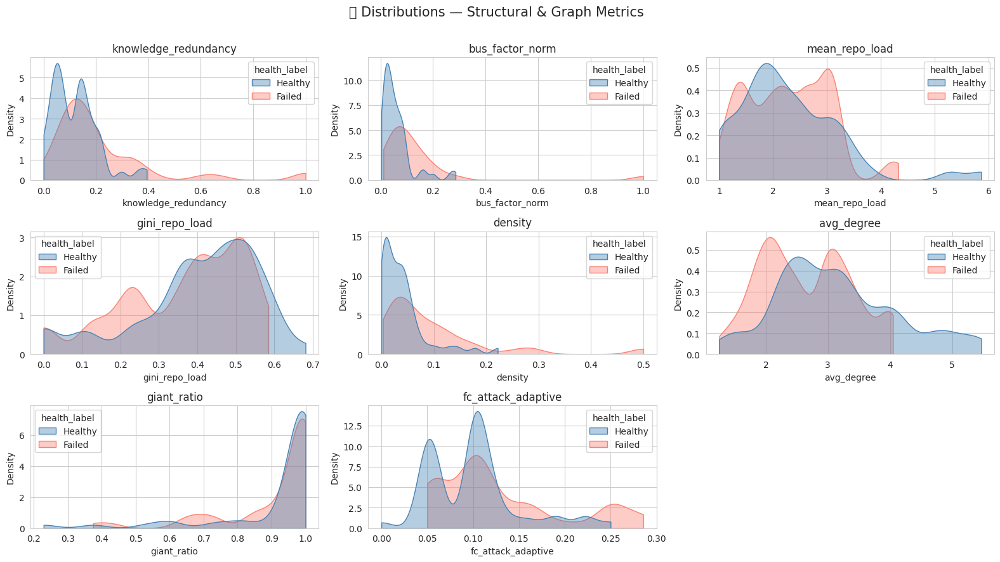

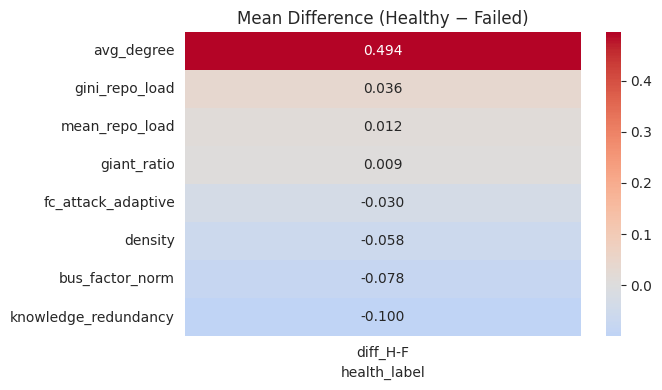

✅ Summary and KDE distributions complete.


In [ ]:
# ===============================================================
# 🧠 COMBINE GRAPH STATS + STRUCTURAL METRICS (FULL PRECISION)
# ===============================================================
import pandas as pd, numpy as np, itertools, seaborn as sns, matplotlib.pyplot as plt, os

# === Load combined graph metrics ===
graph_path = "results_cache/graph_metrics_full_combined.csv"
graph_df = pd.read_csv(graph_path)
print(f"✅ Loaded {len(graph_df):,} rows from {graph_path}")

# === Load labeled data ===
labeled_path = "results_cache/all_data_nov8.csv"
df_all = pd.read_csv(labeled_path)
print(f"✅ Loaded labeled base data ({len(df_all):,} rows)")

# ===============================================================
# 🧩 Structural metrics (exact version, no sampling)
# ===============================================================
def gini(x):
    """
    Standard pairwise Gini coefficient (exact O(N²) definition).
    Measures inequality of contributor participation.
    """
    x = np.array(x)
    if np.amin(x) < 0:
        x -= np.amin(x)
    mean_x = np.mean(x)
    if mean_x == 0:
        return np.nan
    diff_sum = np.sum(np.abs(np.subtract.outer(x, x)))
    return diff_sum / (2 * len(x)**2 * mean_x)


def compute_structural_metrics(df, project, label):
    """
    Compute structural metrics for each project (exact formulation):
      - Knowledge redundancy (full repo pair combinations)
      - Bus factor (normalized)
      - Mean & Gini repo load (inequality)
    """
    if df.empty:
        return dict(
            project=project, health_label=label,
            knowledge_redundancy=np.nan, bus_factor_norm=np.nan,
            mean_repo_load=np.nan, gini_repo_load=np.nan,
            n_repos=0, n_contributors=0, n_commits=0
        )

    # --- Basic stats ---
    repos = df["repo"].dropna().unique()
    contributors = df["contributor_unique_id_builder_love"].dropna().unique()
    n_repos, n_devs = len(repos), len(contributors)
    total_commits = df["commits"].fillna(0).sum()

    # --- Knowledge redundancy (exact, all repo pairs) ---
    repo_to_devs = {
        r: set(df.loc[df["repo"] == r, "contributor_unique_id_builder_love"])
        for r in repos
    }
    overlaps = []
    for r1, r2 in itertools.combinations(repos, 2):
        a, b = repo_to_devs[r1], repo_to_devs[r2]
        if not a or not b:
            continue
        overlaps.append(len(a & b) / len(a | b))
    knowledge_redundancy = np.mean(overlaps) if overlaps else 0.0

    # --- Bus factor ---
    contrib_sums = (
        df.groupby("contributor_unique_id_builder_love")["commits"]
        .sum(min_count=1)
        .fillna(0)
        .sort_values(ascending=False)
    )
    cumulative = contrib_sums.cumsum() / contrib_sums.sum() if contrib_sums.sum() > 0 else [1.0]
    bus_factor = np.searchsorted(cumulative, 0.5) + 1
    bus_factor_norm = bus_factor / max(1, n_devs)

    # --- Contributor–repo imbalance ---
    repo_counts = df.groupby("contributor_unique_id_builder_love")["repo"].nunique().values
    mean_repo_load = np.mean(repo_counts) if len(repo_counts) else np.nan
    gini_repo_load = gini(repo_counts) if len(repo_counts) else np.nan

    return dict(
        project=project,
        health_label=label,
        knowledge_redundancy=knowledge_redundancy,
        bus_factor_norm=bus_factor_norm,
        mean_repo_load=mean_repo_load,
        gini_repo_load=gini_repo_load,
        n_repos=n_repos,
        n_contributors=n_devs,
        n_commits=total_commits
    )


# ===============================================================
# 🚀 Compute metrics per project
# ===============================================================
structural_rows = []
for project, group in df_all.groupby("project_name"):
    label = group["project_status"].iloc[0]
    if label not in ["Healthy", "Failed"]:
        continue
    print(f"🔹 {project} ({label}) — {len(group):,} rows")
    metrics = compute_structural_metrics(group, project, label)
    structural_rows.append(metrics)

structural_df = pd.DataFrame(structural_rows)
print(f"✅ Computed structural metrics for {len(structural_df)} projects")

# ===============================================================
# 🔗 Merge with graph metrics
# ===============================================================
merged_df = pd.merge(graph_df, structural_df, on=["project", "health_label"], how="left")
out_path = "results_cache/combined_metrics_full_precision.csv"
merged_df.to_csv(out_path, index=False)
print(f"💾 Combined metrics saved to {out_path}")

# ===============================================================
# 📊 SUMMARY & DISTRIBUTIONS
# ===============================================================
sns.set_style("whitegrid")

cols = [
    "knowledge_redundancy", "bus_factor_norm", "mean_repo_load",
    "gini_repo_load", "density", "avg_degree", "giant_ratio",
    "fc_attack_adaptive" if "fc_attack_adaptive" in merged_df.columns else "fc_attack"
]

merged_df = merged_df.replace([np.inf, -np.inf], np.nan).dropna(subset=["health_label"])

# === Summary ===
summary = (
    merged_df.groupby("health_label")[cols]
             .agg(["mean", "median", "std", "count"])
             .transpose()
)
print("\n📋 Summary Statistics:")
display(summary.round(3))

# === KDE Distributions ===
ncols = 3
nrows = int(np.ceil(len(cols) / ncols))
plt.figure(figsize=(16, nrows * 3))
for i, metric in enumerate(cols, 1):
    plt.subplot(nrows, ncols, i)
    data = merged_df[metric].dropna()
    if len(data) < 5:
        continue
    sns.kdeplot(
        data=merged_df, x=metric, hue="health_label",
        fill=True, common_norm=False, alpha=0.4,
        palette={"Healthy": "steelblue", "Failed": "salmon"},
        bw_adjust=0.5, cut=0
    )
    plt.title(metric)
plt.suptitle("📈 Distributions — Structural & Graph Metrics", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# === Mean Difference Heatmap ===
diffs = merged_df.groupby("health_label")[cols].mean().T
diffs["diff_H-F"] = diffs["Healthy"] - diffs["Failed"]
plt.figure(figsize=(7, len(cols) * 0.5))
sns.heatmap(
    diffs[["diff_H-F"]].sort_values("diff_H-F", ascending=False),
    annot=True, cmap="coolwarm", center=0, fmt=".3f"
)
plt.title("Mean Difference (Healthy − Failed)")
plt.tight_layout()
plt.show()

print("✅ Summary and KDE distributions complete.")


This is the same but we don't use a vectorized solution for Gini calculation (helps reduce computational constraints for large networks). Both run fine.

This block also computes our bus factor, knowledge redundancy and density and combines it with the existing metrics calculated earlier into a single merged dataframe. After this is done, it finds the distributions and then calculates descriptive statistics as well as the differences between the means in both samples.

In [ ]:
# ===============================================================
# 🧪 NORMALITY TEST — Shapiro–Wilk (for valid columns)
# ===============================================================
from scipy.stats import shapiro

cols = [
    "knowledge_redundancy", "bus_factor_norm", "mean_repo_load",
    "gini_repo_load", "density", "avg_degree", "giant_ratio",
    "fc_attack_adaptive" if "fc_attack_adaptive" in merged_df.columns else "fc_attack"
]

# Filter only existing columns
valid_cols = [c for c in cols if c in merged_df.columns]
print(f"🧩 Testing normality for {len(valid_cols)} columns: {valid_cols}")

shapiro_results = []

for col in valid_cols:
    data = merged_df[col].dropna()
    if len(data) < 8:
        continue  # Shapiro requires n >= 3; small samples not meaningful
    # Cap sample to 5000 for numerical stability (scipy limit)
    stat, p = shapiro(data.sample(min(len(data), 5000), random_state=42))
    shapiro_results.append({
        "metric": col,
        "n": len(data),
        "Shapiro_W": stat,
        "p_value": p,
        "Normal_(α=0.05)": p > 0.05
    })

shapiro_df = pd.DataFrame(shapiro_results)
print("\n📊 Shapiro–Wilk Normality Results:")
display(shapiro_df.round(4))


🧩 Testing normality for 8 columns: ['knowledge_redundancy', 'bus_factor_norm', 'mean_repo_load', 'gini_repo_load', 'density', 'avg_degree', 'giant_ratio', 'fc_attack_adaptive']

📊 Shapiro–Wilk Normality Results:


,metric,n,Shapiro_W,p_value,Normal_(α=0.05)
0,knowledge_redundancy,97,0.6954,0.0000,False
1,bus_factor_norm,97,0.4753,0.0000,False
2,mean_repo_load,97,0.9283,0.0001,False
3,gini_repo_load,97,0.9266,0.0000,False
4,density,97,0.6732,0.0000,False
5,avg_degree,97,0.9708,0.0291,False
6,giant_ratio,97,0.6120,0.0000,False
7,fc_attack_adaptive,97,0.8644,0.0000,False


Testing for normality, we find that only average degree is approximately normal. So our analysis will require nonparametric methods

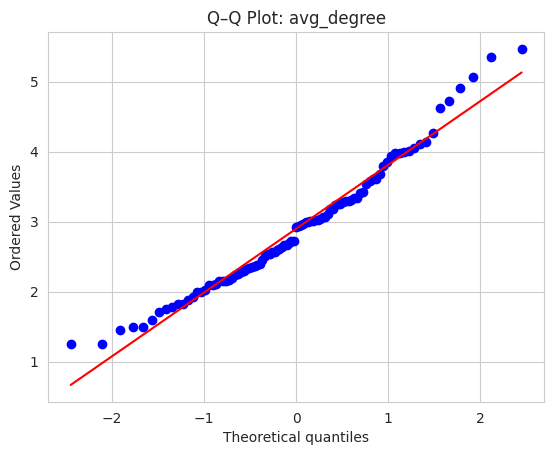

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt

data = merged_df["avg_degree"].dropna()
stats.probplot(data, dist="norm", plot=plt)
plt.title("Q–Q Plot: avg_degree")
plt.show()


confirming normality for average degree

Testing for normality. It appears that all the distributions for the metrics are non-normal.


📊 Nonparametric Healthy vs Failed Comparison:


,metric,healthy_median,failed_median,mannwhitney_p,cliffs_delta,bootstrap_p_median,p_adj,significant_(FDR<0.05)
1,bus_factor_norm,0.0432,0.0784,0.0000,-0.4817,0.0005,0.0004,True
4,density,0.0282,0.0581,0.0002,-0.4468,0.0015,0.0006,True
0,knowledge_redundancy,0.1148,0.1523,0.0051,-0.3306,0.0740,0.0136,True
5,avg_degree,3.0376,2.5333,0.0132,0.2928,0.0170,0.0263,True
7,fc_attack_adaptive,0.1014,0.1034,0.0347,-0.2494,0.2390,0.0555,False
3,gini_repo_load,0.4409,0.4052,0.2336,0.1409,0.3420,0.3114,False
2,mean_repo_load,2.0989,2.2632,0.6860,-0.0481,0.4075,0.7500,False
6,giant_ratio,0.9908,0.9778,0.7500,0.0370,0.3575,0.7500,False


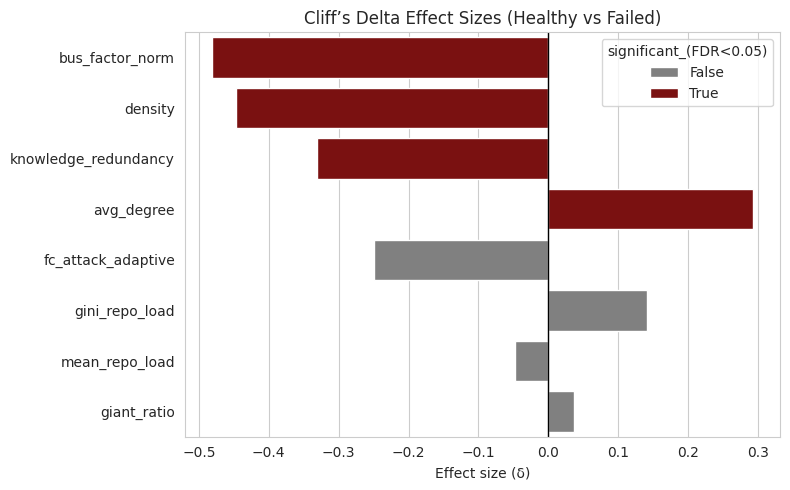

In [ ]:
# ===============================================================
# 🧪 NONPARAMETRIC SIGNIFICANCE TESTS: HEALTHY vs FAILED
# ===============================================================
from scipy.stats import mannwhitneyu
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests

df = merged_df  # already in memory

metrics = [
    "knowledge_redundancy", "bus_factor_norm", "mean_repo_load",
    "gini_repo_load", "density", "avg_degree", "giant_ratio",
    "fc_attack_adaptive" if "fc_attack_adaptive" in df.columns else "fc_attack"
]

# === Cliff's Delta (vectorized) ===
def cliffs_delta(x, y):
    nx, ny = len(x), len(y)
    if nx == 0 or ny == 0:
        return np.nan
    diff = np.subtract.outer(x, y)
    return (np.sum(diff > 0) - np.sum(diff < 0)) / (nx * ny)

# === Bootstrap median difference p-value ===
def bootstrap_pval(x, y, n_boot=5000):
    obs_diff = np.median(x) - np.median(y)
    combined = np.concatenate([x, y])
    diffs = []
    for _ in range(n_boot):
        perm = np.random.permutation(combined)
        diffs.append(np.median(perm[:len(x)]) - np.median(perm[len(x):]))
    return np.mean(np.abs(diffs) >= np.abs(obs_diff))

results = []
for metric in metrics:
    x = df.loc[df["health_label"]=="Healthy", metric].dropna()
    y = df.loc[df["health_label"]=="Failed", metric].dropna()
    if len(x) < 5 or len(y) < 5:
        continue
    U, p_mw = mannwhitneyu(x, y, alternative="two-sided")
    d = cliffs_delta(x.values, y.values)
    p_boot = bootstrap_pval(x.values, y.values, n_boot=2000)
    results.append({
        "metric": metric,
        "healthy_median": np.median(x),
        "failed_median": np.median(y),
        "mannwhitney_p": p_mw,
        "cliffs_delta": d,
        "bootstrap_p_median": p_boot
    })

results_df = pd.DataFrame(results)
results_df["p_adj"] = multipletests(results_df["mannwhitney_p"], method="fdr_bh")[1]
results_df["significant_(FDR<0.05)"] = results_df["p_adj"] < 0.05
results_df = results_df.sort_values("mannwhitney_p")

print("\n📊 Nonparametric Healthy vs Failed Comparison:")
display(results_df.round(4))

# === Visualization ===
plt.figure(figsize=(8,5))
sns.barplot(data=results_df, y="metric", x="cliffs_delta",
            hue="significant_(FDR<0.05)", dodge=False,
            palette={True:"darkred", False:"gray"})
plt.axvline(0, color="black", lw=1)
plt.title("Cliff’s Delta Effect Sizes (Healthy vs Failed)")
plt.xlabel("Effect size (δ)")
plt.ylabel("")
plt.tight_layout()
plt.show()


aiming to test if the distributions between metrics for each category or statistically significant in difference. We find that bus factor, density, and knowledge redundancy. However, I suspect that project size might be a confounder, so we need to try an account for this.

In [ ]:
from scipy.stats import ks_2samp

for metric in metrics:
    x = df.loc[df["health_label"]=="Healthy", metric].dropna()
    y = df.loc[df["health_label"]=="Failed", metric].dropna()
    if len(x) < 5 or len(y) < 5:
        continue
    stat, p = ks_2samp(x, y, alternative="two-sided")
    print(f"{metric:25s} KS D={stat:.3f}, p={p:.4f}")


knowledge_redundancy      KS D=0.291, p=0.0247
bus_factor_norm           KS D=0.410, p=0.0003
mean_repo_load            KS D=0.147, p=0.6054
gini_repo_load            KS D=0.172, p=0.4073
density                   KS D=0.356, p=0.0030
avg_degree                KS D=0.263, p=0.0556
giant_ratio               KS D=0.124, p=0.7876
fc_attack_adaptive        KS D=0.223, p=0.1486


Testing interpretation validity. These two tests show that many of the metrics' distributions between groups differ significantly.

In [ ]:
from scipy.stats import anderson_ksamp

for metric in metrics:
    x = df.loc[df["health_label"]=="Healthy", metric].dropna()
    y = df.loc[df["health_label"]=="Failed", metric].dropna()
    if len(x) < 5 or len(y) < 5:
        continue
    res = anderson_ksamp([x, y])
    print(f"{metric:25s} AD stat={res.statistic:.3f}, p={res.significance_level:.4f}")


knowledge_redundancy      AD stat=4.549, p=0.0051
bus_factor_norm           AD stat=10.413, p=0.0010
mean_repo_load            AD stat=-0.563, p=0.2500
gini_repo_load            AD stat=0.166, p=0.2500
density                   AD stat=8.818, p=0.0010
avg_degree                AD stat=3.552, p=0.0119
giant_ratio               AD stat=-0.610, p=0.2500
fc_attack_adaptive        AD stat=2.785, p=0.0236


/tmp/ipython-input-3013071471.py:8: UserWarning: p-value floored: true value smaller than 0.001. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = anderson_ksamp([x, y])
/tmp/ipython-input-3013071471.py:8: UserWarning: p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = anderson_ksamp([x, y])


alternative test for same purpose

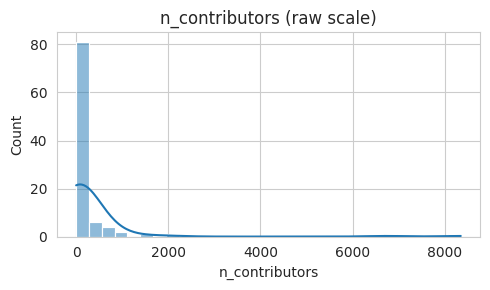

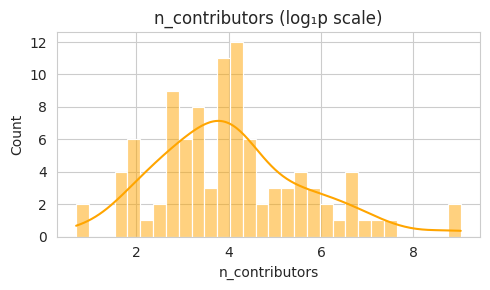

n_contributors     Shapiro-Wilk p=0.00000 | Skewness=6.130


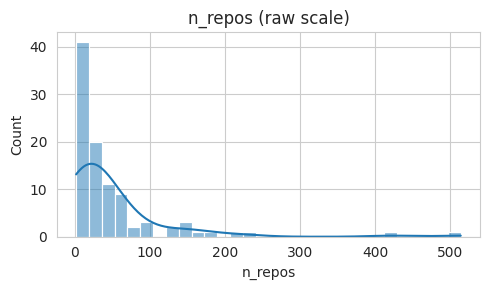

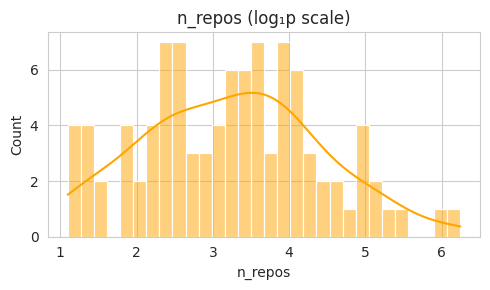

n_repos            Shapiro-Wilk p=0.00000 | Skewness=3.813


In [ ]:
# ===============================================================
# 📊 Inspect Distributions of Size Variables
# ===============================================================
import seaborn as sns, matplotlib.pyplot as plt
from scipy.stats import shapiro, skew

size_vars = ["n_contributors", "n_repos"]

for var in size_vars:
    plt.figure(figsize=(5,3))
    sns.histplot(merged_df[var].dropna(), bins=30, kde=True)
    plt.title(f"{var} (raw scale)")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(5,3))
    sns.histplot(np.log1p(merged_df[var].dropna()), bins=30, kde=True, color="orange")
    plt.title(f"{var} (log₁p scale)")
    plt.tight_layout()
    plt.show()

    # Shapiro–Wilk and skewness
    x = merged_df[var].dropna()
    stat, p = shapiro(x.sample(min(len(x), 5000), random_state=42))
    print(f"{var:18s} Shapiro-Wilk p={p:.5f} | Skewness={skew(x):.3f}")


testing the distribution of number of contributors and number of repos, neither are normal.

✅ Matched 47 failed projects to 47 healthy ones (contributors + repos, log-scaled).

📏 Size Balance Check (before tests):


,variable,failed_median,healthy_median,failed_mean,healthy_mean,KS_p(log-space)
0,n_contributors,26.0,27.0,70.170,71.404,0.996
1,n_repos,15.0,11.0,27.936,27.447,0.844



📊 Size-Controlled Nonparametric Comparison (Matched by log[n_contributors, n_repos]):


,metric,healthy_mean,failed_mean,healthy_median,failed_median,mannwhitney_p,cliffs_delta,effect_direction,significant_(α=0.05)
7,fc_attack_adaptive,0.139189,0.129745,0.121212,0.103448,0.207573,0.151200,Healthy>Failed,False
2,mean_repo_load,2.373828,2.289017,2.076923,2.263158,0.488845,-0.083296,Failed>Healthy,False
5,avg_degree,2.840193,2.645208,2.571429,2.533333,0.604358,0.062472,Healthy>Failed,False
4,density,0.085635,0.098707,0.061423,0.058072,0.620283,0.059756,Healthy>Failed,False
6,giant_ratio,0.865536,0.908330,0.980031,0.977778,0.815765,-0.027162,Failed>Healthy,False
1,bus_factor_norm,0.112490,0.137930,0.087719,0.078431,0.852932,0.022635,Healthy>Failed,False
0,knowledge_redundancy,0.164996,0.217653,0.157912,0.152278,0.930680,-0.010865,Failed>Healthy,False
3,gini_repo_load,0.366511,0.363825,0.381054,0.405195,0.978875,-0.003622,Failed>Healthy,False


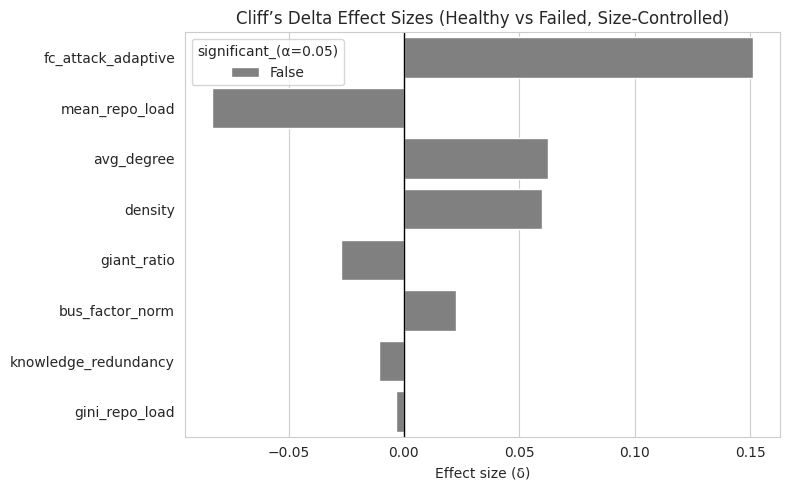

In [ ]:
# ===============================================================
# 🧪 NONPARAMETRIC SIGNIFICANCE TESTS (CONTROLLED FOR SIZE: CONTRIBUTORS + REPOS)
# ===============================================================
from scipy.stats import mannwhitneyu, ks_2samp
from sklearn.neighbors import NearestNeighbors
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

# --- Copy dataset ---
df = merged_df.copy()

# Ensure required size variables exist
required_cols = {"n_contributors", "n_repos"}
if not required_cols.issubset(df.columns):
    raise ValueError(f"merged_df must contain {required_cols} columns for size control.")

# --- Define metrics to test ---
metrics = [
    "knowledge_redundancy","bus_factor_norm","mean_repo_load",
    "gini_repo_load","density","avg_degree","giant_ratio","fc_attack_adaptive"
]

# --- Define Cliff’s Delta ---
def cliffs_delta(x, y):
    nx, ny = len(x), len(y)
    if nx == 0 or ny == 0:
        return np.nan
    diff = 0
    for xi in x:
        diff += np.sum(xi > y) - np.sum(xi < y)
    return diff / (nx * ny)

# ===============================================================
# 🔍 Step 1: Prepare and match projects by size (2D: contributors + repos)
# ===============================================================
healthy = df[df["health_label"]=="Healthy"].dropna(subset=["n_contributors","n_repos"])
failed  = df[df["health_label"]=="Failed"].dropna(subset=["n_contributors","n_repos"])

# Log-transform to handle heavy tails
X_healthy = np.log1p(healthy[["n_contributors","n_repos"]])
X_failed  = np.log1p(failed[["n_contributors","n_repos"]])

# Nearest-neighbor match in 2D (Euclidean distance in log space)
nbrs = NearestNeighbors(n_neighbors=1, metric="euclidean").fit(X_healthy)
dist, idx = nbrs.kneighbors(X_failed)

matched_healthy = healthy.iloc[idx.flatten()].assign(match_id=failed.index)
paired = pd.concat([
    failed.assign(match_id=failed.index),
    matched_healthy
])

print(f"✅ Matched {len(failed)} failed projects to {len(matched_healthy)} healthy ones (contributors + repos, log-scaled).")

# ===============================================================
# 📊 Step 2: Check balance after matching
# ===============================================================
balance_stats = []
for var in ["n_contributors", "n_repos"]:
    f_vals = failed[var].values
    h_vals = matched_healthy[var].values
    ks_stat, ks_p = ks_2samp(np.log1p(f_vals), np.log1p(h_vals))
    balance_stats.append({
        "variable": var,
        "failed_median": np.median(f_vals),
        "healthy_median": np.median(h_vals),
        "failed_mean": np.mean(f_vals),
        "healthy_mean": np.mean(h_vals),
        "KS_p(log-space)": ks_p
    })

balance_df = pd.DataFrame(balance_stats)
print("\n📏 Size Balance Check (before tests):")
display(balance_df.round(3))

# ===============================================================
# 🧪 Step 3: Mann–Whitney + Cliff’s δ (size-controlled)
# ===============================================================
results = []

for metric in metrics:
    h = paired.loc[paired["health_label"]=="Healthy", metric].dropna()
    f = paired.loc[paired["health_label"]=="Failed", metric].dropna()
    if min(len(h), len(f)) < 5:
        continue

    # Mann–Whitney
    U, p_mw = mannwhitneyu(h, f, alternative="two-sided")

    # Cliff’s Delta
    d = cliffs_delta(h.values, f.values)

    results.append({
        "metric": metric,
        "healthy_mean": np.mean(h),
        "failed_mean": np.mean(f),
        "healthy_median": np.median(h),
        "failed_median": np.median(f),
        "mannwhitney_p": p_mw,
        "cliffs_delta": d,
        "effect_direction": "Healthy>Failed" if d > 0 else "Failed>Healthy"
    })

results_df = pd.DataFrame(results)
results_df["significant_(α=0.05)"] = results_df["mannwhitney_p"] < 0.05
results_df = results_df.sort_values("mannwhitney_p")

print("\n📊 Size-Controlled Nonparametric Comparison (Matched by log[n_contributors, n_repos]):")
display(results_df)

# ===============================================================
# 🎨 Step 4: Visualize effect sizes
# ===============================================================
plt.figure(figsize=(8,5))
sns.barplot(
    data=results_df, y="metric", x="cliffs_delta",
    hue="significant_(α=0.05)", dodge=False,
    palette={True:"darkred", False:"gray"}
)
plt.axvline(0, color="black", lw=1)
plt.title("Cliff’s Delta Effect Sizes (Healthy vs Failed, Size-Controlled)")
plt.xlabel("Effect size (δ)")
plt.ylabel("")
plt.tight_layout()
plt.show()


controlling for size, we see that now no metrics differe significantly in size between labels. in this we scale all projects on a log scale because it's a nonparametric method to help reduce data skew, and then we perform the same tests as before

In [ ]:
# ===============================================================
# 🧮 Aligned Rank Transformation ANCOVA (using ART procedure)
# ===============================================================
import pandas as pd
import numpy as np
from scipy.stats import rankdata
from statsmodels.formula.api import ols
import statsmodels.api as sm

# --- Copy the updated merged dataset ---
df = merged_df.copy()

# --- Define metrics (updated variable names) ---
metrics = [
    "knowledge_redundancy","bus_factor_norm","mean_repo_load",
    "gini_repo_load","density","avg_degree","giant_ratio","fc_attack_adaptive"
]

# ===============================================================
# 🔧 Aligned Rank Transform Helper
# ===============================================================
def aligned_rank_transform(df, response, covariates):
    """
    Aligns a response variable by multiple covariates, then rank-transforms the aligned values.
    Equivalent to partialing out covariate effects (nonparametric ANCOVA via ART).
    """
    # Build regression model formula (e.g., response ~ n_contributors + n_repos)
    cov_formula = " + ".join(covariates)
    model = ols(f"{response} ~ {cov_formula}", data=df).fit()
    aligned = df[response] - model.fittedvalues
    df = df.copy()
    df["aligned_rank"] = rankdata(aligned)
    return df

# ===============================================================
# 🚀 Run ART ANCOVA for each metric
# ===============================================================
results = []
for m in metrics:
    # Drop missing or invalid rows
    temp = df[[m, "n_contributors", "n_repos", "health_label"]].dropna()
    if len(temp) < 10:
        continue

    # Align + rank
    temp = aligned_rank_transform(temp, response=m, covariates=["n_contributors", "n_repos"])

    # ANCOVA on aligned ranks
    art_model = ols("aligned_rank ~ C(health_label)", data=temp).fit()
    anova_table = sm.stats.anova_lm(art_model, typ=2)

    # Extract p-value
    p_value = anova_table.loc["C(health_label)", "PR(>F)"]
    results.append({"metric": m, "p_value": p_value})

# ===============================================================
# 📊 Summarize results
# ===============================================================
art_df = pd.DataFrame(results).sort_values("p_value")
art_df["significant_(α=0.05)"] = art_df["p_value"] < 0.05

print("\n📊 Aligned Rank Transform ANCOVA (Controlled for n_contributors + n_repos):")
display(art_df.round(4))



📊 Aligned Rank Transform ANCOVA (Controlled for n_contributors + n_repos):


,metric,p_value,significant_(α=0.05)
1,bus_factor_norm,0.0046,True
4,density,0.0082,True
5,avg_degree,0.0704,False
0,knowledge_redundancy,0.2257,False
7,fc_attack_adaptive,0.3832,False
2,mean_repo_load,0.4279,False
6,giant_ratio,0.4322,False
3,gini_repo_load,0.7445,False


another test, can be more robust since it uses ranked transformations to ordinal scale instead of manual pairing in previous block.

In [ ]:
# ===============================================================
# 📏 Check group sample sizes per metric
# ===============================================================
df = merged_df.copy()
metrics = [
    "knowledge_redundancy","bus_factor_norm","mean_repo_load",
    "gini_repo_load","density","avg_degree","giant_ratio","fc_attack_adaptive"
]

print("📊 Group sample sizes (non-NaN per health_label):\n")

for m in metrics:
    temp = df[[m, "health_label"]].dropna()
    counts = temp["health_label"].value_counts()
    print(f"{m:25s}  Healthy={counts.get('Healthy',0):2d}   Failed={counts.get('Failed',0):2d}   Total={len(temp):3d}")


📊 Group sample sizes (non-NaN per health_label):

knowledge_redundancy       Healthy=50   Failed=47   Total= 97
bus_factor_norm            Healthy=50   Failed=47   Total= 97
mean_repo_load             Healthy=50   Failed=47   Total= 97
gini_repo_load             Healthy=50   Failed=47   Total= 97
density                    Healthy=50   Failed=47   Total= 97
avg_degree                 Healthy=50   Failed=47   Total= 97
giant_ratio                Healthy=50   Failed=47   Total= 97
fc_attack_adaptive         Healthy=50   Failed=47   Total= 97


if sample size is less than 10, ART-ANCOVA is less powerful

In [ ]:
min_n = 10
print("\n⚠️ Metrics with fewer than 10 samples per group:")
for m in metrics:
    temp = df[[m, "health_label"]].dropna()
    counts = temp["health_label"].value_counts()
    if (counts < min_n).any():
        print(f"- {m}: {counts.to_dict()}")



⚠️ Metrics with fewer than 10 samples per group:


none returned

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 3.9 MB/s eta 0:00:00

📊 Partial Spearman correlations (controlling for size + repos):


,metric,partial_r,p_value,n,significant_(α=0.05),direction
1,bus_factor_norm,-0.141,0.1727,97,False,Failed ↑
2,mean_repo_load,-0.068,0.5123,97,False,Failed ↑
7,fc_attack_adaptive,0.056,0.5878,97,False,Healthy ↑
0,knowledge_redundancy,-0.048,0.6440,97,False,Failed ↑
3,gini_repo_load,0.040,0.7022,97,False,Healthy ↑
5,avg_degree,0.016,0.8751,97,False,Healthy ↑
6,giant_ratio,-0.012,0.9085,97,False,Failed ↑
4,density,-0.005,0.9631,97,False,Failed ↑


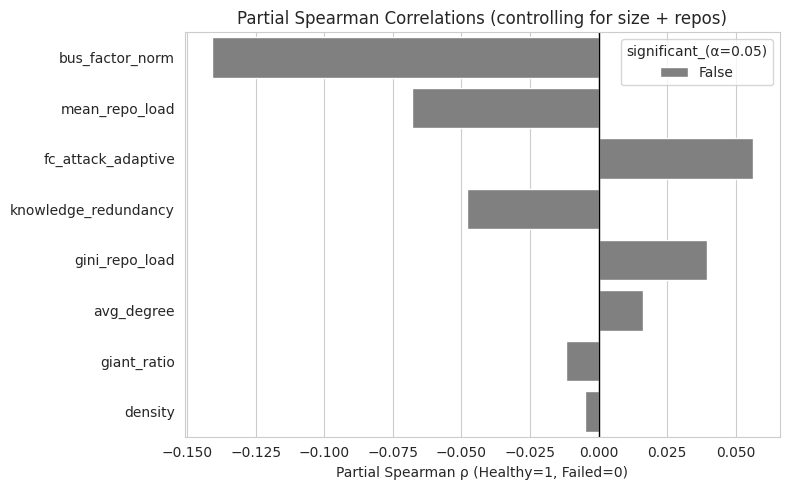

In [ ]:
# ===============================================================
# 🔗 PARTIAL SPEARMAN CORRELATIONS (CONTROLLING FOR SIZE + REPOS)
# ===============================================================
!pip install pingouin -q
import pandas as pd, numpy as np
from pingouin import partial_corr
import seaborn as sns, matplotlib.pyplot as plt

# --- Copy and prepare data ---
df_corr = merged_df.copy()

# Ensure numeric health label
df_corr["health_label_num"] = np.where(df_corr["health_label"] == "Healthy", 1, 0)

# Ensure covariates exist
for c in ["n_contributors", "n_repos"]:
    if c not in df_corr.columns:
        raise ValueError(f"Missing required covariate column: {c}")

# --- Metrics to test ---
metrics = [
    "knowledge_redundancy", "bus_factor_norm", "mean_repo_load",
    "gini_repo_load", "density", "avg_degree",
    "giant_ratio", "fc_attack_adaptive"
]

results = []

for m in metrics:
    # Subset data and drop missing
    sub = df_corr[[m, "health_label_num", "n_contributors", "n_repos"]].dropna()
    if len(sub) < 10:
        print(f"⚠️ Skipping {m}: insufficient valid rows ({len(sub)})")
        continue

    try:
        # Partial Spearman controlling for both covariates
        pc = partial_corr(
            data=sub,
            x=m,
            y="health_label_num",
            covar=["n_contributors", "n_repos"],
            method="spearman"
        )
        results.append({
            "metric": m,
            "partial_r": pc["r"].values[0],
            "p_value": pc["p-val"].values[0],
            "n": len(sub)
        })
    except Exception as e:
        print(f"⚠️ Error in {m}: {e}")

# --- Assemble and display results ---
res_df = pd.DataFrame(results).sort_values("p_value")
res_df["significant_(α=0.05)"] = res_df["p_value"] < 0.05
res_df["direction"] = np.where(res_df["partial_r"] > 0, "Healthy ↑", "Failed ↑")

print("\n📊 Partial Spearman correlations (controlling for size + repos):")
display(res_df.style.background_gradient(
    subset=["partial_r"], cmap="RdBu_r", vmin=-1, vmax=1
).format({"p_value": "{:.4f}", "partial_r": "{:.3f}", "n": "{:.0f}"}))

# --- Optional visualization ---
plt.figure(figsize=(8,5))
sns.barplot(
    data=res_df,
    y="metric", x="partial_r",
    hue="significant_(α=0.05)", dodge=False,
    palette={True: "darkred", False: "gray"}
)
plt.axvline(0, color="black", lw=1)
plt.title("Partial Spearman Correlations (controlling for size + repos)")
plt.xlabel("Partial Spearman ρ (Healthy=1, Failed=0)")
plt.ylabel("")
plt.tight_layout()
plt.show()


testing correlation of metrics with "healthy" designation, controlling for size.

Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])
/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])
/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append


📊 Nonparametric ANCOVA Results (Aligned Rank + Permutation):


/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])
/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])
/tmp/ipython-input-3817710365.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])
/tmp

,metric,ART_p_value,Permutation_p_value,significant_ART_(α=0.05),significant_PERM_(α=0.05)
1,bus_factor_norm,0.0005,1.0000,True,False
2,density,0.0018,1.0000,True,False
0,avg_degree,0.0237,0.9993,True,False
6,knowledge_redundancy,0.0322,0.9997,True,False
5,gini_repo_load,0.1749,0.0220,False,True
3,fc_attack_adaptive,0.2927,0.9987,False,False
4,giant_ratio,0.4364,0.7353,False,False
7,mean_repo_load,0.8946,0.2410,False,False


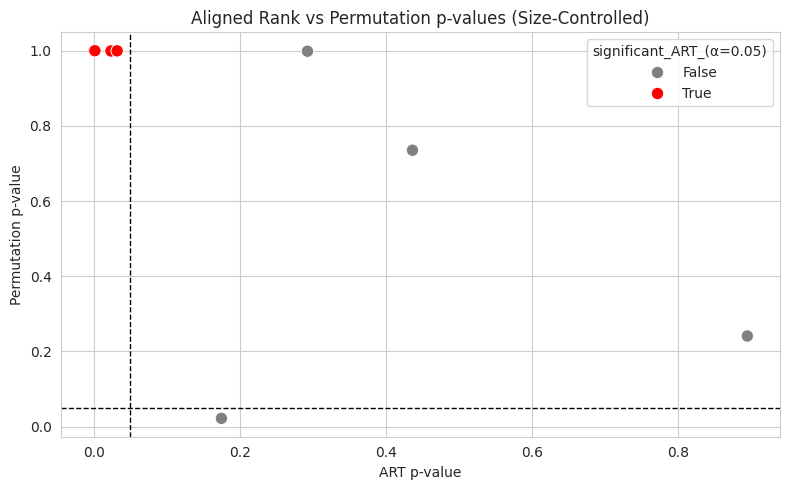

In [ ]:
# ===============================================================
# 🧠 HYBRID NONPARAMETRIC SIGNIFICANCE TEST (ART + PERMUTATION ANCOVA)
# ===============================================================
import pandas as pd, numpy as np
from scipy.stats import rankdata
from statsmodels.formula.api import ols
import statsmodels.api as sm

# --- CONFIG ---
df = merged_df.copy()
metrics = [
    "fc_attack_adaptive","knowledge_redundancy","bus_factor_norm","mean_repo_load",
    "gini_repo_load","density","avg_degree","giant_ratio"
]

# Encode health label as binary (Healthy = 1, Failed = 0)
df["health_label_num"] = np.where(df["health_label"] == "Healthy", 1, 0)

# ===============================================================
# 1️⃣ ALIGNED RANK TRANSFORMATION (ART)
# ===============================================================
def aligned_rank_transform(df, response, covariate):
    """Align response by covariate, then rank the aligned values (Wobbrock et al., 2011)."""
    model = ols(f"{response} ~ {covariate}", data=df).fit()
    aligned = df[response] - model.fittedvalues
    df["aligned_rank"] = rankdata(aligned)
    return df

art_results = []

for m in metrics:
    temp = df[[m, "n_contributors", "health_label_num"]].dropna()
    if len(temp) < 10:
        continue

    temp = aligned_rank_transform(temp, response=m, covariate="n_contributors")
    art_model = ols("aligned_rank ~ C(health_label_num)", data=temp).fit()
    anova_table = sm.stats.anova_lm(art_model, typ=2)
    p_art = anova_table["PR(>F)"].iloc[0]
    art_results.append({"metric": m, "ART_p_value": p_art})

art_df = pd.DataFrame(art_results)


# ===============================================================
# 2️⃣ PERMUTATION ANCOVA (Freedman–Lane)
# ===============================================================
def permutation_ancova(df, response, covariate, group, n_perm=5000, seed=42):
    """Nonparametric ANCOVA via Freedman–Lane permutation test."""
    np.random.seed(seed)
    df = df[[response, covariate, group]].dropna()

    # Full model
    full = ols(f"{response} ~ {covariate} + C({group})", data=df).fit()
    full_F = sm.stats.anova_lm(full, typ=2)["F"][1]  # F-statistic for group
    observed_F = full_F

    # Reduced model (no group)
    reduced = ols(f"{response} ~ {covariate}", data=df).fit()
    resid = reduced.resid

    perm_Fs = []
    for _ in range(n_perm):
        perm_group = np.random.permutation(df[group].values)
        perm_df = pd.DataFrame({
            response: resid + reduced.fittedvalues,
            covariate: df[covariate].values,
            group: perm_group
        })
        perm_model = ols(f"{response} ~ {covariate} + C({group})", data=perm_df).fit()
        perm_Fs.append(sm.stats.anova_lm(perm_model, typ=2)["F"][1])

    p_perm = np.mean(np.array(perm_Fs) >= observed_F)
    return p_perm

perm_results = []
for m in metrics:
    temp = df[[m, "n_contributors", "health_label_num"]].dropna()
    if len(temp) < 10:
        continue
    p_perm = permutation_ancova(temp, response=m, covariate="n_contributors", group="health_label_num", n_perm=3000)
    perm_results.append({"metric": m, "Permutation_p_value": p_perm})

perm_df = pd.DataFrame(perm_results)


# ===============================================================
# 3️⃣ COMBINE + SUMMARIZE RESULTS
# ===============================================================
summary = pd.merge(art_df, perm_df, on="metric", how="outer")
summary["significant_ART_(α=0.05)"] = summary["ART_p_value"] < 0.05
summary["significant_PERM_(α=0.05)"] = summary["Permutation_p_value"] < 0.05
summary = summary.sort_values("ART_p_value")

print("\n📊 Nonparametric ANCOVA Results (Aligned Rank + Permutation):")
display(summary.round(4))

# ===============================================================
# 4️⃣ OPTIONAL VISUALIZATION
# ===============================================================
import seaborn as sns, matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.scatterplot(data=summary, x="ART_p_value", y="Permutation_p_value",
                hue="significant_ART_(α=0.05)", palette={True:"red", False:"gray"}, s=80)
plt.axvline(0.05, color="black", linestyle="--", lw=1)
plt.axhline(0.05, color="black", linestyle="--", lw=1)
plt.title("Aligned Rank vs Permutation p-values (Size-Controlled)")
plt.xlabel("ART p-value")
plt.ylabel("Permutation p-value")
plt.tight_layout()
plt.show()


more robust version of ART-ANCOVA, adds permutation.


📊 Rank-based size-adjusted Mann–Whitney results:


,metric,U,p_value,healthy_median_resid,failed_median_resid,significant_(α=0.05)
2,bus_factor_norm,971.5,0.142790,-2.474458,1.871434,False
3,mean_repo_load,1078.5,0.488325,-4.651745,2.541731,False
1,knowledge_redundancy,1080.5,0.497430,-1.642687,2.235166,False
7,giant_ratio,1112.5,0.654471,0.711444,-6.890546,False
0,fc_attack_adaptive,1226.5,0.712767,3.448924,8.397848,False
6,avg_degree,1200.5,0.856790,1.852818,-4.116807,False
5,density,1150.5,0.862460,-0.341127,-0.081449,False
4,gini_repo_load,1170.5,0.976965,-1.331538,1.070321,False


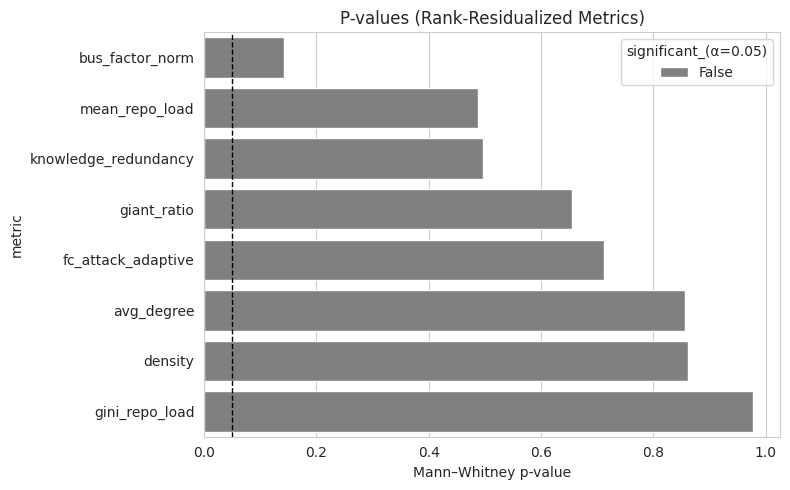

In [ ]:
# ===============================================================
# 🧩 NONPARAMETRIC SIZE-ADJUSTED RESIDUALS & TESTS
# ===============================================================
import numpy as np, pandas as pd
from scipy.stats import rankdata, mannwhitneyu
import seaborn as sns, matplotlib.pyplot as plt

df = merged_df.copy()

metrics = [
    "fc_attack_adaptive","knowledge_redundancy","bus_factor_norm","mean_repo_load",
    "gini_repo_load","density","avg_degree","giant_ratio"
]

# --- Rank-based residuals helper ---
def rank_residualize(x, covariate):
    """Nonparametric residuals by regressing ranks(x) on ranks(covariate)."""
    xr, cr = rankdata(x), rankdata(covariate)
    # Simple linear regression on ranks
    slope = np.cov(xr, cr, ddof=0)[0,1] / np.var(cr)
    intercept = np.mean(xr) - slope * np.mean(cr)
    fitted = intercept + slope * cr
    residuals = xr - fitted
    return residuals

# --- Compute size-adjusted residuals ---
df = df.dropna(subset=["n_contributors"])
for m in metrics:
    df[f"{m}_resid"] = rank_residualize(df[m], df["n_contributors"])

# --- Mann–Whitney on residualized metrics ---
results = []
for m in metrics:
    x = df.loc[df["health_label"]=="Healthy", f"{m}_resid"].dropna()
    y = df.loc[df["health_label"]=="Failed", f"{m}_resid"].dropna()
    if len(x) < 5 or len(y) < 5:
        continue
    U, p = mannwhitneyu(x, y, alternative="two-sided")
    results.append({
        "metric": m,
        "U": U,
        "p_value": p,
        "healthy_median_resid": np.median(x),
        "failed_median_resid": np.median(y)
    })

res_df = pd.DataFrame(results).sort_values("p_value")
res_df["significant_(α=0.05)"] = res_df["p_value"] < 0.05
print("\n📊 Rank-based size-adjusted Mann–Whitney results:")
display(res_df)

# --- Visualization ---
plt.figure(figsize=(8,5))
sns.barplot(data=res_df, y="metric", x="p_value",
            hue="significant_(α=0.05)", dodge=False,
            palette={True:"darkred", False:"gray"})
plt.axvline(0.05, color="black", ls="--", lw=1)
plt.title("P-values (Rank-Residualized Metrics)")
plt.xlabel("Mann–Whitney p-value")
plt.tight_layout()
plt.show()


rank-based size-adjusted MWU

In [ ]:
from scipy.stats import spearmanr
metrics = ["fc_attack_adaptive","bus_factor_norm","density","avg_degree","giant_ratio",
           "knowledge_redundancy","gini_repo_load","mean_repo_load"]

for m in metrics:
    rho, p = spearmanr(merged_df["n_contributors"], merged_df[m], nan_policy="omit")
    print(f"{m:25s}  ρ={rho:6.3f}  p={p:6.4f}")


fc_attack_adaptive         ρ=-0.626  p=0.0000
bus_factor_norm            ρ=-0.894  p=0.0000
density                    ρ=-0.970  p=0.0000
avg_degree                 ρ= 0.640  p=0.0000
giant_ratio                ρ= 0.097  p=0.3444
knowledge_redundancy       ρ=-0.624  p=0.0000
gini_repo_load             ρ= 0.325  p=0.0012
mean_repo_load             ρ= 0.082  p=0.4250


testing correlation of metrics with size

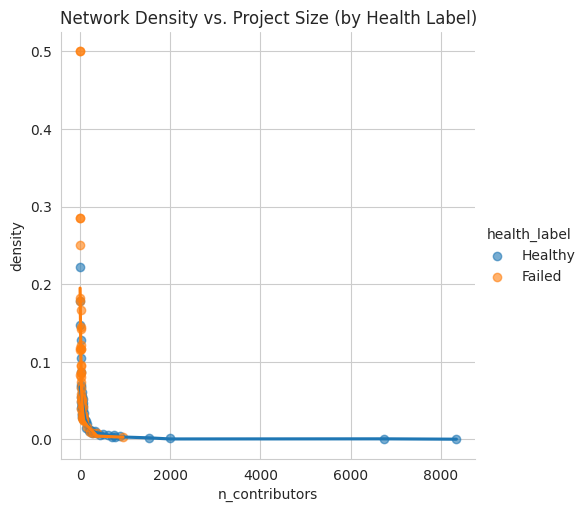

In [ ]:
import seaborn as sns, matplotlib.pyplot as plt

sns.lmplot(
    data=merged_df, x="n_contributors", y="density",
    hue="health_label", scatter_kws={"alpha":0.6}, lowess=True
)
plt.title("Network Density vs. Project Size (by Health Label)")
plt.show()


checking trend.

In [ ]:
merged_df["size_bin"] = pd.qcut(merged_df["n_contributors"], q=4, labels=["Small","Med","Large","XL"])
group_summary = merged_df.groupby("size_bin")[metrics].median()
display(group_summary.round(3))


/tmp/ipython-input-1499511695.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_summary = merged_df.groupby("size_bin")[metrics].median()


,fc_attack_adaptive,bus_factor_norm,density,avg_degree,giant_ratio,knowledge_redundancy,gini_repo_load,mean_repo_load
size_bin,,,,,,,,
Small,0.182,0.167,0.143,2.095,1.000,0.220,0.261,2.000
Med,0.103,0.077,0.049,2.590,0.966,0.138,0.404,2.154
Large,0.103,0.051,0.029,3.290,0.972,0.133,0.513,2.589
XL,0.052,0.021,0.007,3.211,0.992,0.052,0.460,2.088


binning based on size

In [ ]:
from scipy.stats import mannwhitneyu

# Contributors
healthy_c = merged_df.loc[merged_df["health_label"]=="Healthy", "n_contributors"].dropna()
failed_c  = merged_df.loc[merged_df["health_label"]=="Failed", "n_contributors"].dropna()
U_c, p_c = mannwhitneyu(healthy_c, failed_c, alternative="two-sided")

# Repos
healthy_r = merged_df.loc[merged_df["health_label"]=="Healthy", "n_repos"].dropna()
failed_r  = merged_df.loc[merged_df["health_label"]=="Failed", "n_repos"].dropna()
U_r, p_r = mannwhitneyu(healthy_r, failed_r, alternative="two-sided")

print(f"Contributors: U={U_c:.1f}, p={p_c:.4f}")
print(f"Repos:        U={U_r:.1f}, p={p_r:.4f}")


Contributors: U=1720.5, p=0.0001
Repos:        U=1605.5, p=0.0019


testing whether size is correlated with health, size suggests that this is true initially.

In [ ]:
import numpy as np
from scipy.stats import mannwhitneyu, zscore

df = merged_df.copy().dropna(subset=["n_contributors","n_repos"])
# log-transform to reduce skew and normalize scale
df["log_size"] = zscore(np.log1p(df["n_contributors"])) + zscore(np.log1p(df["n_repos"]))

healthy = df.loc[df["health_label"]=="Healthy", "log_size"]
failed  = df.loc[df["health_label"]=="Failed", "log_size"]

U, p = mannwhitneyu(healthy, failed, alternative="two-sided")
print(f"Combined size (contributors + repos): U={U:.1f}, p={p:.4f}")


Combined size (contributors + repos): U=1683.5, p=0.0002


same test, but instead combines n_contributors and n_repos, same results.

In [ ]:
import numpy as np

df = merged_df.dropna(subset=["n_contributors","n_repos","health_label"])
X = np.log1p(df[["n_contributors","n_repos"]]).values
y = np.array(df["health_label"]=="Healthy", dtype=int)

obs_diff = np.linalg.norm(X[y==1].mean(axis=0) - X[y==0].mean(axis=0))
perms = []
for _ in range(5000):
    y_perm = np.random.permutation(y)
    diff = np.linalg.norm(X[y_perm==1].mean(axis=0) - X[y_perm==0].mean(axis=0))
    perms.append(diff)
p_val = np.mean(np.array(perms) >= obs_diff)
print(f"Permutation 2D size difference p={p_val:.4f}")


Permutation 2D size difference p=0.0000


Measure whether Healthy and Failed projects differ systematically in their average log(contributors, repos).

In [ ]:
# ===============================================================
# 🔗 Correlation of Structural Metrics with Project Size (by Health Label)
# ===============================================================
from scipy.stats import spearmanr
import pandas as pd, numpy as np

df = merged_df.copy()

# Metrics that were significant before size control
metrics = ["bus_factor_norm", "knowledge_redundancy", "density"]
size_vars = ["n_contributors", "n_repos"]

results = []

for m in metrics:
    for s in size_vars:
        # overall correlation
        rho_all, p_all = spearmanr(df[m], df[s], nan_policy="omit")

        # separate by health label
        rho_h, p_h = spearmanr(
            df.loc[df["health_label"]=="Healthy", m],
            df.loc[df["health_label"]=="Healthy", s],
            nan_policy="omit"
        )
        rho_f, p_f = spearmanr(
            df.loc[df["health_label"]=="Failed", m],
            df.loc[df["health_label"]=="Failed", s],
            nan_policy="omit"
        )

        results.append({
            "metric": m,
            "size_var": s,
            "ρ_all": rho_all, "p_all": p_all,
            "ρ_Healthy": rho_h, "p_Healthy": p_h,
            "ρ_Failed": rho_f, "p_Failed": p_f
        })

corr_df = pd.DataFrame(results).round(4)
corr_df["significant_all_(α=0.05)"] = corr_df["p_all"] < 0.05

print("\n📊 Spearman correlations between size and structure metrics:")
display(corr_df)



📊 Spearman correlations between size and structure metrics:


,metric,size_var,ρ_all,p_all,ρ_Healthy,p_Healthy,ρ_Failed,p_Failed,significant_all_(α=0.05)
0,bus_factor_norm,n_contributors,-0.8935,0.0,-0.8466,0.0000,-0.8728,0.0000,True
1,bus_factor_norm,n_repos,-0.7578,0.0,-0.6655,0.0000,-0.7571,0.0000,True
2,knowledge_redundancy,n_contributors,-0.6243,0.0,-0.5457,0.0000,-0.6571,0.0000,True
3,knowledge_redundancy,n_repos,-0.5173,0.0,-0.4907,0.0003,-0.4507,0.0015,True
4,density,n_contributors,-0.9698,0.0,-0.9654,0.0000,-0.9472,0.0000,True
5,density,n_repos,-0.8704,0.0,-0.8029,0.0000,-0.8818,0.0000,True


testing correlation

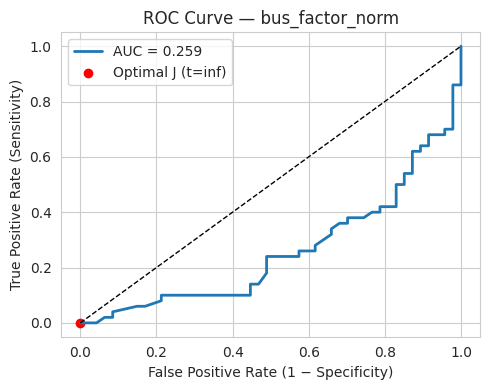

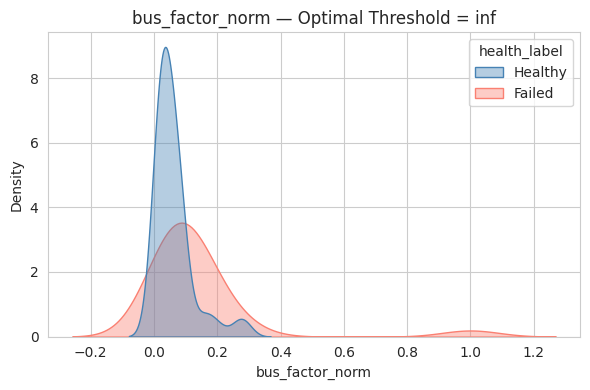

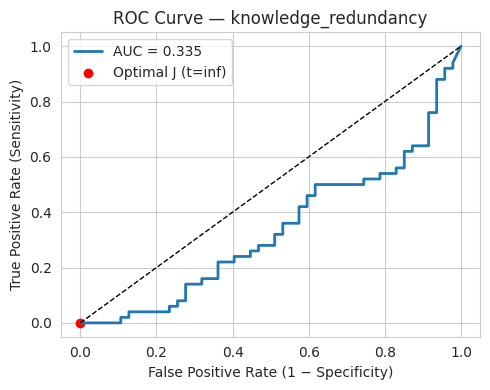

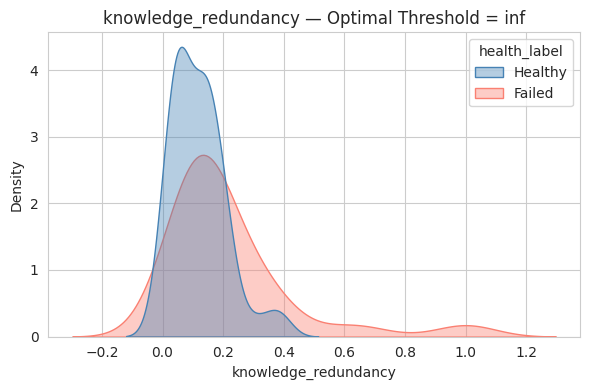

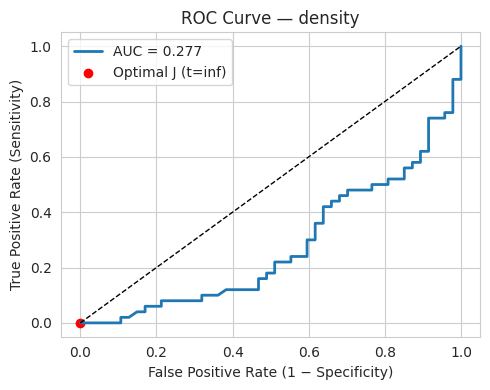

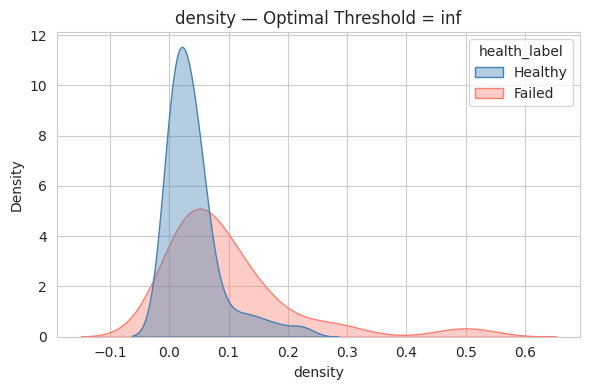


📊 Optimal Thresholds (Youden’s J maximization):


,metric,AUC,optimal_threshold,TPR,FPR
0,bus_factor_norm,0.259,inf,0.0,0.0
1,knowledge_redundancy,0.335,inf,0.0,0.0
2,density,0.277,inf,0.0,0.0


In [ ]:
# ===============================================================
# 🎯 THRESHOLD ANALYSIS: Identify Metric Cutoffs Linked to Health
# ===============================================================
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

df = merged_df.copy()

# --- Metrics to test (size-dependent structural indicators) ---
metrics = ["bus_factor_norm", "knowledge_redundancy", "density"]

# --- Encode labels ---
df["health_label_num"] = (df["health_label"] == "Healthy").astype(int)

threshold_results = []

for m in metrics:
    # Drop NaNs
    sub = df.dropna(subset=[m, "health_label_num"])
    y_true = sub["health_label_num"].values
    y_score = sub[m].values

    # ROC curve
    fpr, tpr, thresh = roc_curve(y_true, y_score)
    auc = roc_auc_score(y_true, y_score)
    J = tpr - fpr
    idx = np.argmax(J)
    opt_thresh = thresh[idx]

    threshold_results.append({
        "metric": m,
        "AUC": auc,
        "optimal_threshold": opt_thresh,
        "TPR": tpr[idx],
        "FPR": fpr[idx]
    })

    # --- Plot ROC curve ---
    plt.figure(figsize=(5,4))
    plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}", lw=2)
    plt.plot([0,1],[0,1],"k--", lw=1)
    plt.scatter(fpr[idx], tpr[idx], color="red", label=f"Optimal J (t={opt_thresh:.3f})")
    plt.xlabel("False Positive Rate (1 − Specificity)")
    plt.ylabel("True Positive Rate (Sensitivity)")
    plt.title(f"ROC Curve — {m}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Plot metric distributions with cutoff ---
    plt.figure(figsize=(6,4))
    sns.kdeplot(data=sub, x=m, hue="health_label",
                fill=True, common_norm=False, alpha=0.4,
                palette={"Healthy":"steelblue","Failed":"salmon"})
    plt.axvline(opt_thresh, color="black", linestyle="--", lw=1.5)
    plt.title(f"{m} — Optimal Threshold = {opt_thresh:.3f}")
    plt.tight_layout()
    plt.show()

threshold_df = pd.DataFrame(threshold_results)
print("\n📊 Optimal Thresholds (Youden’s J maximization):")
display(threshold_df.round(3))


determining if there is a certain threshold where each metric that was significant (when we didn't control for size) has a significant relationship with health and size. The "inf" and TRP and FRP being 0 indicates that the metrics do not have any discriminative power between the two samples (can also be an issue with values)

In [ ]:
!pip install dcor
import dcor
dcor.distance_correlation(df[metrics].values, df["health_label_num"].values)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 2.1 MB/s eta 0:00:00


np.float64(0.3450450226450729)

In [ ]:
for m in metrics:
    print(m, dcor.distance_correlation(df[m].values, df["health_label_num"].values))


bus_factor_norm 0.3416467276598401
knowledge_redundancy 0.29641392105675296
density 0.35718559843263814


/usr/local/lib/python3.12/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(int64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


In [ ]:
dcor.partial_distance_correlation(
    df[metrics].values,
    df["health_label_num"].values,
    df[["n_contributors", "n_repos"]].values
)


np.float64(0.09031270634554428)

In [ ]:
import dcor
import numpy as np

# Extract data arrays
X = df[["bus_factor_norm", "knowledge_redundancy", "density"]].values
Y = df["health_label_num"].values
Z = df[["n_contributors", "n_repos"]].values

# Compute partial distance correlation statistic
stat = dcor.partial_distance_correlation(X, Y, Z)

# Permutation test (10,000 resamples)
perm_test = dcor.independence.partial_distance_covariance_test(
    X, Y, Z, num_resamples=10000, random_state=42
)

print(f"Partial distance correlation: {stat:.4f}")
print(f"Permutation p-value: {perm_test.pvalue:.6f}")


Partial distance correlation: 0.0903
Permutation p-value: 0.000500


In [ ]:
import dcor, numpy as np
x = df[metrics].values
y = df["health_label_num"].values
dcor_test = dcor.independence.distance_covariance_test(x, y, num_resamples=10000)
print(dcor_test.statistic, dcor_test.p_value)


0.536435856904494 0.00039996000399960006


/tmp/ipython-input-1856657947.py:5: DeprecationWarning: Attribute "p_value" deprecated, use "pvalue" instead.
  print(dcor_test.statistic, dcor_test.p_value)


In [ ]:
for s in ["n_contributors", "n_repos"]:
    sub = df.dropna(subset=[s, "health_label_num"])
    fpr, tpr, thr = roc_curve(sub["health_label_num"], np.log1p(sub[s]))
    auc = roc_auc_score(sub["health_label_num"], np.log1p(sub[s]))
    J = tpr - fpr; idx = np.argmax(J)
    print(f"{s:15s}  AUC={auc:.3f}  threshold≈log1p({thr[idx]:.1f}) → {np.expm1(thr[idx]):.0f}")


n_contributors   AUC=0.732  threshold≈log1p(3.4) → 30
n_repos          AUC=0.683  threshold≈log1p(3.1) → 22


/tmp/ipython-input-2419515500.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for bin_name, g in sub.groupby("size_bin"):
/tmp/ipython-input-2419515500.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for bin_name, g in sub.groupby("size_bin"):
/tmp/ipython-input-2419515500.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for bin_name, g in sub.groupby("size_bin"):
/tmp/ipython-input-2419515500.py:24: Future


📊 Size-Binned Discriminative Summary:


/tmp/ipython-input-2419515500.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for bin_name, g in sub.groupby("size_bin"):


,metric,size_var,peak_AUC,mean_AUC,bins_Healthy_like,bins_Failed_like,total_bins,Healthy_like_%,Failed_like_%
0,bus_factor_norm,n_contributors,0.611,0.426,4,4,8,50.0,50.0
1,bus_factor_norm,n_repos,0.500,0.340,0,8,8,0.0,100.0
2,density,n_contributors,0.875,0.486,3,5,8,37.5,62.5
3,density,n_repos,0.611,0.368,2,6,8,25.0,75.0
4,knowledge_redundancy,n_contributors,0.909,0.513,3,5,8,37.5,62.5
5,knowledge_redundancy,n_repos,0.639,0.443,4,4,8,50.0,50.0


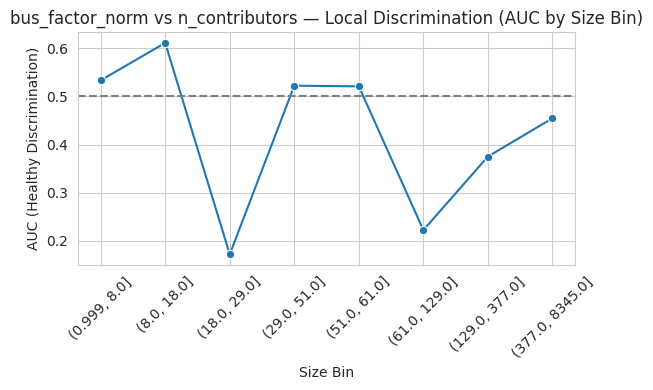

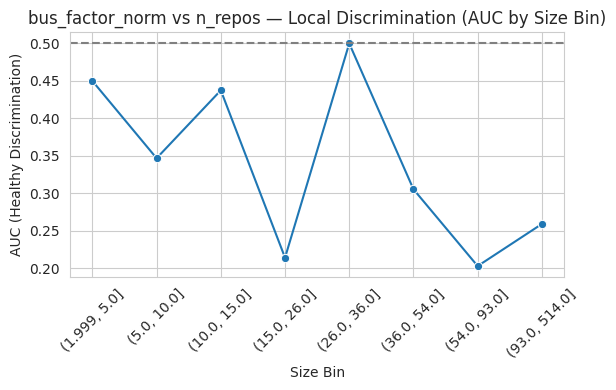

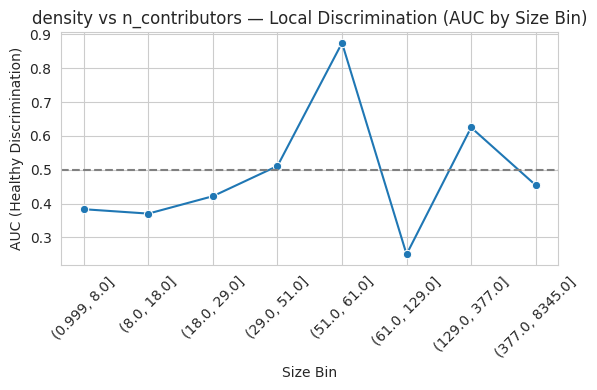

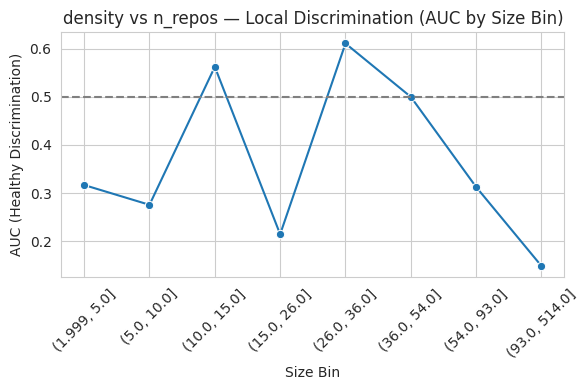

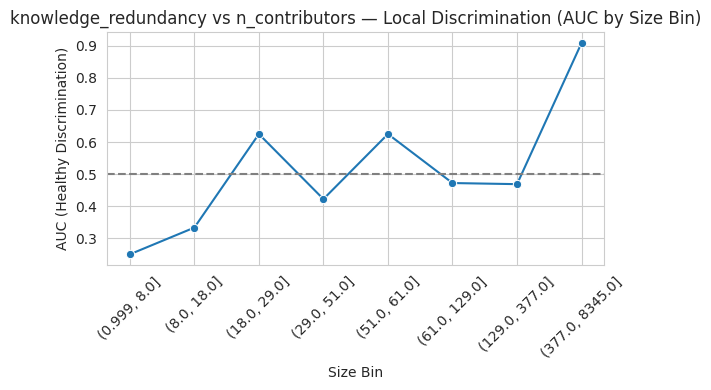

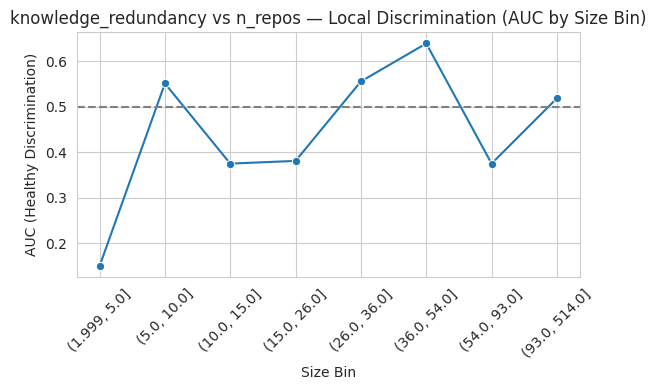

In [ ]:
# ===============================================================
# 🎯 SIZE-BINNED DISCRIMINATIVE ANALYSIS
# ===============================================================
from sklearn.metrics import roc_auc_score
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns

df = merged_df.copy()
df["health_label_num"] = (df["health_label"] == "Healthy").astype(int)

metrics = ["bus_factor_norm", "knowledge_redundancy", "density"]
size_vars = ["n_contributors", "n_repos"]

n_bins = 8     # number of bins across size range
min_n = 10     # min obs per bin for a valid AUC

bin_results = []

for s in size_vars:
    # create size bins directly from quantiles
    df["size_bin"] = pd.qcut(df[s], q=n_bins, duplicates="drop")
    for m in metrics:
        sub = df[[m, "size_bin", "health_label_num"]].dropna()
        group_stats = []
        for bin_name, g in sub.groupby("size_bin"):
            if len(g["health_label_num"].unique()) < 2 or len(g) < min_n:
                continue
            auc = roc_auc_score(g["health_label_num"], g[m])
            group_stats.append({
                "metric": m,
                "size_var": s,
                "size_bin": str(bin_name),
                "n": len(g),
                "auc": auc
            })
        if group_stats:
            tmp = pd.DataFrame(group_stats)
            bin_results.append(tmp)

# --- Combine all results
bin_df = pd.concat(bin_results, ignore_index=True)
bin_df["discrimination"] = np.where(bin_df["auc"] > 0.5, "Healthy-like", "Failed-like")

# --- Summary by metric × size_var
summary = (
    bin_df.groupby(["metric", "size_var"])
    .agg(
        peak_AUC=("auc", "max"),
        mean_AUC=("auc", "mean"),
        bins_Healthy_like=("discrimination", lambda x: (x=="Healthy-like").sum()),
        bins_Failed_like=("discrimination", lambda x: (x=="Failed-like").sum())
    )
    .reset_index()
)
summary["total_bins"] = summary["bins_Healthy_like"] + summary["bins_Failed_like"]
summary["Healthy_like_%"] = (summary["bins_Healthy_like"]/summary["total_bins"]*100).round(1)
summary["Failed_like_%"] = (summary["bins_Failed_like"]/summary["total_bins"]*100).round(1)

print("\n📊 Size-Binned Discriminative Summary:")
display(summary.round(3))

# --- Plotting
for (m, s), sub in bin_df.groupby(["metric", "size_var"]):
    plt.figure(figsize=(6,4))
    sns.lineplot(data=sub, x="size_bin", y="auc", marker="o")
    plt.axhline(0.5, color="gray", ls="--")
    plt.title(f"{m} vs {s} — Local Discrimination (AUC by Size Bin)")
    plt.xticks(rotation=45)
    plt.ylabel("AUC (Healthy Discrimination)")
    plt.xlabel("Size Bin")
    plt.tight_layout()
    plt.show()


In [ ]:
res = discriminative_threshold_by_size(df, "bus_factor_norm", "n_contributors")


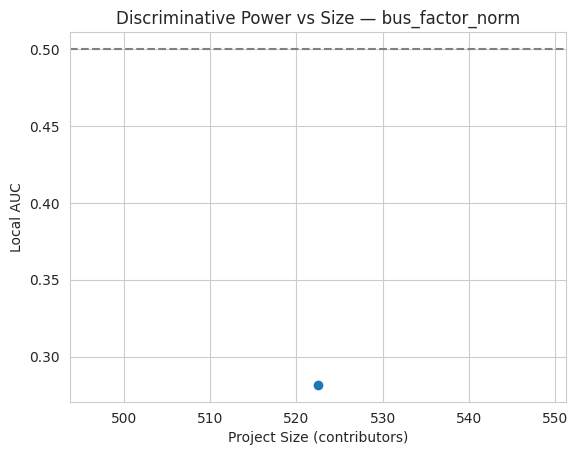

In [ ]:
import matplotlib.pyplot as plt
plt.plot(res["size_mid"], res["auc"], marker="o")
plt.axhline(0.5, color="gray", ls="--")
plt.xlabel("Project Size (contributors)")
plt.ylabel("Local AUC")
plt.title("Discriminative Power vs Size — bus_factor_norm")
plt.show()


shows that there may not be a causal link

In [ ]:
merged_df.head()

,project,health_label,nodes,edges,density,bipartite_density,components,giant_ratio,avg_degree,dev_count,...,ego_edges,fc_attack_adaptive,knowledge_redundancy,bus_factor_norm,mean_repo_load,gini_repo_load,n_repos,n_contributors,n_commits,size_bin
0,Ethereum,Healthy,7255,17827,0.000677,0.005145,9,0.994624,4.914404,6741,...,64,0.050034,0.007586,0.003709,2.644563,0.474731,514,6741,501230.0,XL
1,ChainLink,Healthy,986,2636,0.005428,0.015253,6,0.973631,5.346856,758,...,56,0.101420,0.030402,0.022427,3.477573,0.525328,228,758,107606.0,XL
2,Lido,Healthy,784,1572,0.005122,0.015673,2,0.994898,4.010204,623,...,46,0.102041,0.035293,0.038523,2.523274,0.536287,161,623,51160.0,XL
3,Aave,Healthy,275,445,0.011812,0.033697,2,0.992727,3.236364,213,...,21,0.101818,0.061854,0.023474,2.089202,0.462373,62,213,14460.0,XL
4,Balancer,Healthy,395,817,0.010499,0.038089,3,0.989873,4.136709,330,...,28,0.101266,0.051746,0.033333,2.475758,0.481937,65,330,48361.0,XL


Given our checks and performant measures, we conclude that centrality-based forms of stress-testing do not effectively or significantly capture why projects fail in cryptocurrency ecosystems

As suspected, it appears that using centrality as a means of evaluating the risk of cryptocurrency projects is futile, primarily because from our sample of projects, there appear to be no significant differences in centrality measures, or critical fraction fc. Next thing we want to test is whether the size of the network confounds our results, so we will first test this statistically and then depending on our results we can run them again, this time accounting for network size. We also want to see if we see the same thing happen in the time-series data, and then find literature that corresponds with our study to try to explain why this happened.


So here we wanted to take the analysis further after fc didn't seem to show significant differences between the two samples. But the next thing we wanted to analyze is sensitivity between the healthy and failed samples. We want to determine what fc does when we perturb certain features of the network, and see how the results differ between the two samples. We find that the healthy projects are far more sensitive to the stress-testing, and this could be because the network is more 'alive' while failed networks are already broken to a point where stress-testing doesn't really do much to cause the network to collapse. But now we want to test whether this conclusion is indeed correct.



So what are the takeaways here? I noticed two key things. One was the fact that the failed projects have 2 key issues, contributor bottlenecks and groups of small clusters that are completely disconnected. The healthy projects on the other hand, appear to have bottlenecks where, if we remove the top contributor, the two clusters will be completely disconnected. So I think we should choose metrics to analyze that model these two phenomena.

From our initial analysis of three failed and three healthy projects, a couple key characteristics can be seen. The first is that many of the projects rely on a single core contributor, and while in other literature removing the key contributor may seem like an obvious way to collapse the network. That is precisely what is important to highlight, because it signals a lack of redundancy among the project's organization. Taking away a network's core contributor does not necessarily mean that the network will collapse, but from our inital analysis, we see that centrality of contributors is a key reason for bottlenecking. We aim to more formally validate this using methods from Jeong et. al, who utilizes a threshold methodology that carefully simulates targeted attacks on the network, showing that for scale-free networks (our network archetype), removing the top-contributor significantly cripples the ability of the network to function. We test this with our set of failed and healthy projects, and find that the same issue with centrality as a point of vulnerability is present. The next steps are to apply this to a much larger set of projects that have failed and are healthy to test if the patterns tested here can be seen at a broader scale throughout the ecosystem. if this is true, then we can find ways to incorporate centrality into a series of other metrics to create an index that can elucidate a project's risk level.